pip install seaborn

# Categorical Plots

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

In [24]:
countries_df=pd.read_csv(r'C:\Users\ADMIN\Desktop\MY COURSES\PYTHON KNOWLEDGE\Course Resurces-Python for Data Analysis and Visualization\14 Seaborn\02 Categorical Plots\top_10_countries.csv')

In [25]:
countries_df

,Rank,Country,Region,Sub Region,Population,% of world,Date
0,1,China,Asia,Eastern Asia,1412600000,17.80%,31-Dec-21
1,2,India,Asia,Southern Asia,1386946912,17.50%,18-Jan-22
2,3,United States,Americas,Northern America,333073186,4.20%,18-Jan-22
3,4,Indonesia,Asia,Southeast Asia,271350000,3.42%,31-Dec-20
4,5,Pakistan,Asia,Southern Asia,225200000,2.84%,01-Jul-21
5,6,Brazil,Americas,Southern America,214231641,2.70%,18-Jan-22
6,7,Nigeria,Africa,Western Africa,211401000,2.67%,01-Jul-21
7,8,Bangladesh,Asia,Southern Asia,172062576,2.17%,18-Jan-22
8,9,Russia,Europe,Eastern Europe,146171015,1.84%,01-Jan-21
9,10,Mexico,Americas,Central America,126014024,1.59%,02-Mar-20


## Barplot

https://seaborn.pydata.org/generated/seaborn.barplot.html

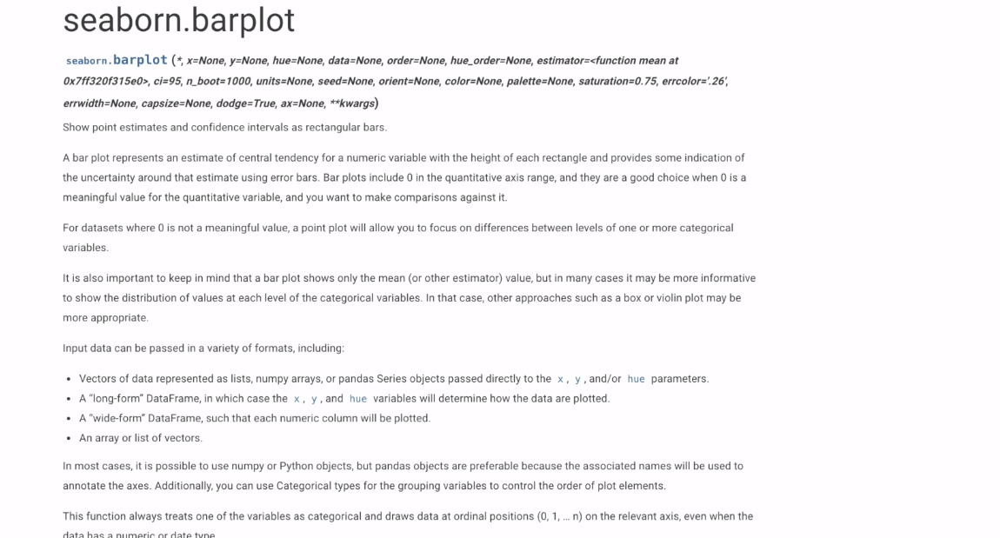

A key arguement to pay attention to is the estimator arguement. By default it's mean and we can change it to sum, max etc when need be.

<Axes: xlabel='Region', ylabel='Population'>

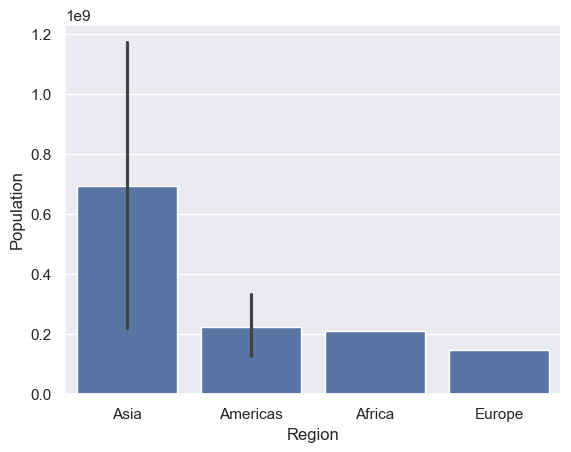

In [26]:
# A bargraph of the mean of the regions' population
sb.barplot(x='Region',y='Population',data=countries_df)

<b>The black lines are error bars. They serve as confidence intervals. By default at 5% error margin.

We can remove the confidence interval by specifying None for the errorbar arguement. 

We can also set the ci agruement to None but that isn't the most appropriate approach as it eliminates confidence intervals completely from the plot and no future estimation that require confidence interval can be made.

<Axes: xlabel='Region', ylabel='Population'>

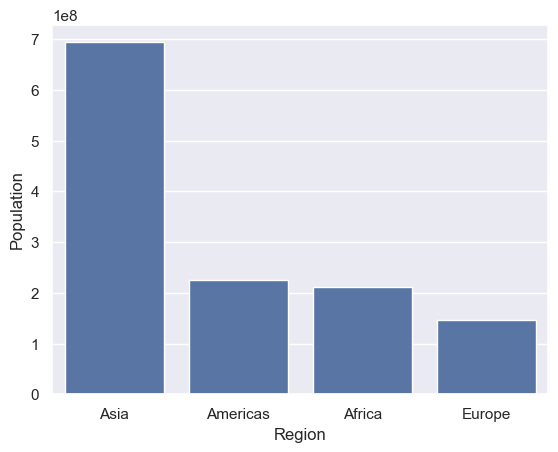

In [27]:
sb.barplot(x='Region',y='Population',data=countries_df,errorbar=None )

Notice the change in y-axis.

<b> We can change this to a horizontal plot by swapping out the x and y.

<Axes: xlabel='Population', ylabel='Region'>

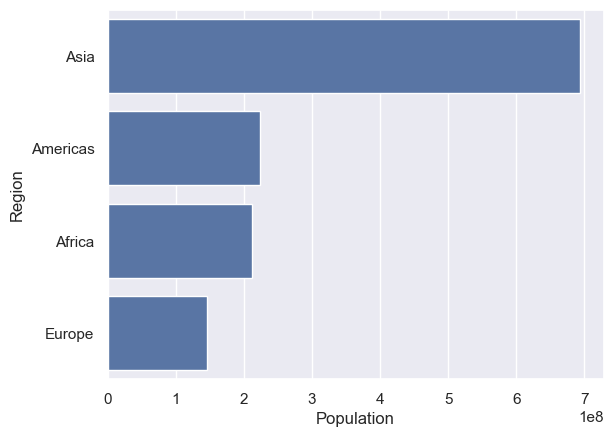

In [28]:
sb.barplot(y='Region',x='Population',data=countries_df,errorbar=None )

<Axes: xlabel='Region', ylabel='Population'>

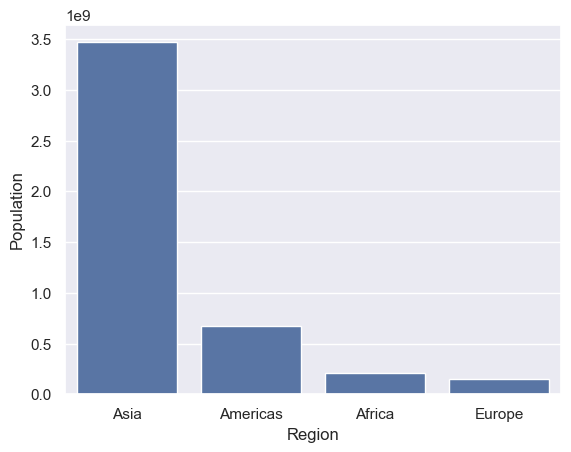

In [29]:
# creating a bargraph of the regions' population by sum
sb.barplot(x='Region',y='Population', data=countries_df, errorbar=None,estimator=sum)

The hue arguement can color code and we can then add a legend based of the hue using legend=True.

<Axes: xlabel='Region', ylabel='Population'>

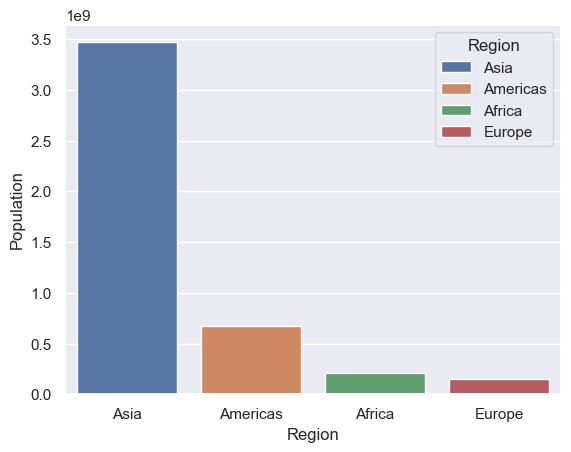

In [30]:
sb.barplot(x='Region',y='Population', data=countries_df, errorbar=None,estimator=sum,hue='Region',legend=True)

We can use matplotlib and seaborn together.

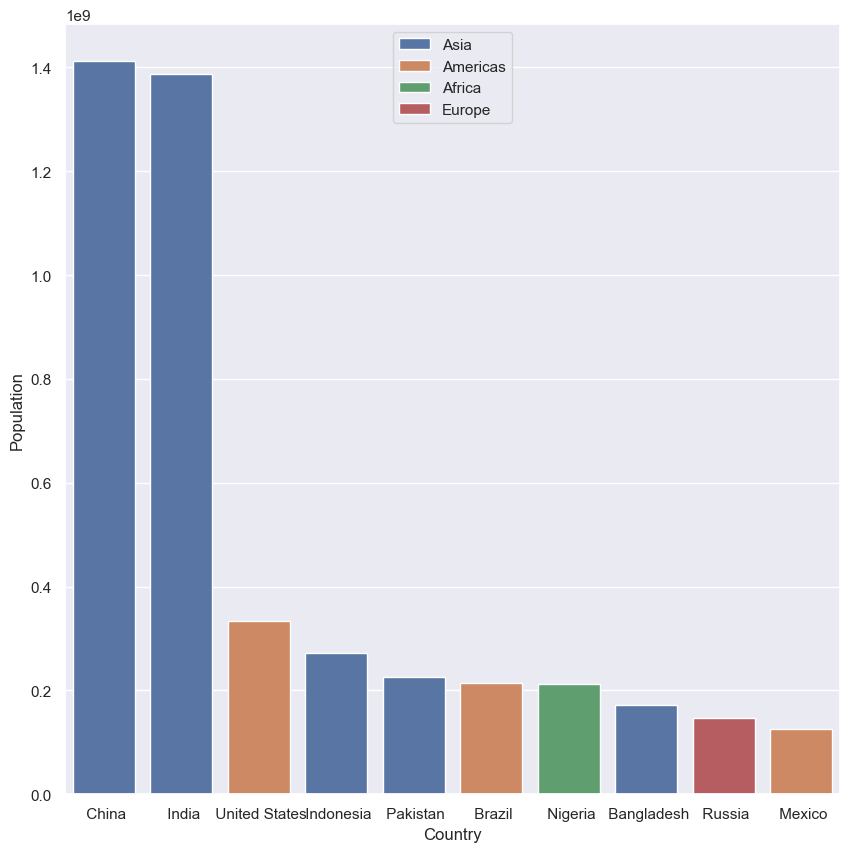

In [31]:
# creating a figure
plt.figure(figsize=[10,10])

# creating a bar graph using seaborn
sb.barplot(x='Country', y='Population', data=countries_df,estimator=sum,hue='Region')

# finishing up with more matplotlib functionalities
plt.legend(loc='upper center') # This HAS to come after the labels have been created!
plt.show()


If we create an axis or axes(i.e using subplots) we can pass these axes in the ax arguement in seaborn plots.

<Axes: xlabel='Country', ylabel='Population'>

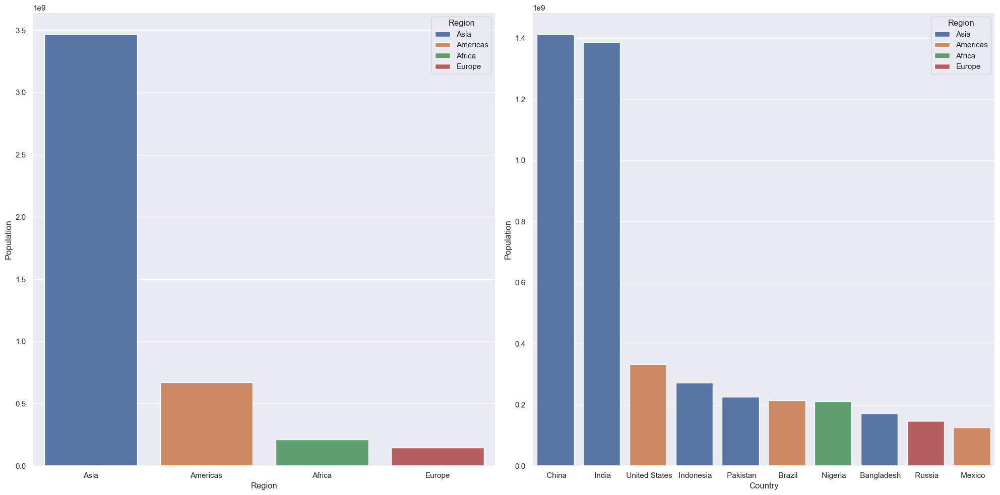

In [32]:
fig,(ax1,ax2)=plt.subplots(1,2,tight_layout=True,figsize=[20,10])

sb.barplot(data=countries_df,x='Region',y='Population',ax=ax1, errorbar=None,hue='Region',estimator=sum,legend=True)
sb.barplot(data=countries_df,x='Country',y='Population',ax=ax2, errorbar=None,hue='Region',estimator=sum,legend=True)

## Countplot

https://seaborn.pydata.org/generated/seaborn.countplot.html

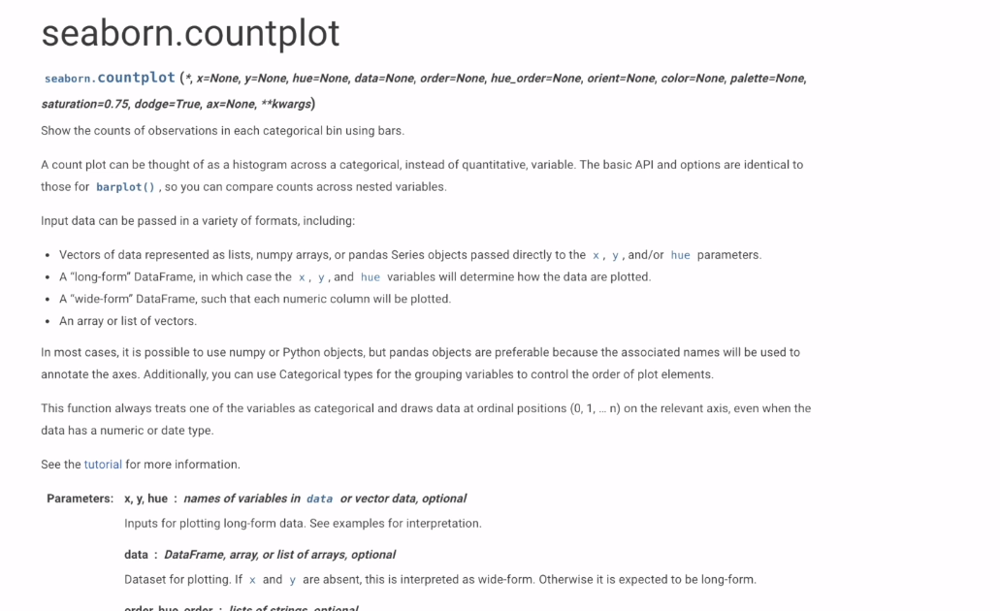

A countplot is just like a barplot only that the estimator is count in stead of mean.

The arguements of a bar and count plot are identical except countplots can only take either x or y and not both!

<Axes: xlabel='Region', ylabel='count'>

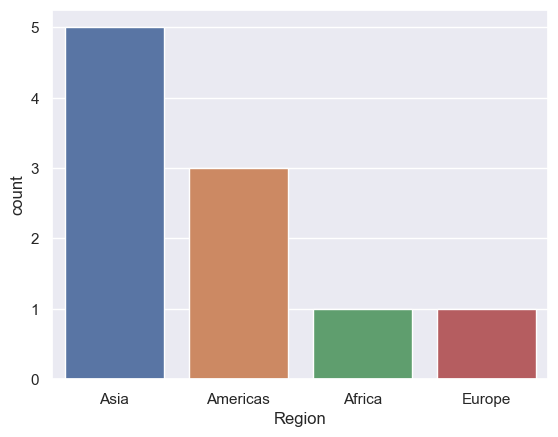

In [33]:
# performing a count on the regions column.

sb.countplot(data=countries_df,x='Region',hue='Region')

<Axes: xlabel='count', ylabel='Region'>

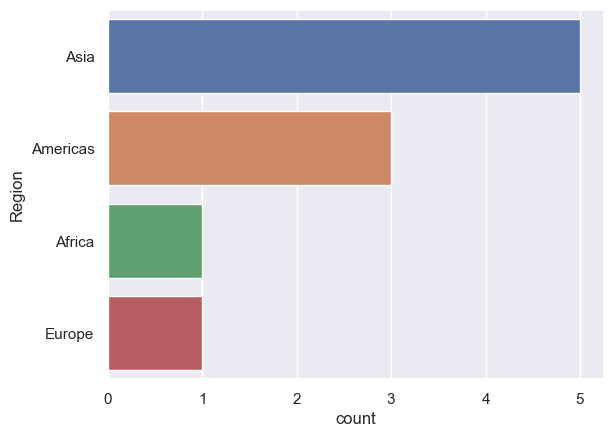

In [34]:
# Changing to horizontal bars
sb.countplot(data=countries_df,y='Region',hue='Region')

## Boxplot

https://seaborn.pydata.org/generated/seaborn.boxplot.html

<b> *Loading in the data*

In [35]:
players=pd.read_csv(r'C:\Users\ADMIN\Desktop\MY COURSES\PYTHON KNOWLEDGE\Course Resurces-Python for Data Analysis and Visualization\14 Seaborn\02 Categorical Plots\players_21_top_100.csv')

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_9256\2235172555.py:1: DtypeWarning: Columns (1,2,3,5,8,9,10,16,17,21,22,23,25,26) have mixed types. Specify dtype option on import or set low_memory=False.
  players=pd.read_csv(r'C:\Users\ADMIN\Desktop\MY COURSES\PYTHON KNOWLEDGE\Course Resurces-Python for Data Analysis and Visualization\14 Seaborn\02 Categorical Plots\players_21_top_100.csv')


In [36]:
pd.set_option('display.max_columns',False)

In [37]:
players.head(1)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,...,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023.0,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33.0,24/06/1987,170.0,72.0,Argentina,FC Barcelona,Spain Primera Division,1.0,93.0,93.0,67500000.0,560000.0,"RW, ST, CF",Left,5.0,4.0,4.0,Medium/Low,Messi,Yes,138400000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...",CAM,10.0,NaN,01/07/2004,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,...,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3


<Axes: xlabel='overall'>

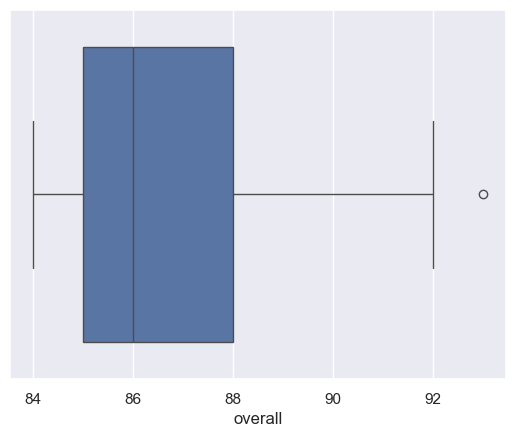

In [38]:
sb.boxplot(x='overall', data=players)

<Axes: ylabel='overall'>

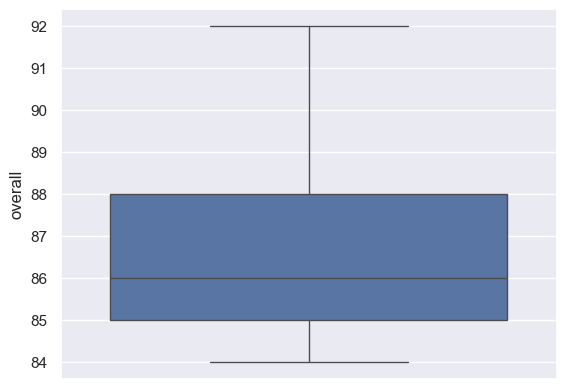

In [39]:
# Changing to vertical by swapping out x for y
sb.boxplot(y='overall',data=players,showfliers=None) # removing the oultiers 

<Axes: ylabel='overall'>

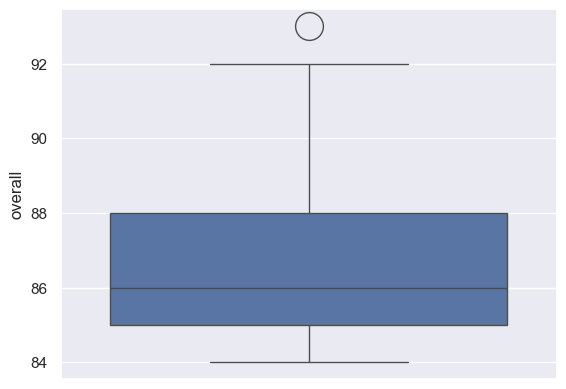

In [40]:
# we could also  increase the outlier circle size using fliersize arguement
sb.boxplot(y='overall',data=players,fliersize=20) 

# if we set fliersize to 0 it would appear the same as removing outliers using showfliers=None


We can add more measurements by adding the to the remaing axis.

<Axes: xlabel='league_name', ylabel='overall'>

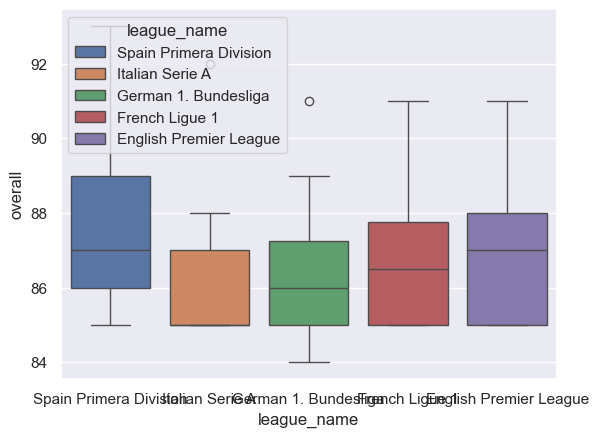

In [41]:
# Let us compare overall from all the leagues by passing league_name as the y parameter
sb.boxplot(y='overall', x='league_name',data=players, hue='league_name')

<Axes: xlabel='league_name', ylabel='overall'>

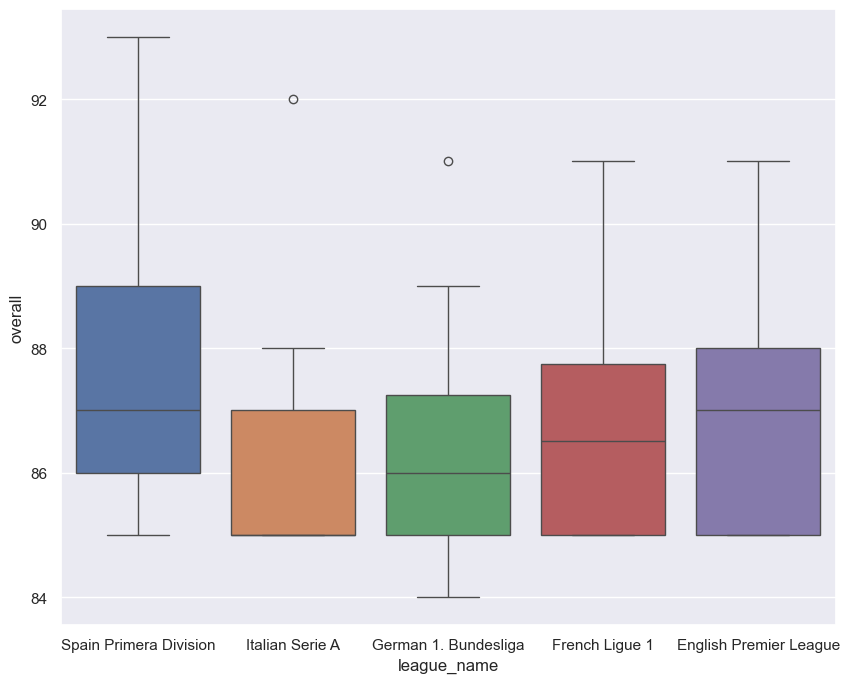

In [42]:
# let us increase the figsize so its not so smushy

plt.figure(figsize=[10,8])
sb.boxplot(y='overall', x='league_name',data=players, hue='league_name',legend=False)

## Violinplot

https://seaborn.pydata.org/generated/seaborn.violinplot.html

<Axes: xlabel='league_name', ylabel='overall'>

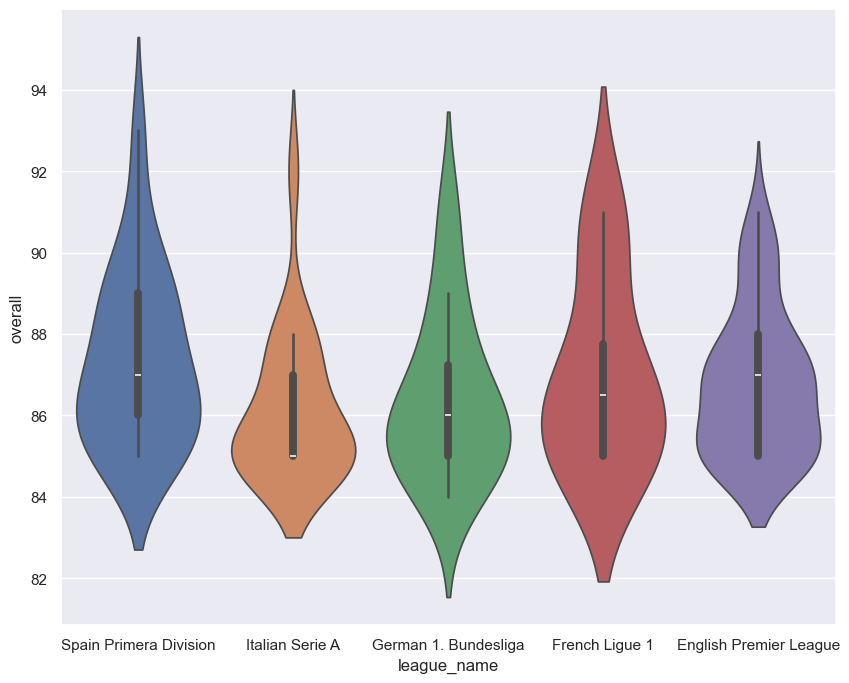

In [43]:
# almost identical syntax as boxplot

plt.figure(figsize=[10,8])
sb.violinplot(y='overall', x='league_name',data=players, hue='league_name',legend=False)

The good thing about seaborn violinplots is they come with boxplots already inside them.  

## Stripplot

<b>A stripplot can show you all the observations of your data as dots. 

https://seaborn.pydata.org/generated/seaborn.stripplot.html

<Axes: xlabel='league_name', ylabel='overall'>

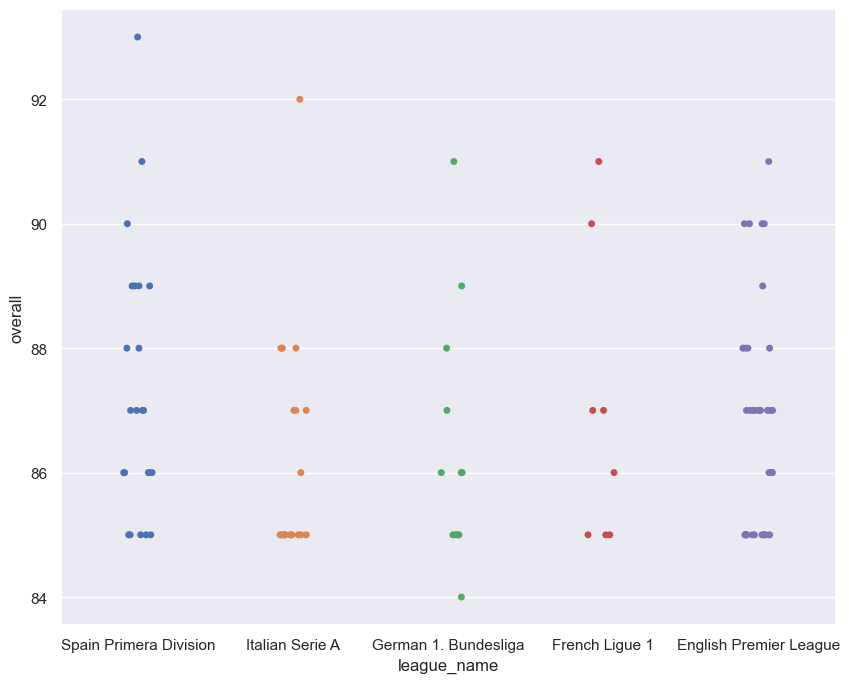

In [44]:
# Again quite a similar syntax

plt.figure(figsize=[10,8])
sb.stripplot(y='overall', x='league_name',data=players, hue='league_name',legend=False)

Now, you can see by eaach league where the data points are.

<b> Strip plots can complement the other plots very nicely as well.

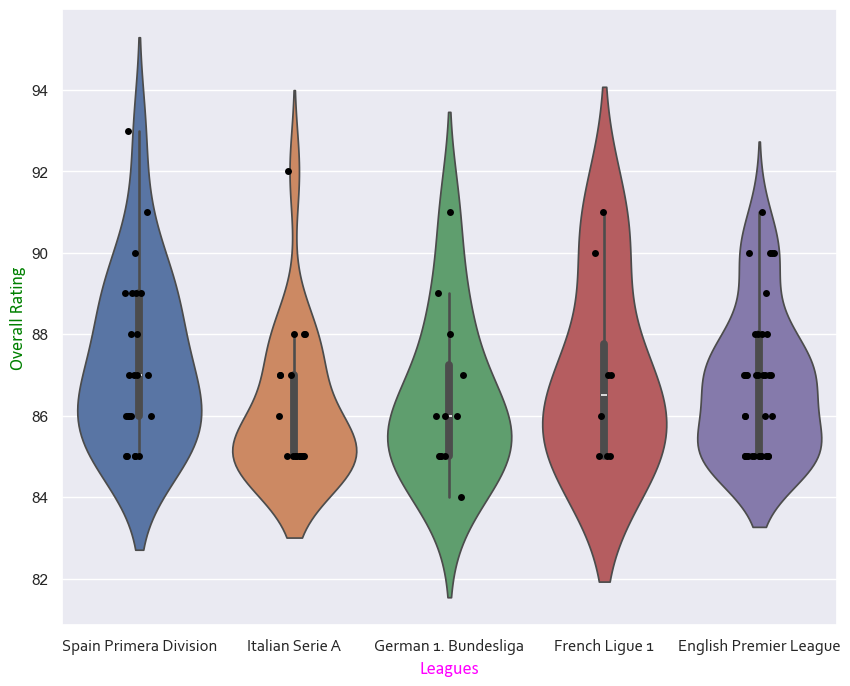

In [45]:
plt.figure(figsize=[10,8])


sb.violinplot(y='overall', x='league_name',data=players, hue='league_name',legend=False)
sb.stripplot(y='overall', x='league_name',data=players, color='black',legend=False)

#adding some customization using matplot codes
plt.xlabel('Leagues', font='Calibri',fontsize=13,color='magenta')
plt.ylabel('Overall Rating', font='Calibri',fontsize=13,color='green')
plt.xticks(font='Corbel')

plt.show()

An area with more dots will have a wider width in the violin plot.

## Swarmplot

<b>This is just like a stripplot only that matching values are more evenly spread out.

https://seaborn.pydata.org/generated/seaborn.swarmplot.html

<Axes: xlabel='league_name', ylabel='overall'>

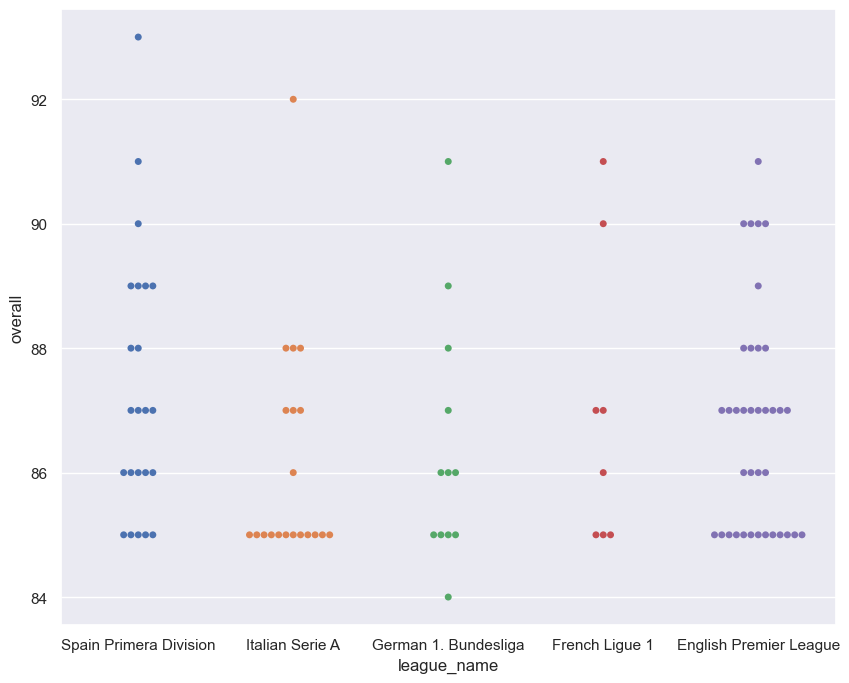

In [46]:
plt.figure(figsize=[10,8])

sb.swarmplot(y='overall', x='league_name',data=players, hue='league_name',legend=False)

Text(0.5, 1.0, 'Swarmplot')

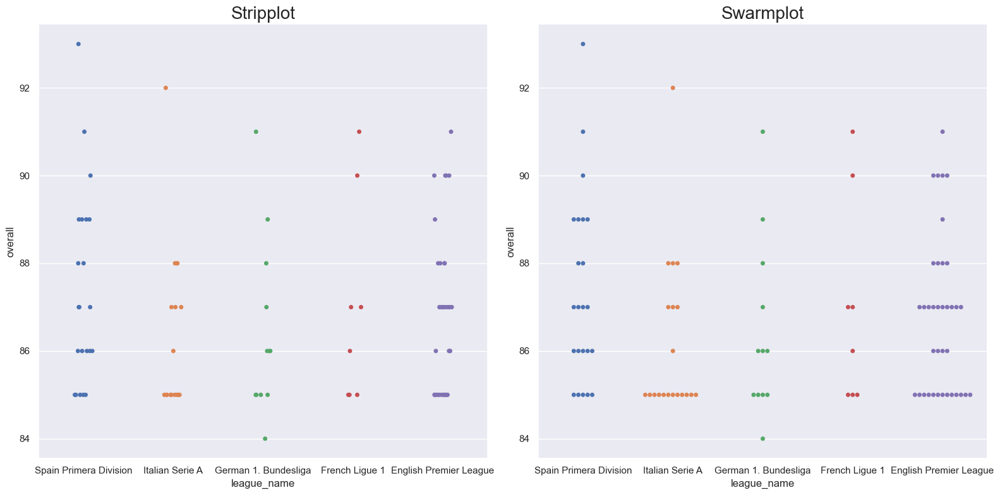

In [47]:
# DISPLAYING THE DIFFERENCE BETWEEN A STRIP AND SWARM PLOT.
fig,(ax1,ax2)=plt.subplots(1,2,figsize=[16,8],tight_layout=True)

sb.stripplot(y='overall', x='league_name',data=players, hue='league_name',legend=False,ax=ax1)
sb.swarmplot(y='overall', x='league_name',data=players, hue='league_name',legend=False,ax=ax2)

#titles
ax1.set_title('Stripplot',fontsize=20)
ax2.set_title('Swarmplot',fontsize=20)

## Pointplot

<b>What a pointplot does it shows the summary statistic(mean by default) of a numeric variable along side with its confidence interval.

https://seaborn.pydata.org/generated/seaborn.pointplot.html

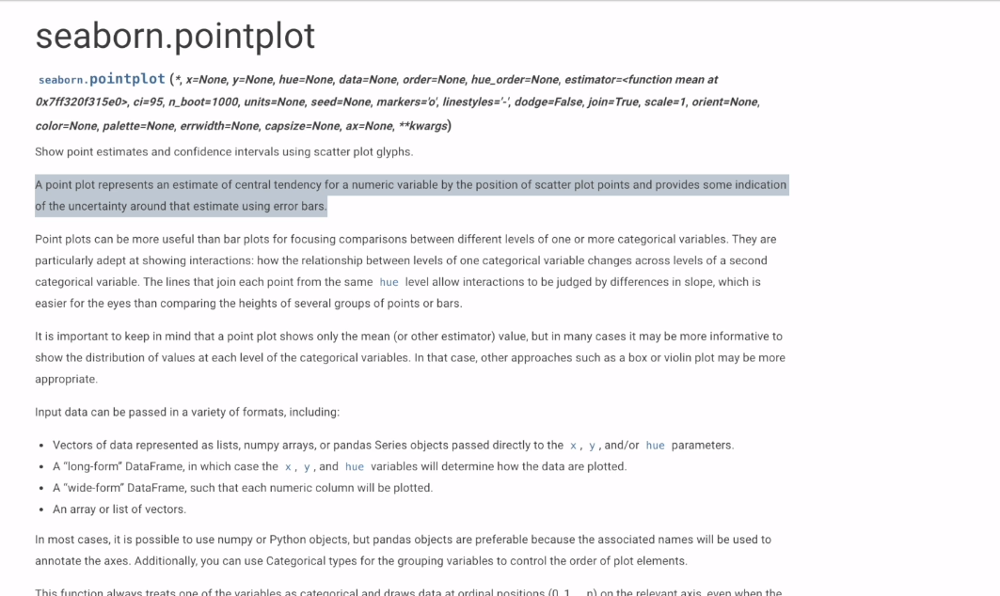

<Axes: ylabel='overall'>

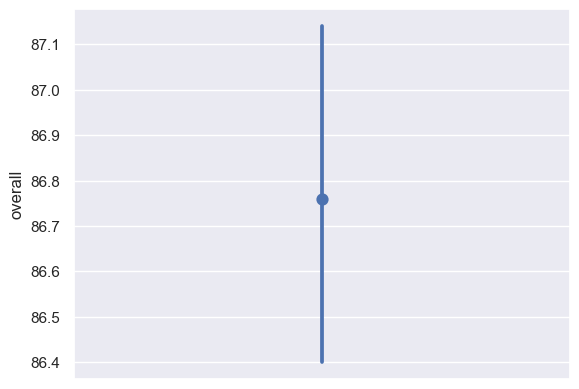

In [48]:
sb.pointplot(y='overall',data=players)

We can see that the mean of the top 100 players is around 86.75

<Axes: ylabel='overall'>

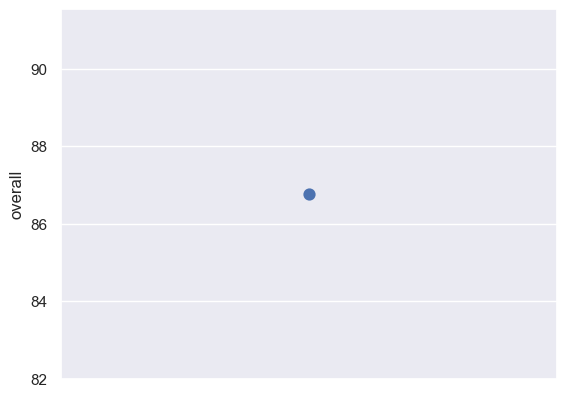

In [49]:
# We can remove the error bar if we wanted
sb.pointplot(y='overall',data=players, errorbar=None)

<Axes: xlabel='preferred_foot', ylabel='overall'>

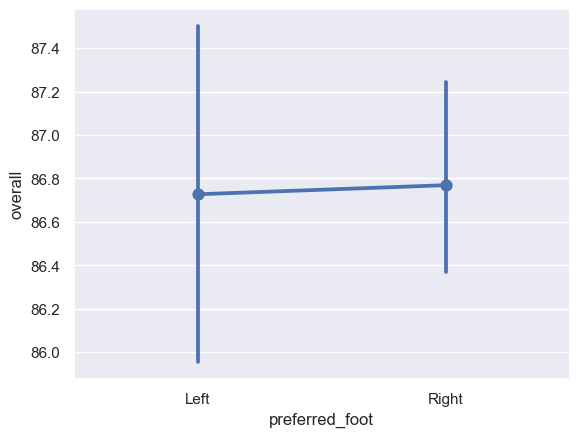

In [50]:
# lets other another measurement: players preffered foot
sb.pointplot(y='overall',x='preferred_foot',data=players,)

The mean overall rating for left-footed players is slightly lower than right footed players.

The confidence interval for left footed players is wider. From statistics, we can recall that one of the potential causes of a wider confidence interval is a smaller sample size. 

The other reason is a bigger alpha-level/margin of error. However, since we have used the same alpha level for both left and right footed players. This is not longer a potential cause.

<b>We, therefore, default to the prior assumption that the wider confidence interval is caused by a smaller sample size for left-footed players.

<Axes: xlabel='overall', ylabel='league_name'>

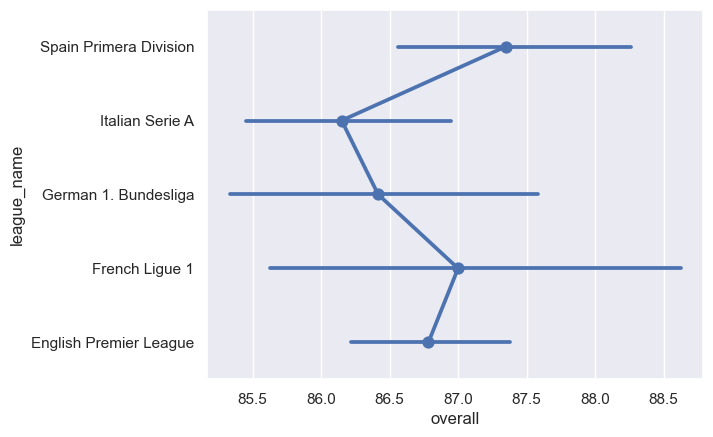

In [51]:
# Using league_name as the other measurement

sb.pointplot(data=players,x='overall',y='league_name')

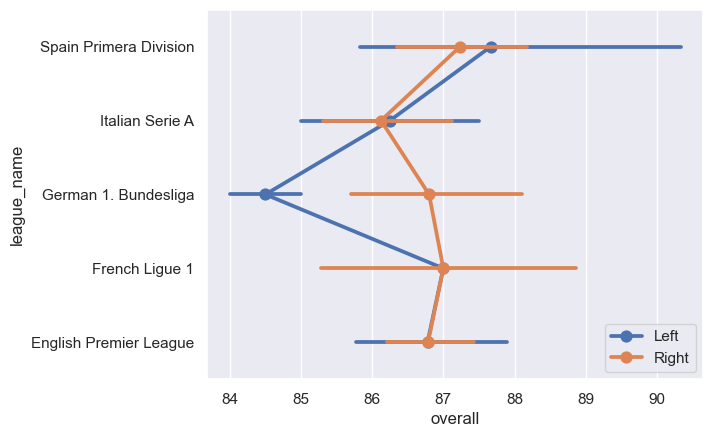

In [52]:
# Using league_name as the other measurement and preffered_foot as hue

sb.pointplot(data=players,x='overall',y='league_name', hue='preferred_foot')

plt.legend(loc='lower right')

We thus have two pointplots for each league: the orange pointplot for right-footed players and the blue for left-footed players.

# Relational plots

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np
import datetime as dt

In [54]:
stocks = pd.read_excel(r'C:\Users\ADMIN\Desktop\MY COURSES\PYTHON KNOWLEDGE\Course Resurces-Python for Data Analysis and Visualization\14 Seaborn\03 Relational Plots\stocks.xlsx')

In [55]:
stocks.head()

,Symbol,Date,Open,High,Low,Close,Adj Close,Volume
0,AAPL,2017-01-27,30.535000,30.587500,30.400000,30.487499,28.697330,82251600
1,AAPL,2017-01-30,30.232500,30.407499,30.165001,30.407499,28.622028,121510000
2,AAPL,2017-01-31,30.287500,30.347500,30.155001,30.337500,28.556135,196804000
3,AAPL,2017-02-01,31.757500,32.622501,31.752501,32.187500,30.297506,447940000
4,AAPL,2017-02-02,31.995001,32.347500,31.945000,32.132500,30.245735,134841600


This is a dataset on the stocks of Apple, Microsoft and Facebook per day. 

In [56]:
stocks['Year']=stocks['Date'].dt.strftime('%Y')

In [57]:
sb.set_theme() # this activates the seaborn default theme for all our plots.

## Lineplot

https://seaborn.pydata.org/generated/seaborn.lineplot.html

<Axes: xlabel='Date', ylabel='Close'>

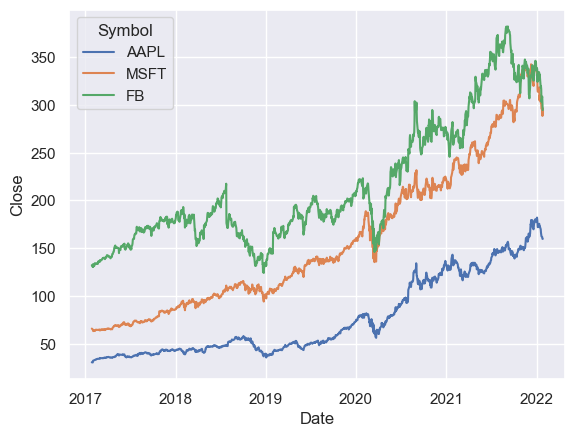

In [58]:
sb.lineplot(x='Date',y='Close',data=stocks,hue='Symbol')

<Axes: xlabel='Date', ylabel='Close'>

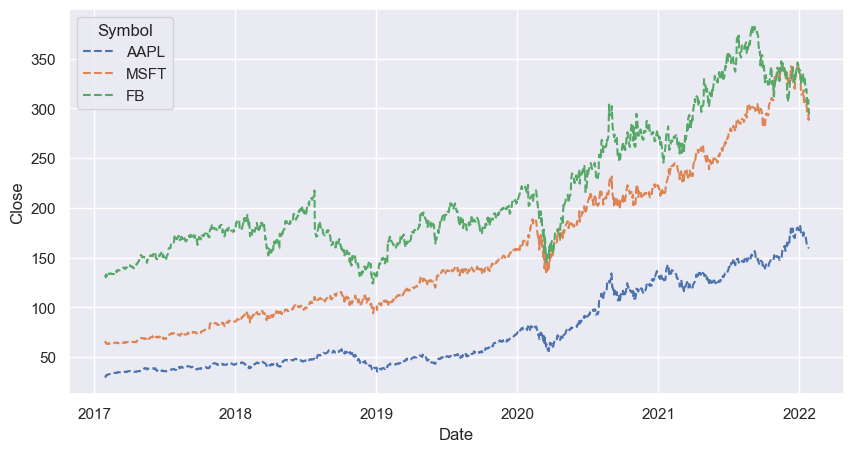

In [59]:
# lets increase the size using figsize
plt.figure(figsize=[10,5])

sb.lineplot(x='Date',y='Close',data=stocks,hue='Symbol',linestyle='--')

<Axes: xlabel='Date', ylabel='Close'>

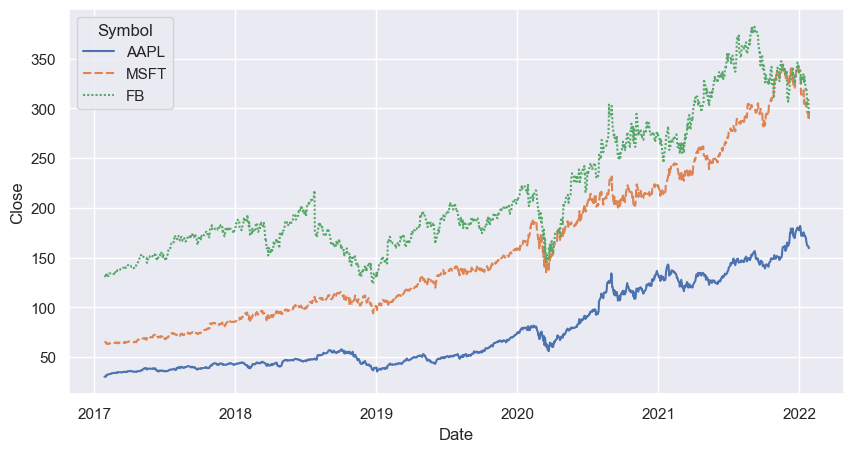

In [60]:
# we could make the linetype different for every company by using the style arguement
plt.figure(figsize=[10,5])

sb.lineplot(x='Date',y='Close',data=stocks,hue='Symbol',style='Symbol')

<Axes: xlabel='Date', ylabel='Close'>

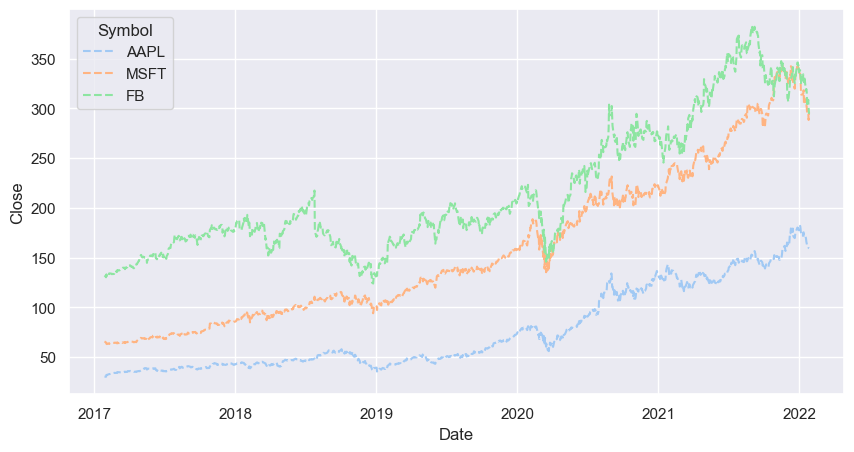

In [61]:
# Let's try out some color pallates
plt.figure(figsize=[10,5])

sb.lineplot(x='Date',y='Close',data=stocks,hue='Symbol',linestyle='--', palette='pastel')


<Axes: xlabel='Date', ylabel='Close'>

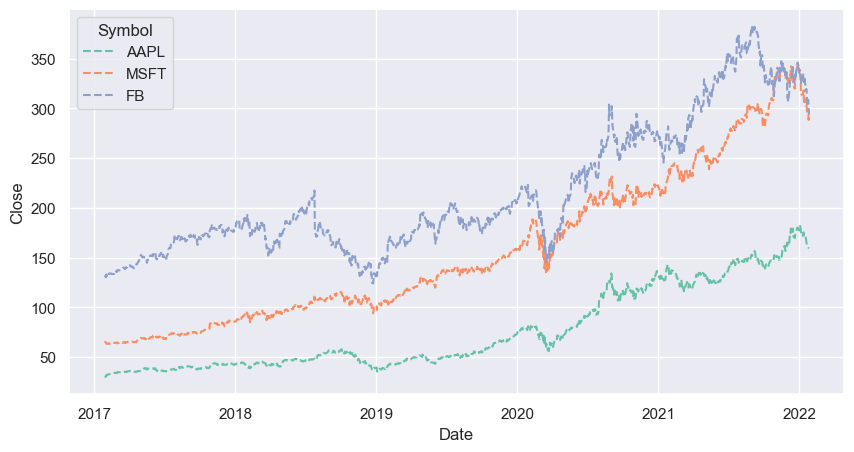

In [62]:
# Let's try out some color pallates
plt.figure(figsize=[10,5])

sb.lineplot(x='Date',y='Close',data=stocks,hue='Symbol',linestyle='--', palette='Set2')


<Axes: xlabel='Date', ylabel='Close'>

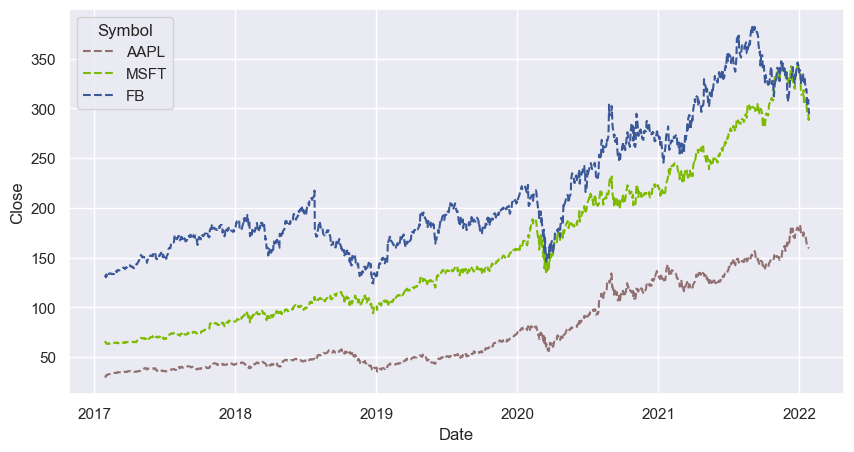

In [63]:
# Palette also allows a list of colors to be passed through

plt.figure(figsize=[10,5])
sb.lineplot(x='Date', y='Close', data=stocks, hue='Symbol', linestyle='--', palette=['#907070','#7cbb00', '#3b5998'])

<Axes: xlabel='Date', ylabel='Close'>

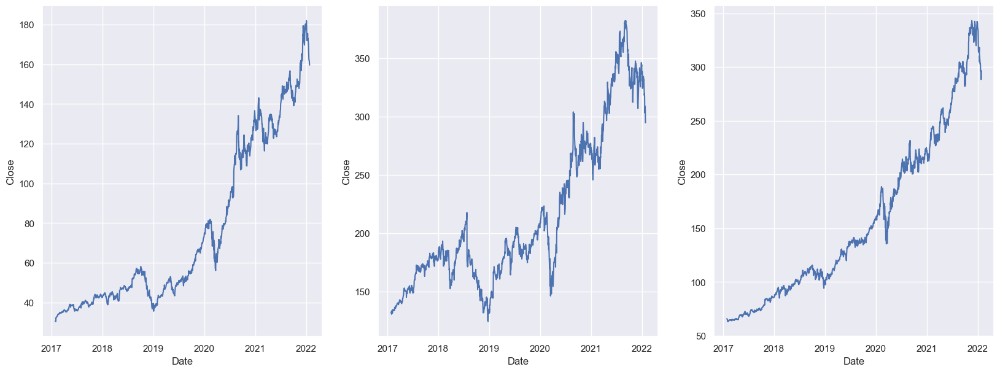

In [64]:
# Using subplots and plotting each stock symbol on seperate axes

fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize=(20,7))

sb.lineplot(x='Date', y='Close', data=stocks[stocks['Symbol']=='AAPL'],ax=ax1)
sb.lineplot(x='Date', y='Close', data=stocks[stocks['Symbol']=='FB'],ax=ax2)
sb.lineplot(x='Date', y='Close', data=stocks[stocks['Symbol']=='MSFT'],ax=ax3)

    An easier way to do this split is to use seaborn relplot.

## Scatterplot

https://seaborn.pydata.org/generated/seaborn.scatterplot.html

<b> Seaborn has some pre-installed datasets. For this section we will use one of them.

In [65]:
# code to view the datasets pre-installed in seaborn
sb.get_dataset_names()

['anagrams',
 'anscombe',
 'attention',
 'brain_networks',
 'car_crashes',
 'diamonds',
 'dots',
 'dowjones',
 'exercise',
 'flights',
 'fmri',
 'geyser',
 'glue',
 'healthexp',
 'iris',
 'mpg',
 'penguins',
 'planets',
 'seaice',
 'taxis',
 'tips',
 'titanic']

    To use one of these installed datasets we use the code seaborn.load_dataset('datasetname')

In [66]:
penguins=sb.load_dataset('penguins')

In [67]:
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='body_mass_g', ylabel='bill_length_mm'>

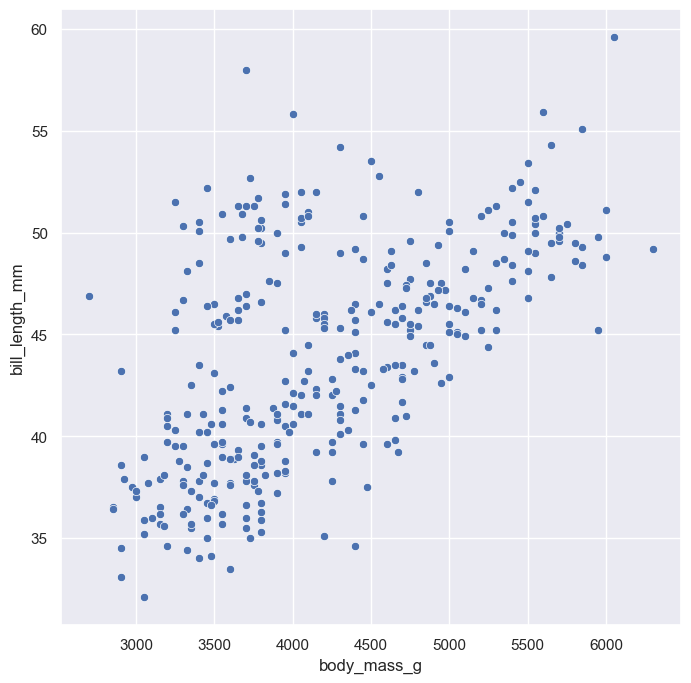

In [68]:
plt.figure(figsize=[8,8])

# testing association between body mass and bill length
sb.scatterplot(x='body_mass_g',y='bill_length_mm',data=penguins)

There seems to some positive correlation between body mass and bill length.

<Axes: xlabel='body_mass_g', ylabel='flipper_length_mm'>

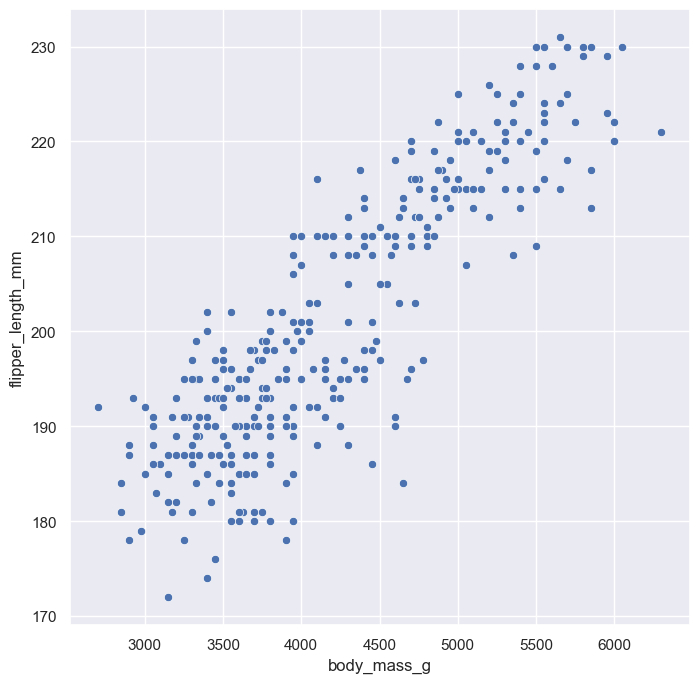

In [69]:
plt.figure(figsize=[8,8])

# testing association between body mass and flipper length
sb.scatterplot(x='body_mass_g',y='flipper_length_mm',data=penguins)

The correlation is even stronger with flipper length. 

<b>*Let us add sex as hue to see if there is any pattern.*

<Axes: xlabel='body_mass_g', ylabel='flipper_length_mm'>

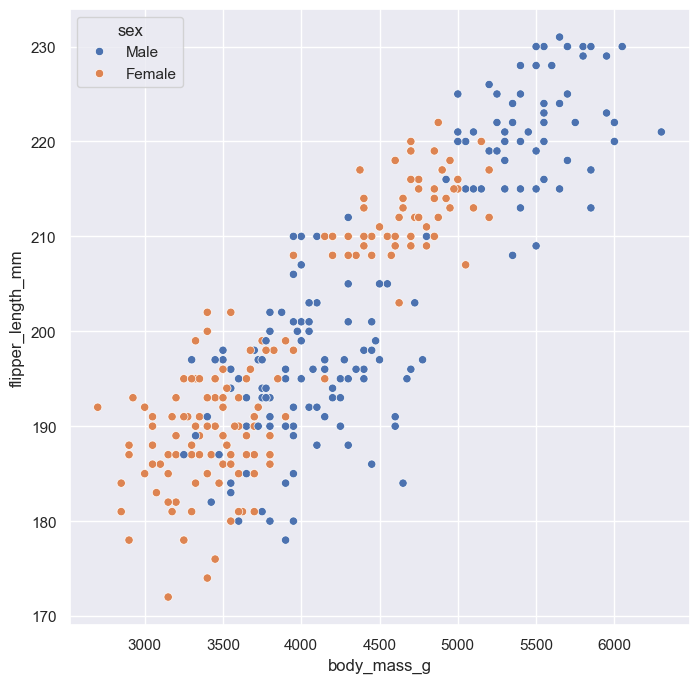

In [70]:
plt.figure(figsize=[8,8])
sb.scatterplot(x='body_mass_g',y='flipper_length_mm',hue='sex',data=penguins)

<b>*Now let us filter using island as hue to see if there is any pattern.*

<Axes: xlabel='body_mass_g', ylabel='flipper_length_mm'>

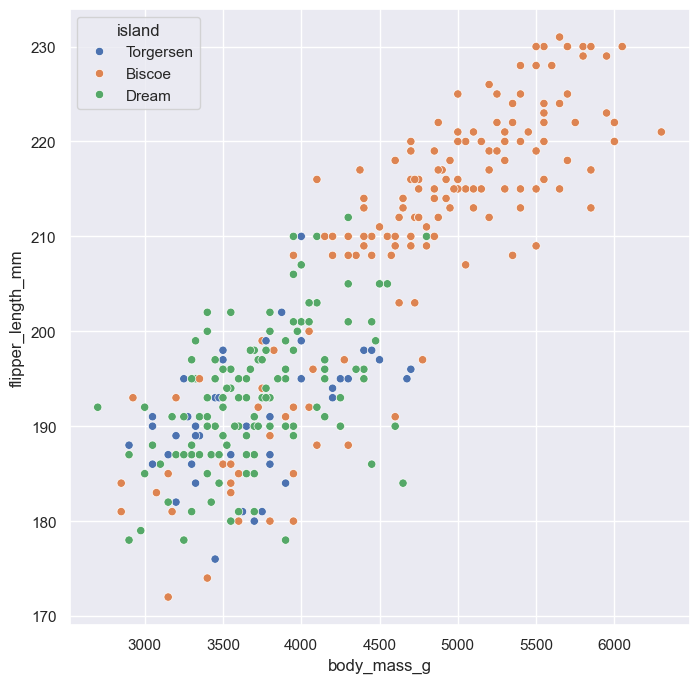

In [71]:
plt.figure(figsize=[8,8])
sb.scatterplot(x='body_mass_g',y='flipper_length_mm',hue='island',data=penguins)

Definitely, island plays a role in size of the penguins. 

## Relplot

https://seaborn.pydata.org/generated/seaborn.relplot.html

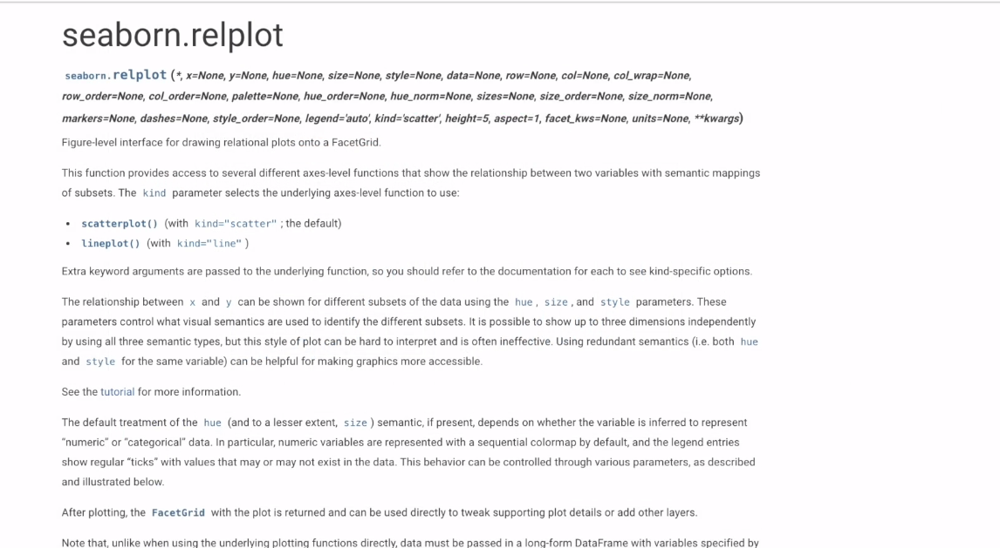

Replots allow you to draw a matrix of plots based on facetting on a variable through either the row or column arguement. It useful for allowing multiple line and scatterplots. 

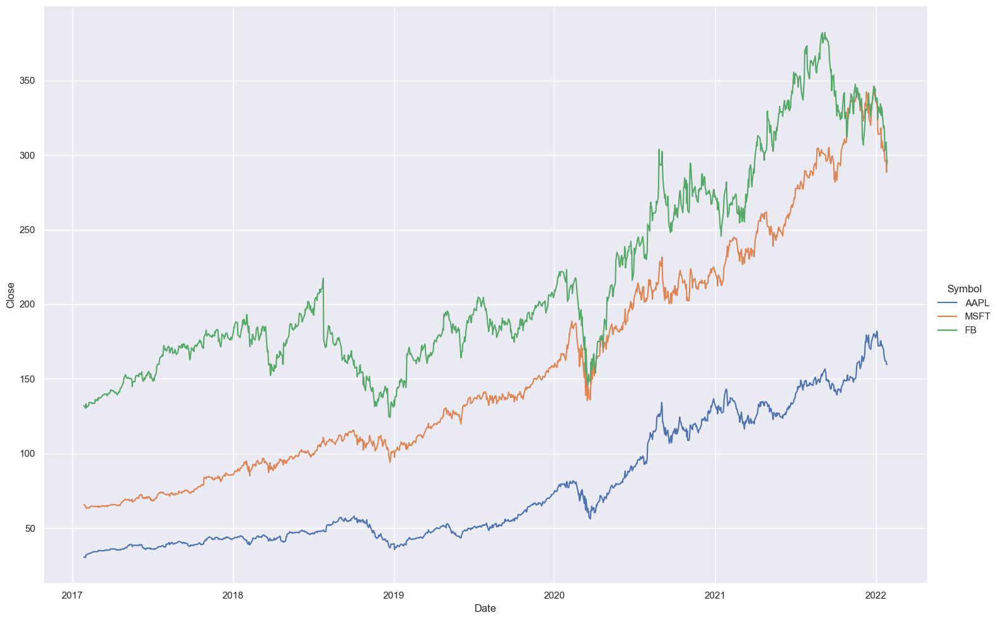

In [72]:
# instead of using figsize we can specify the height using height=int and we can specify width using aspect=ratio to height.

sb.relplot(x='Date',y='Close',data=stocks,hue='Symbol',kind='line',height=10,aspect=1.5) # width=15 from 10*1.5

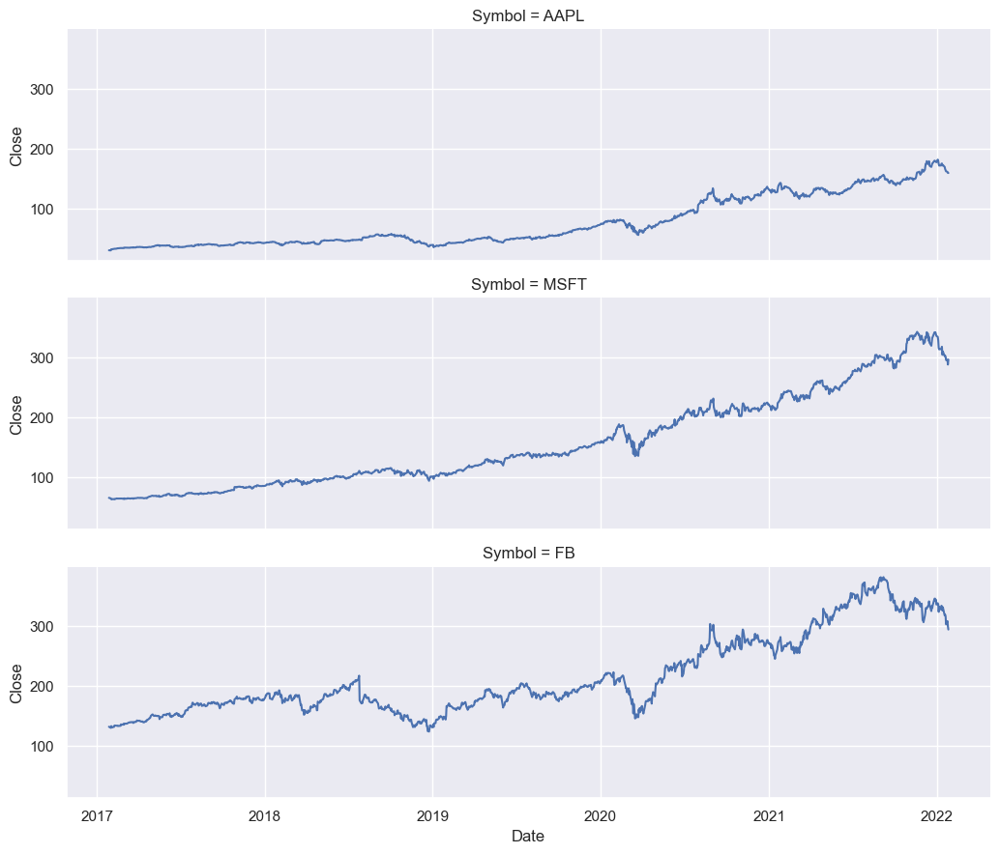

In [73]:
# Now let us facet rowwise using the symbol variable

sb.relplot(x='Date',y='Close',data=stocks,row='Symbol',kind='line',height=3,aspect=3.5)

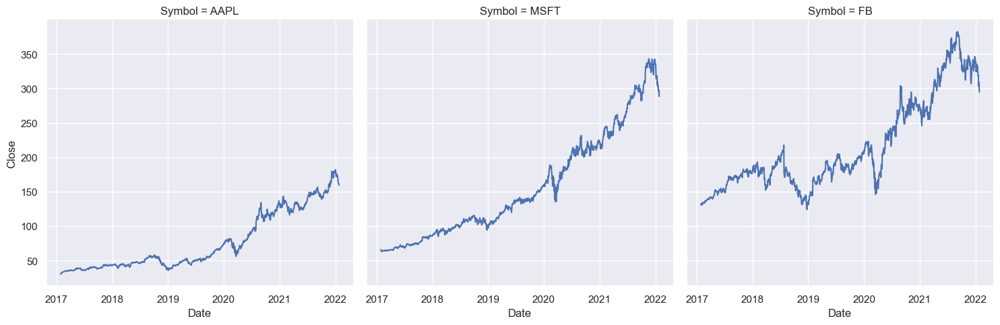

In [74]:
# using columns instead and adjusting the height and aspect ratio
sb.relplot(x='Date',y='Close',data=stocks,col='Symbol',kind='line',height=5,aspect=1)

<Figure size 1000x1000 with 0 Axes>

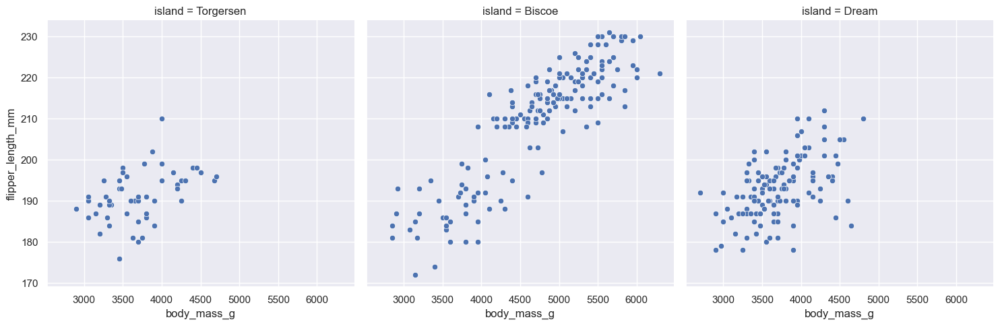

In [75]:
# Now using replots to split by island
plt.figure(figsize=[10,10])
sb.relplot(data=penguins,x='body_mass_g',y='flipper_length_mm',col='island')

<Figure size 1000x1000 with 0 Axes>

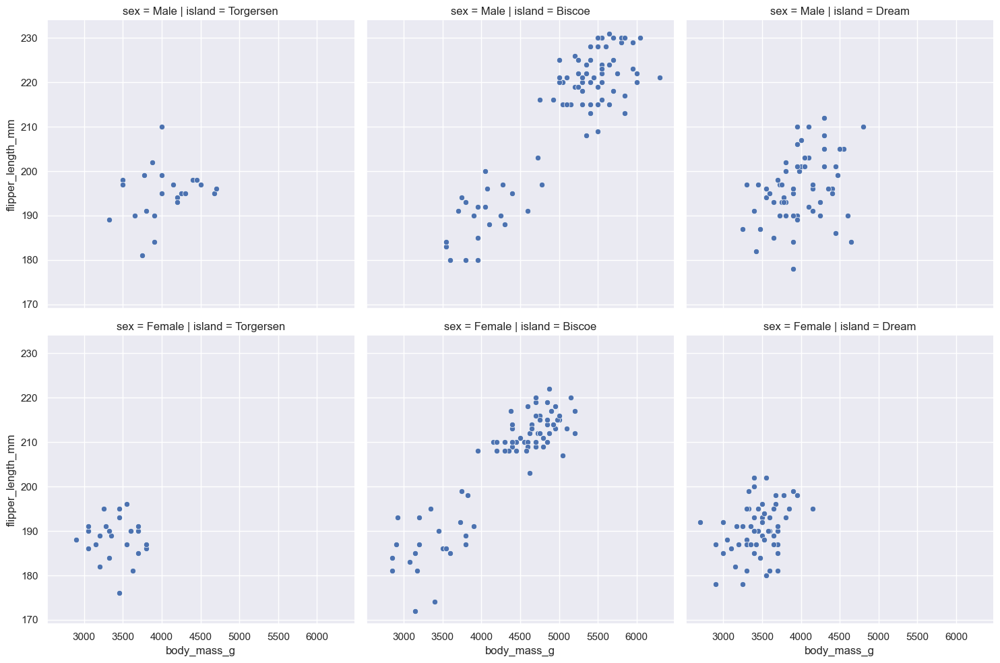

In [76]:
# Now using replots to split by island and sex
plt.figure(figsize=[10,10])
sb.relplot(data=penguins,x='body_mass_g',y='flipper_length_mm',col='island',row='sex')

# Distributional plots

<i>We will continue to use seaborn theme for this subtopic as well.

## Rugplot

https://seaborn.pydata.org/generated/seaborn.rugplot.html#seaborn.rugplot

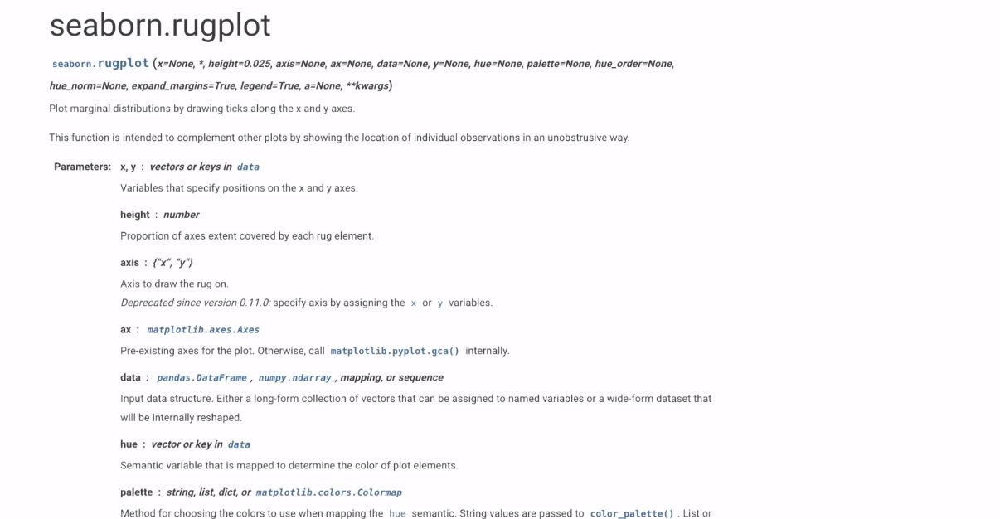

A rug plot is a plot of a single quantitative variable displayed as marks/sticks. 

In [77]:
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,NaN
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,Female
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,Male
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,Female


<Axes: xlabel='body_mass_g'>

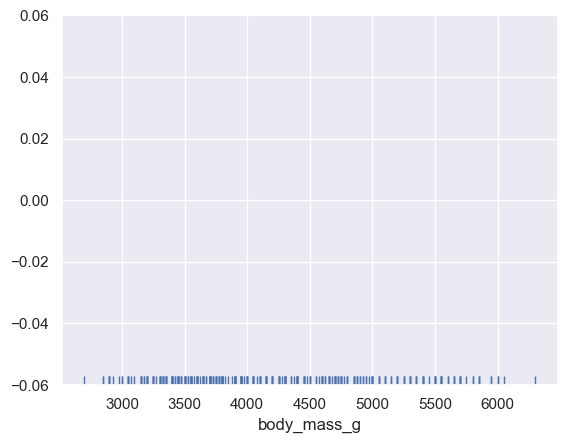

In [78]:
sb.rugplot(data=penguins, x='body_mass_g')

<Axes: xlabel='body_mass_g'>

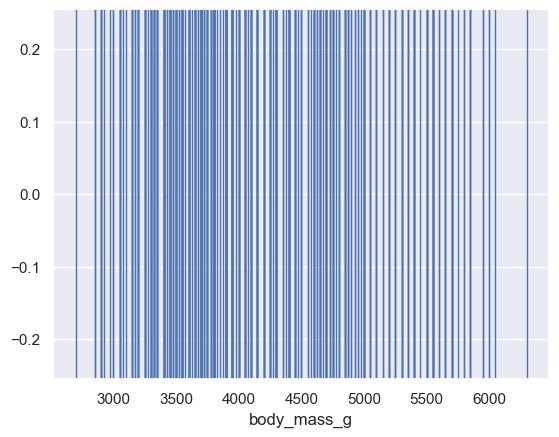

In [79]:
# let us adjust the height using the height arguement
sb.rugplot(data=penguins, x='body_mass_g',height=1)

<b>What is on the y-axis doesn't matter. The rugplot shows where the body mass is most common.

(160.0, 240.0)

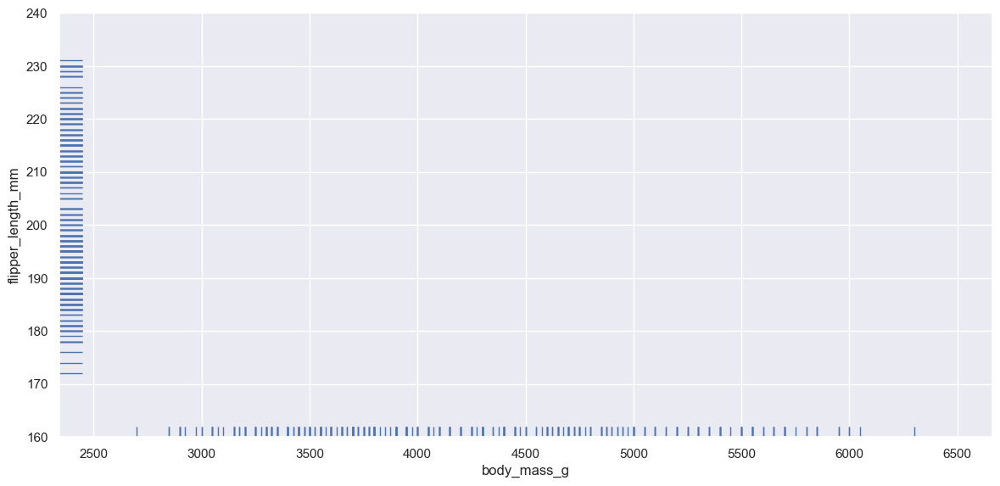

In [80]:
# adding on  a flipper length measurement and changing the ylimits
fig=plt.figure(figsize=[11,5])

ax=fig.add_axes(rect=[0,0,1,1])
sb.rugplot(data=penguins, x='body_mass_g',y='flipper_length_mm')

ax.set_ylim(160,240)

A rugplot by itself may not be very instrumental, it is hence more useful when combined with other plots.

(160.0, 240.0)

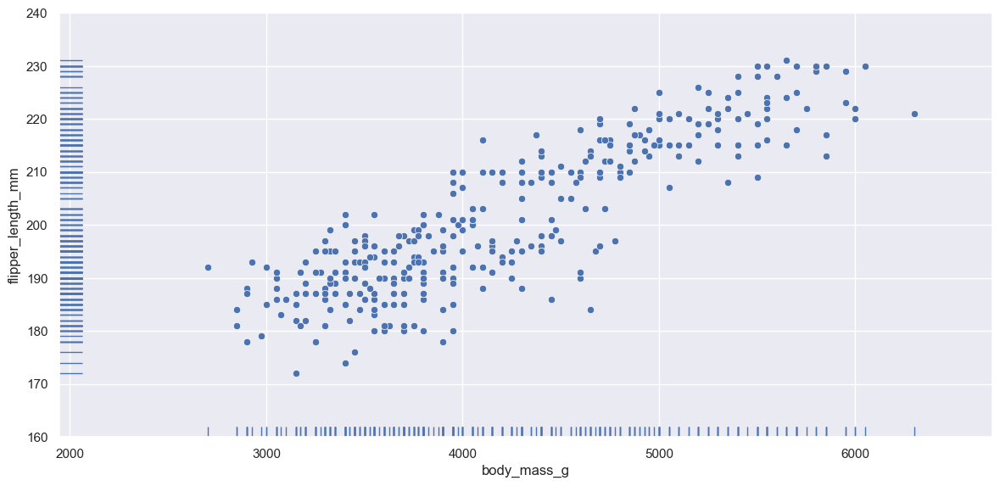

In [81]:
fig=plt.figure(figsize=[11,5])

ax=fig.add_axes(rect=[0,0,1,1])
sb.rugplot(data=penguins, x='body_mass_g',y='flipper_length_mm')
sb.scatterplot(data=penguins, x='body_mass_g',y='flipper_length_mm')
ax.set_ylim(160,240)

The scatterplot indicates with regions have more datapoints and the rugplot shows us exactly the number range the densely populated datapoints are located.

## Histograms

Where as in matplot the code was 'hist' for seaborn we use 'histplot'

https://seaborn.pydata.org/generated/seaborn.histplot.html#seaborn.histplot

<Axes: xlabel='body_mass_g', ylabel='Count'>

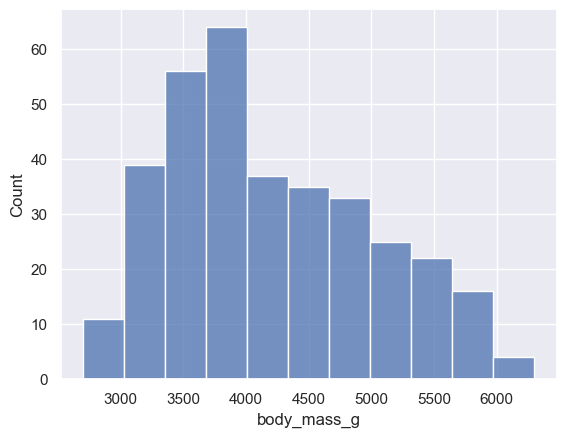

In [82]:
sb.histplot(data=penguins, x='body_mass_g')

### Bivariate histogram

This is like a scatterplot but the dots replaced with bins. The darker that region the more datapoinst are located there.

<Axes: xlabel='body_mass_g', ylabel='sex'>

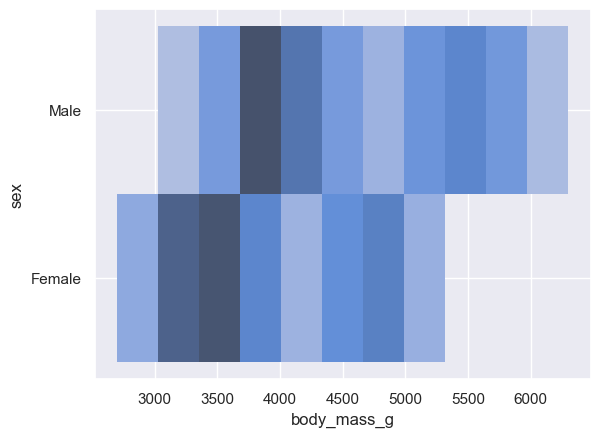

In [83]:
sb.histplot(data=penguins, x='body_mass_g',y='sex')

From this plot we can infer that most males have a body mass of 4000g and most females have a body mass of 3500g.

### Multivariate histogram

<Axes: xlabel='body_mass_g', ylabel='island'>

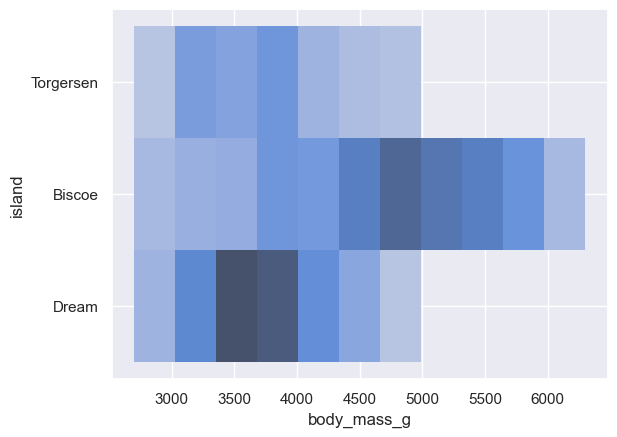

In [84]:
sb.histplot(data=penguins, x='body_mass_g',y='island')

* It is clear to see that Biscoe has got the heavier penguins with most of them at around 4700g
* For Dream island, most penguins weigh around 3500g
* For Torgesen island, most penguins weigh either around 3100g or 3700g

## KDE plots

https://seaborn.pydata.org/generated/seaborn.kdeplot.html#seaborn.kdeplot

Kernel Density Estimation by Matthew Conlen: https://mathisonian.github.io/kde/

<b>If you are familiar with adding a smooth line to a histogram. This is it! KDE plots are smooth line plots. Well smooth line assumes you are using a normal kernel. 

<Axes: xlabel='body_mass_g', ylabel='Density'>

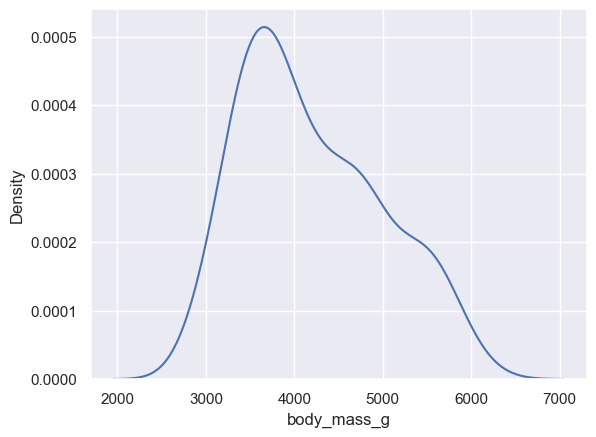

In [85]:
sb.kdeplot(data=penguins, x='body_mass_g')

<Axes: xlabel='body_mass_g', ylabel='Count'>

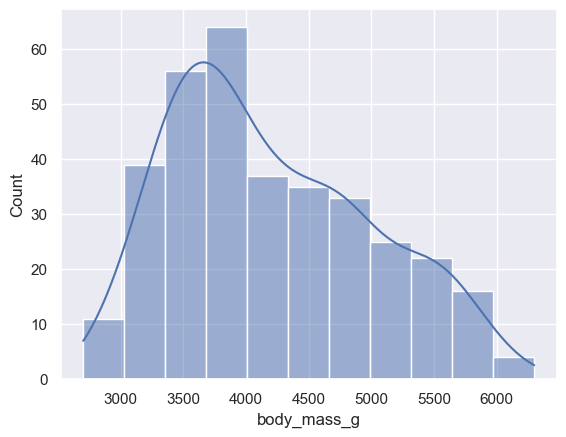

In [86]:
# Unsurprisingly histplots have kde option

sb.histplot(data=penguins, x='body_mass_g',kde=True)


<Axes: xlabel='body_mass_g', ylabel='Density'>

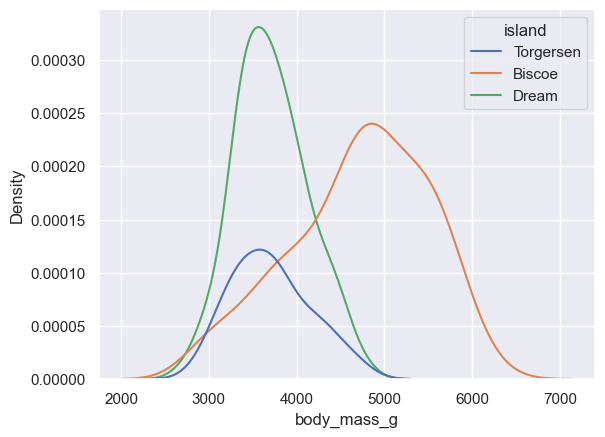

In [87]:
# we can filter our kde plot by island
sb.kdeplot(data=penguins, x='body_mass_g',hue='island')

### Bivariate distribution

By passing two numeric variables: one in the x and one in the y arguements we visualize a bi-variate distribution.

<Axes: xlabel='body_mass_g', ylabel='flipper_length_mm'>

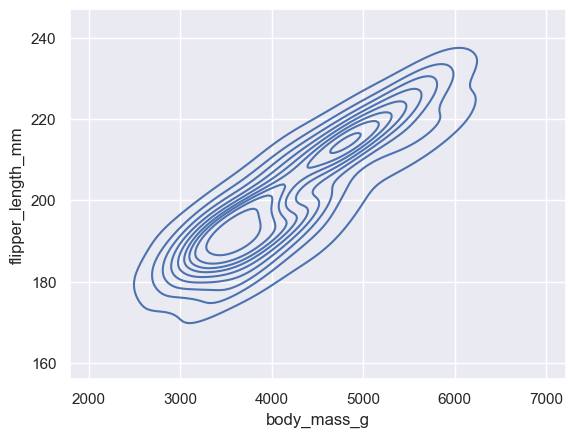

In [88]:
sb.kdeplot(data=penguins, x='body_mass_g',y='flipper_length_mm')

The circular rings are regions of high density.

We can make those circular rings more clearer by making them opaque using the fill arguement.

<Axes: xlabel='body_mass_g', ylabel='flipper_length_mm'>

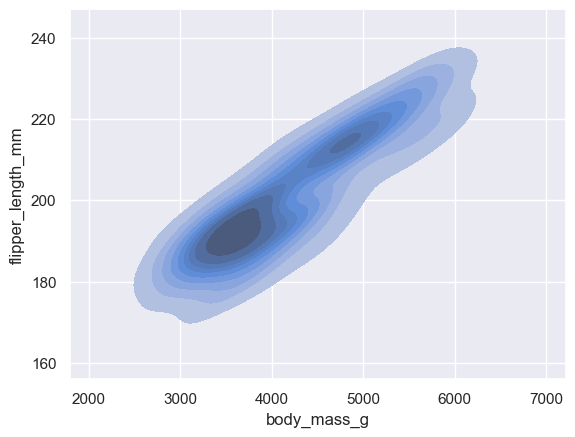

In [89]:
sb.kdeplot(data=penguins, x='body_mass_g',y='flipper_length_mm',fill=True)

The darkest points represent high density.

<Axes: xlabel='body_mass_g', ylabel='flipper_length_mm'>

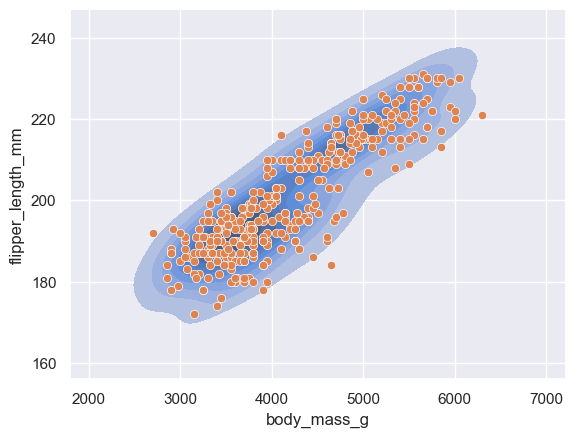

In [90]:
# let us overlay it with a scatterplot

sb.kdeplot(data=penguins, x='body_mass_g',y='flipper_length_mm',fill=True)
sb.scatterplot(data=penguins, x='body_mass_g',y='flipper_length_mm')

It is even more clear the regions of high concentration.

## ECDFplot

https://seaborn.pydata.org/generated/seaborn.ecdfplot.html#seaborn.ecdfplot

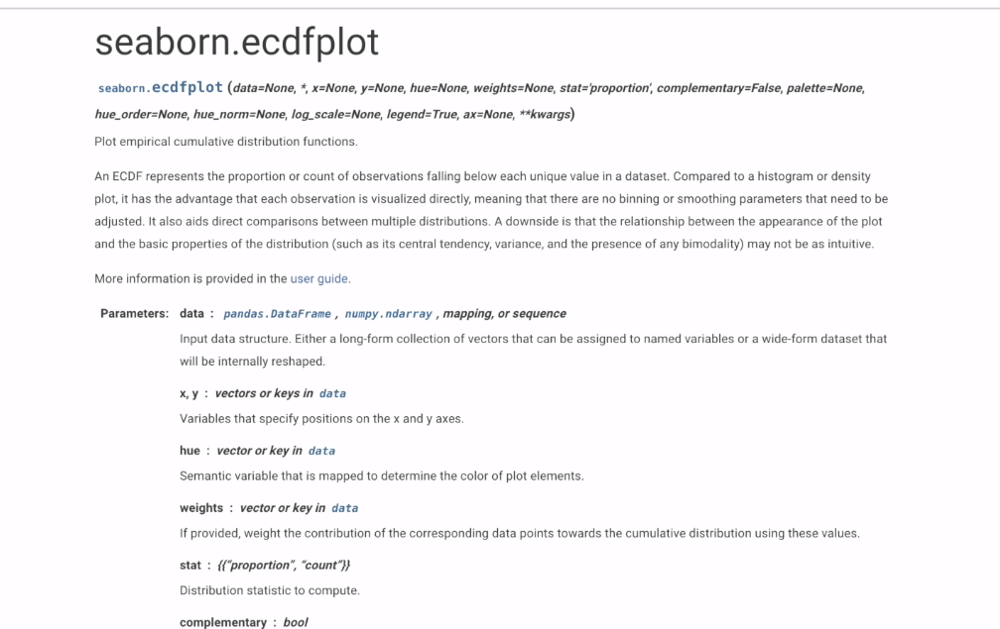

<b>ecdf plots are cummulative distribution plots.

<Axes: xlabel='body_mass_g', ylabel='Proportion'>

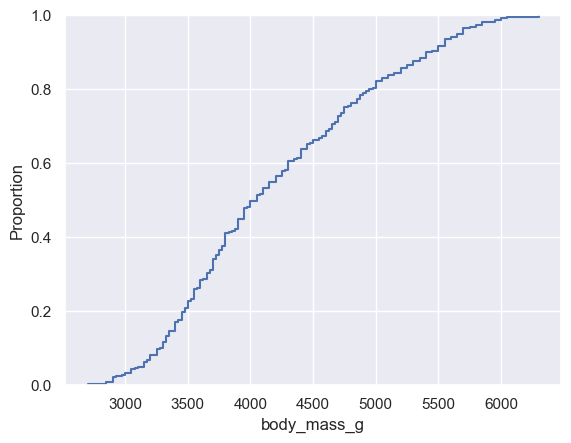

In [91]:
sb.ecdfplot(x='body_mass_g', data=penguins)

You can interpret the above chart as follows:

* About 60% of the penguin population has a body_mass of below 4250g.
* 100% of the penguins have abody weight of less than 6000g

<Axes: xlabel='Proportion', ylabel='flipper_length_mm'>

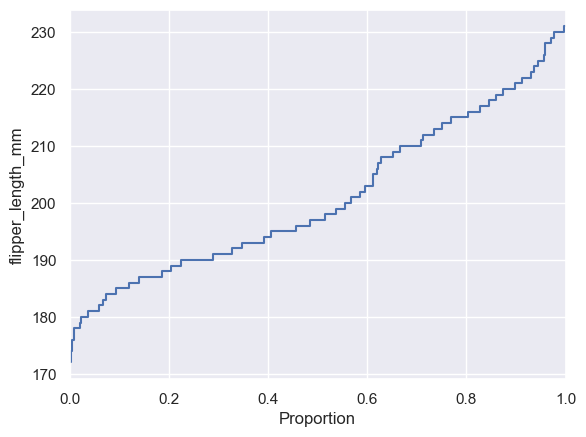

In [92]:
# let us in stead use flipper length

sb.ecdfplot(y='flipper_length_mm',data=penguins)

About 60% of the penguin population have a flipper_length of less than 205mm.

<Axes: xlabel='Proportion', ylabel='flipper_length_mm'>

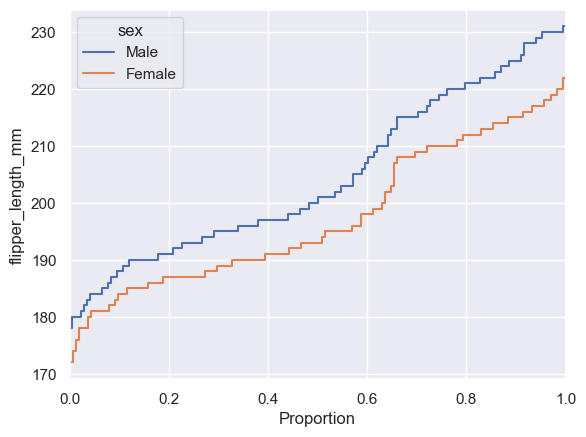

In [93]:
# we can filter by sex
sb.ecdfplot(y='flipper_length_mm',data=penguins,hue='sex')

Reminds you of a survival curve doesn't it. If you know, you know😅

<Axes: xlabel='Proportion', ylabel='flipper_length_mm'>

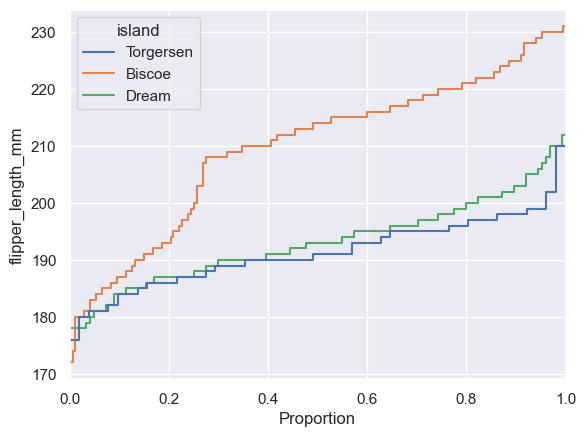

In [94]:
# filtering by island
sb.ecdfplot(y='flipper_length_mm',data=penguins,hue='island')

## Displot 

    Just like how relplots is used in faceting of relational plots like scatter and lineplots, distplots is used in faceting of distribution plots like histograms, kdeplots and ecdf plots.

https://seaborn.pydata.org/generated/seaborn.displot.html
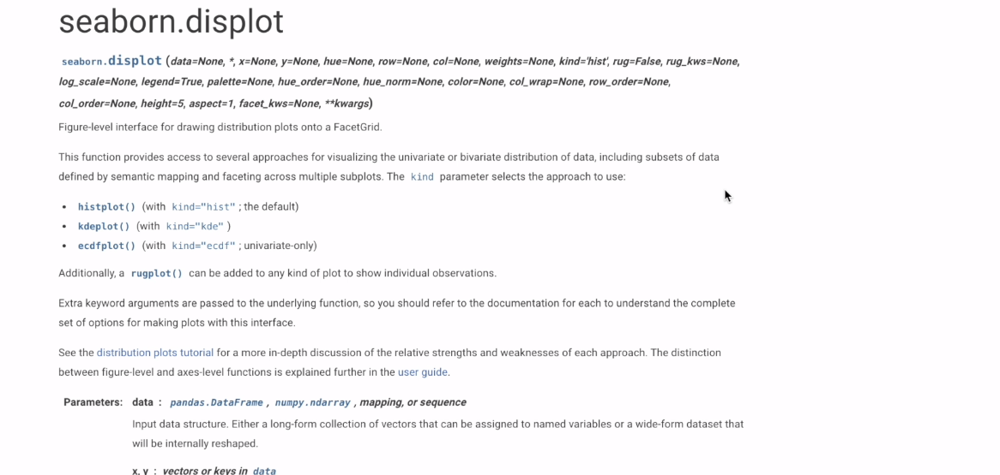

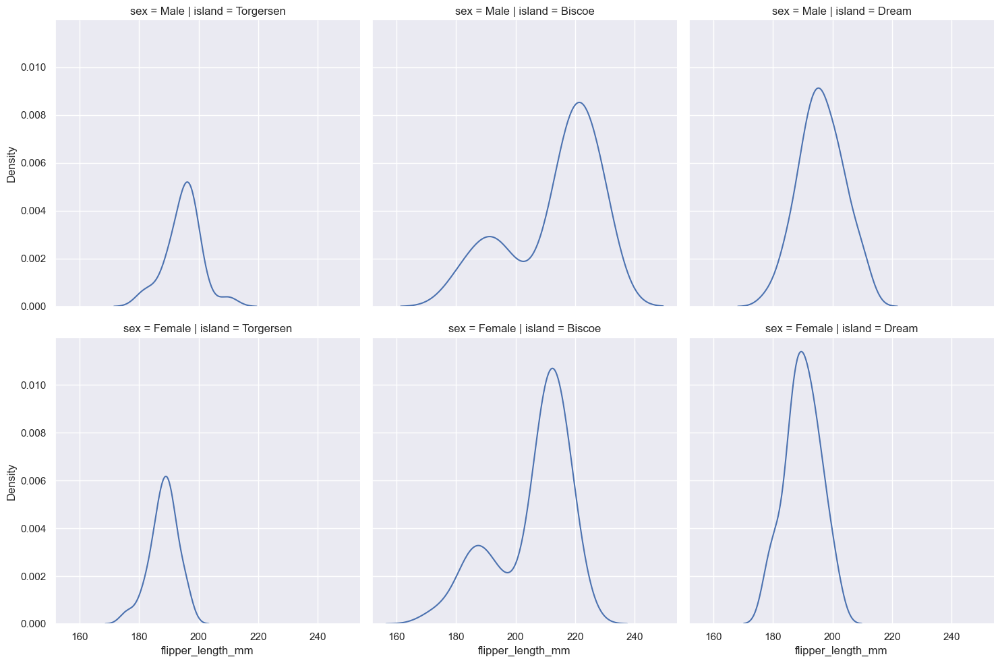

In [95]:
sb.displot(x='flipper_length_mm', data=penguins, col='island', row='sex', kind='kde')

# Regression plots

These are plots used to test the assumptions associated with regression modelling.

Specifically these two assumptions such as:

* linearity
* mutlicolinearity

### corr

.corr() is a method used to create a correlational matrix.

https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html

In [96]:
penguins.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


In [97]:
# using corr on the numerical variables in the penguin dataset as string variables cannot be tested for correlation.
penguins.drop(columns=['species','island','sex']).corr()

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g
bill_length_mm,1.000000,-0.235053,0.656181,0.595110
bill_depth_mm,-0.235053,1.000000,-0.583851,-0.471916
flipper_length_mm,0.656181,-0.583851,1.000000,0.871202
body_mass_g,0.595110,-0.471916,0.871202,1.000000


The values displayed are the Pearson correlation coefficients. The correlation coefficient ranges from -1 to 1 whereby values closer to -1 exibit a strong negative correlation and the values closer to 1 show a strong positive correlation.

*  There is a strong positive correlation between bill length and body mass, flipper length and body mass, and  flipper length and bill length.
* There is a negative correlation between bill depth and flipper length, and slight negative correlaton between bill length and bill depth.

## Regplot

https://seaborn.pydata.org/generated/seaborn.regplot.html#seaborn.regplot

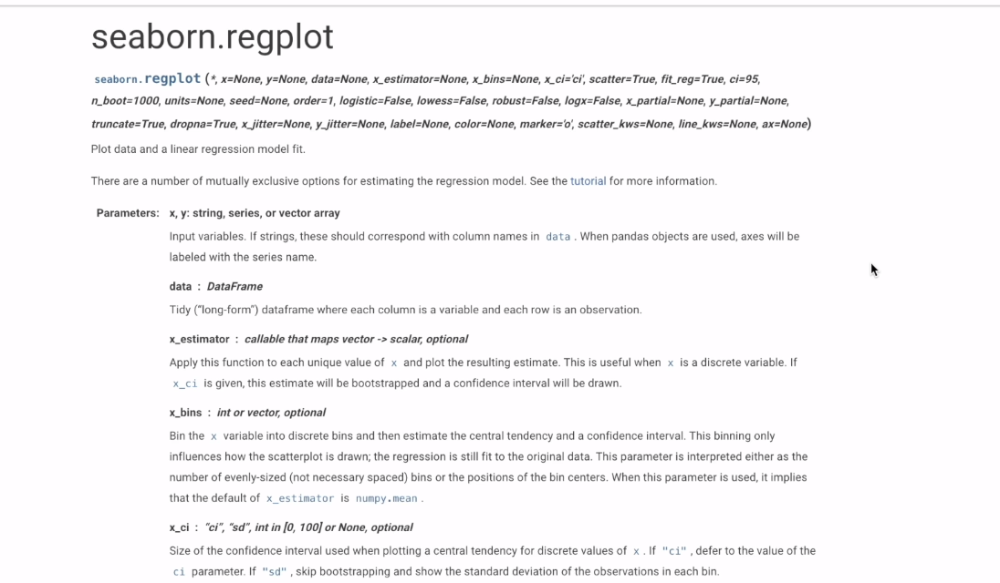

<Axes: xlabel='flipper_length_mm', ylabel='bill_depth_mm'>

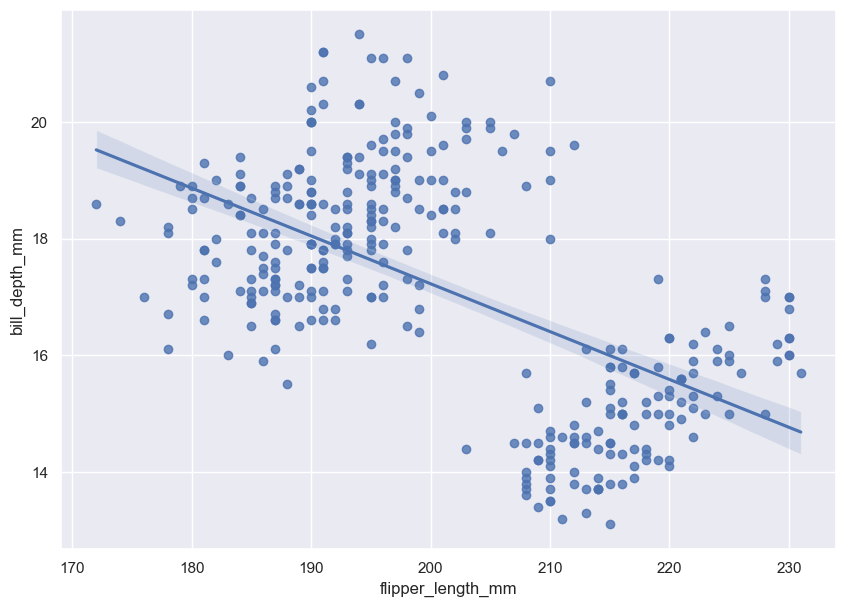

In [98]:
plt.figure(figsize=[10,7])
sb.regplot(data=penguins, x='flipper_length_mm',y='bill_depth_mm')

This agrees with the correlational matrix that suggests that the two variables have a correlation of -0.584

<Axes: xlabel='flipper_length_mm', ylabel='bill_depth_mm'>

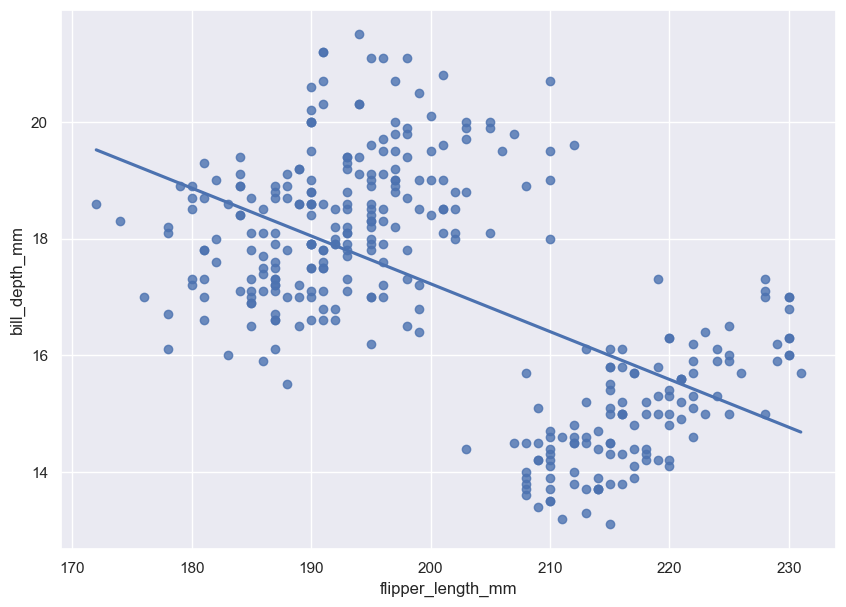

In [99]:
# We can remove the confidence interval band using the ci arguement
plt.figure(figsize=[10,7])
sb.regplot(data=penguins, x='flipper_length_mm',y='bill_depth_mm',ci=None)

<Axes: xlabel='flipper_length_mm', ylabel='body_mass_g'>

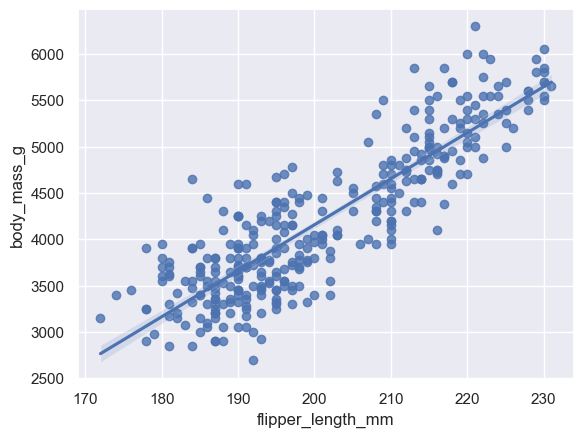

In [100]:
# now lets test see if the positve correlation(0.871) of flipper length and body mass holds up.
sb.regplot(data=penguins, x='flipper_length_mm',y='body_mass_g')

In deed, it does.

## lmplot (small letter l not capital 'i')

https://seaborn.pydata.org/generated/seaborn.lmplot.html#seaborn.lmplot

Just like relplot for relational plots and displots for distributional plots, lmplots allow facetting of regression plots.

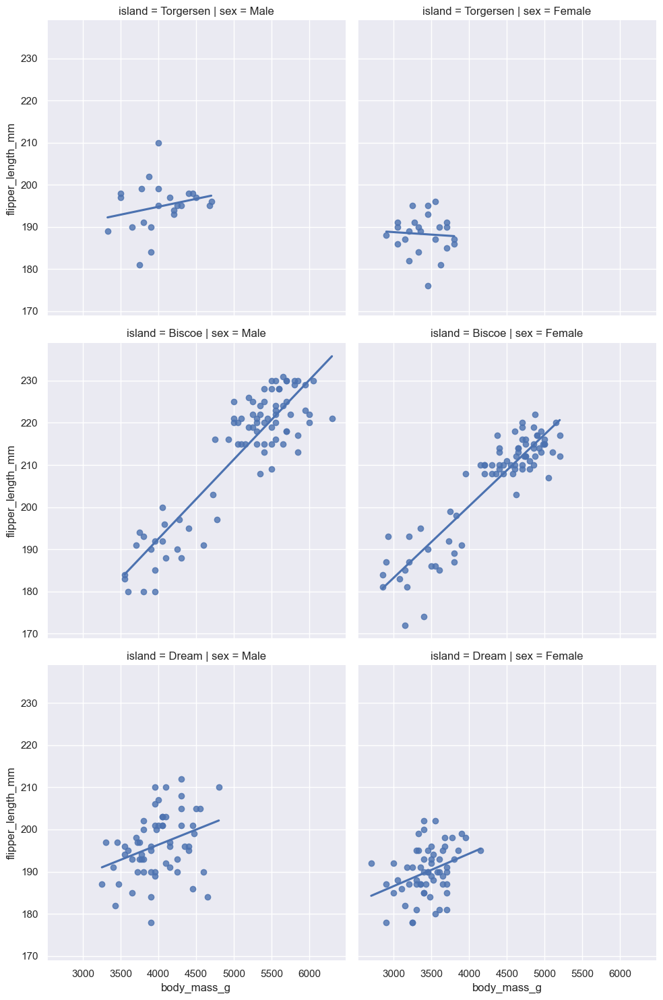

In [101]:
sb.lmplot(data=penguins,x='body_mass_g',y='flipper_length_mm',col='sex',row='island',ci=None,height=5)

The strongest correlation exists in the island of Biscoe and among the Females as their slope is slightly more steeper.

# Multiplots

## Catplot

https://seaborn.pydata.org/generated/seaborn.catplot.html#seaborn.catplot

This is a plot that allows you to plot a numeric variable facetted/grouped by an ordinal categorical variable.

Some kind agruements are as follows:
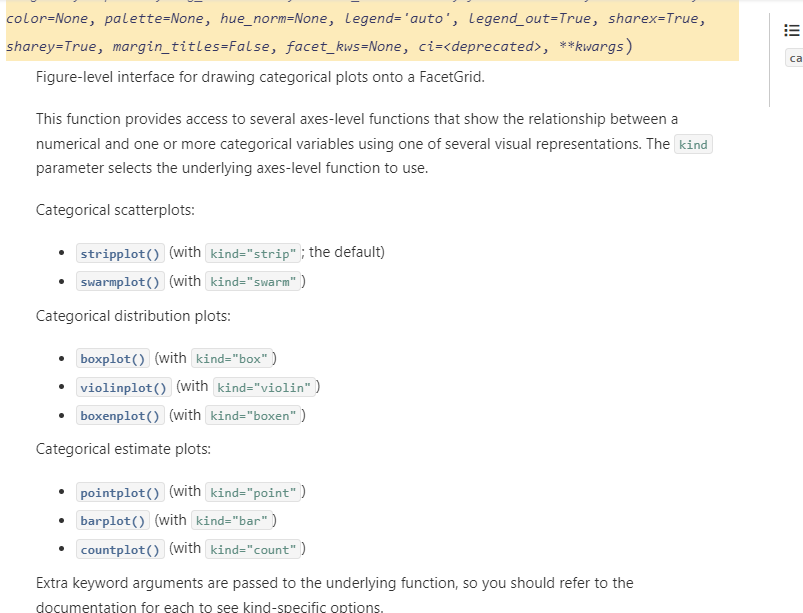

In [169]:
players_21 = pd.read_csv(r'C:\Users\ADMIN\Desktop\MY COURSES\PYTHON KNOWLEDGE\Course Resurces-Python for Data Analysis and Visualization\15 Challenge Section - Seaborn\players_21.csv')

In [170]:
def class_func(x):
    if x >= 85:
        return 'Excellent'
    elif x < 85 and x >= 80:
        return 'Very Good'
    elif x < 80 and x >= 75:
        return 'Good'
    elif x< 75 and x > 60:
        return 'Fair'
    else:
        return 'Below Average'

players_21['overall_class']=players_21['overall'].apply(class_func)

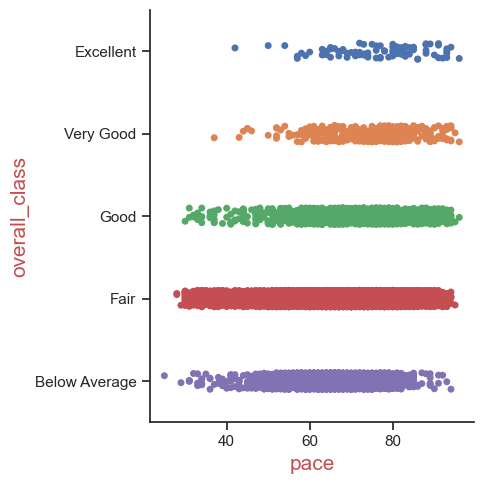

In [171]:
sb.catplot(x='pace',y='overall_class',data=players_21,hue='overall_class')

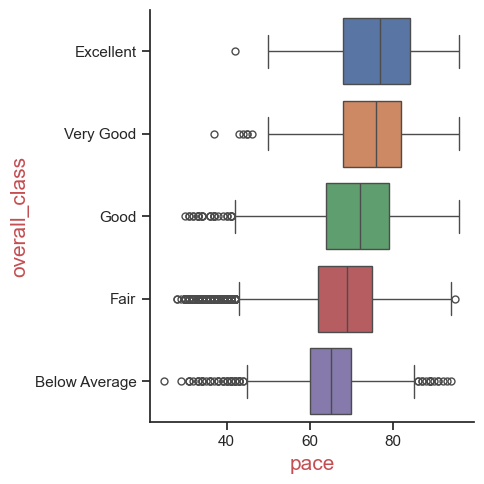

In [174]:
sb.catplot(x='pace',y='overall_class',data=players_21,hue='overall_class',kind='box')

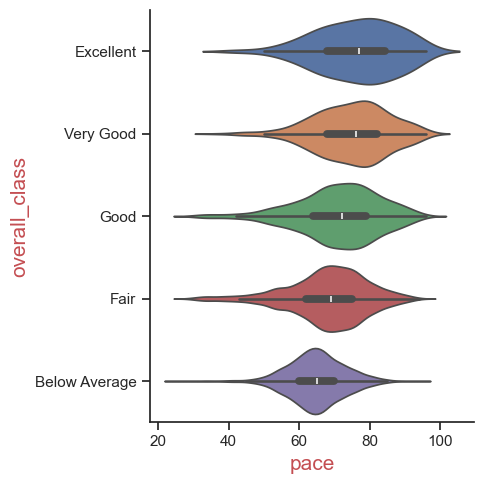

In [182]:
sb.catplot(x='pace',y='overall_class',data=players_21,hue='overall_class',kind='violin')

## Pairplot

https://seaborn.pydata.org/generated/seaborn.pairplot.html#seaborn.pairplot

A pairplot will plot all pairwise relationships for all numerical variables in your dataset. It visualizes the correlation matrix perfectly.

By default, it will generate a histogram on the diagonals and a scatterplot on either side. The working behind is on the diagonals only single measure plots are drawn and on the off-diagonals, multi-measure plots are drawn.

You can change the plots you generate between scatterplots,kdeplots, regplots or histograms.

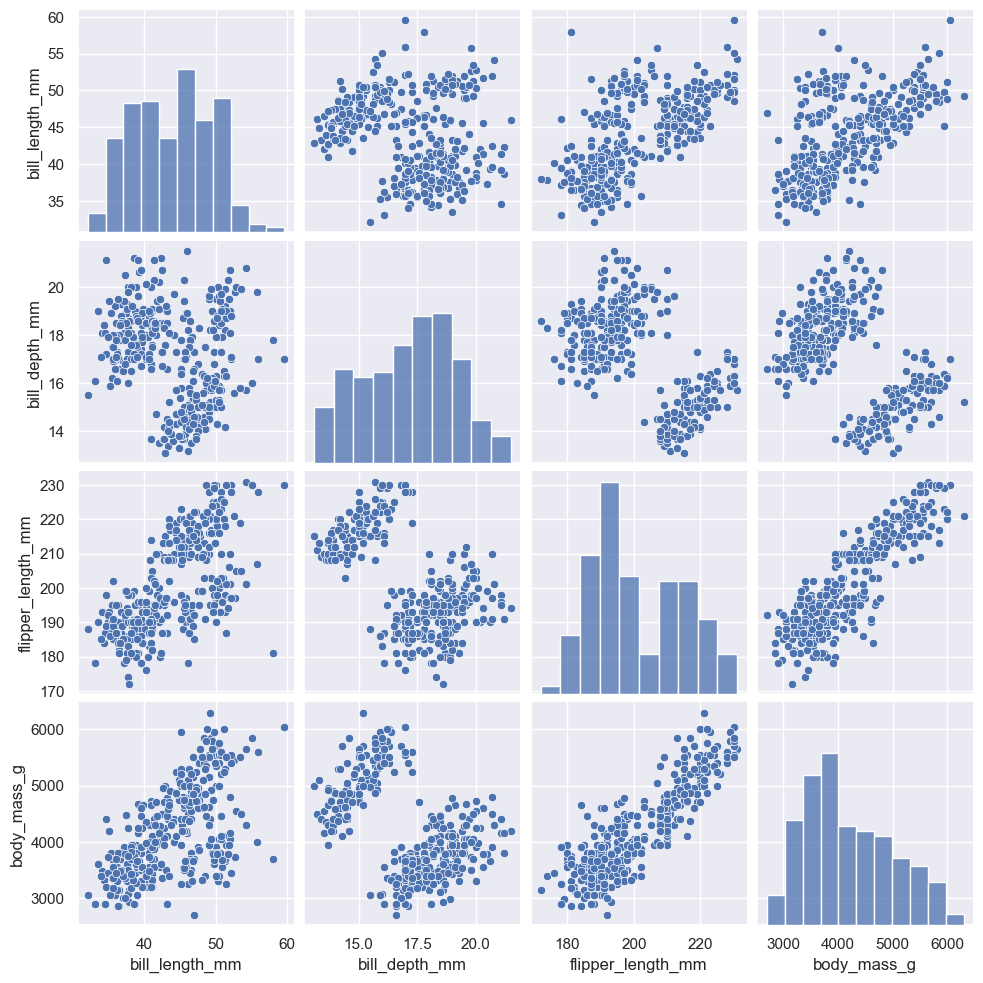

In [102]:
sb.pairplot(penguins)

We generate a histogram when we are pairing the same variables.

<b>if we specity  the kind, we get a one dimensional version of that plot on the diagnol and and a bivariate verison on the off diagnol.

The options include: 'kde','hist','scatter' and 'reg'.

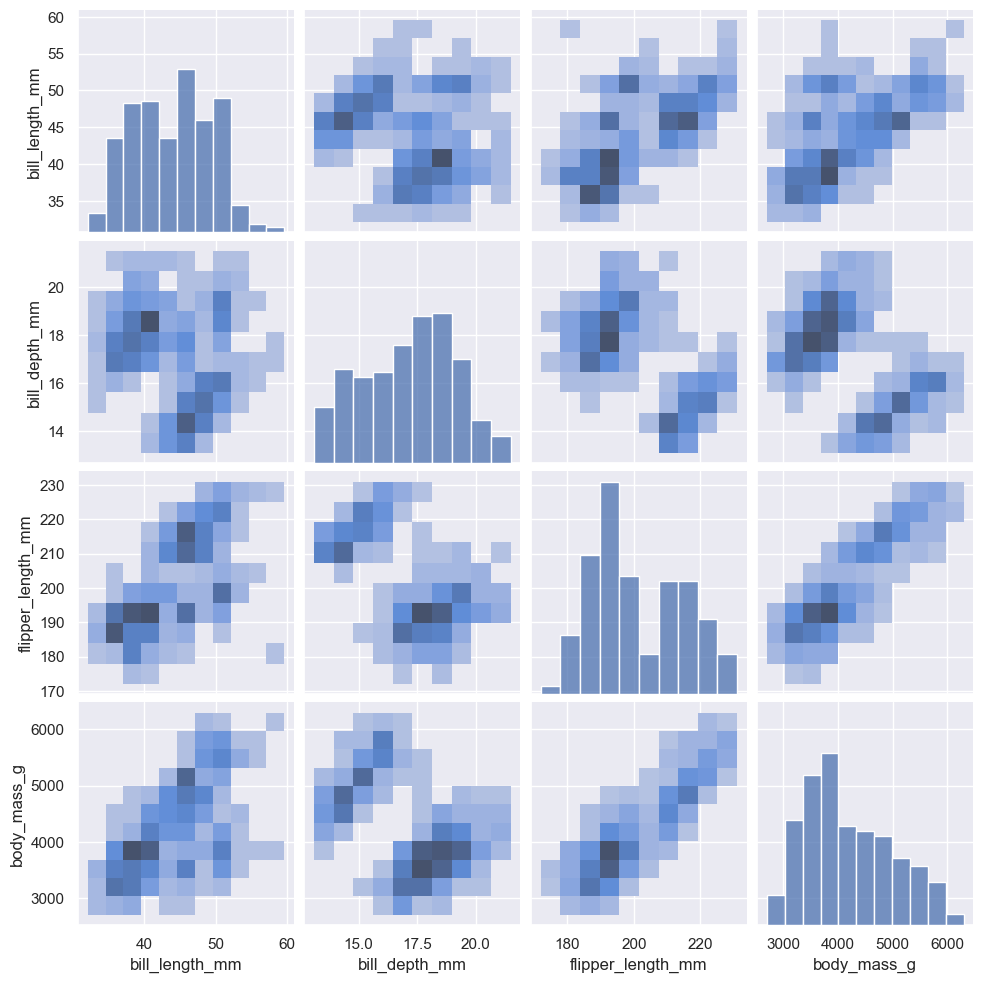

In [103]:
sb.pairplot(penguins,kind='hist')

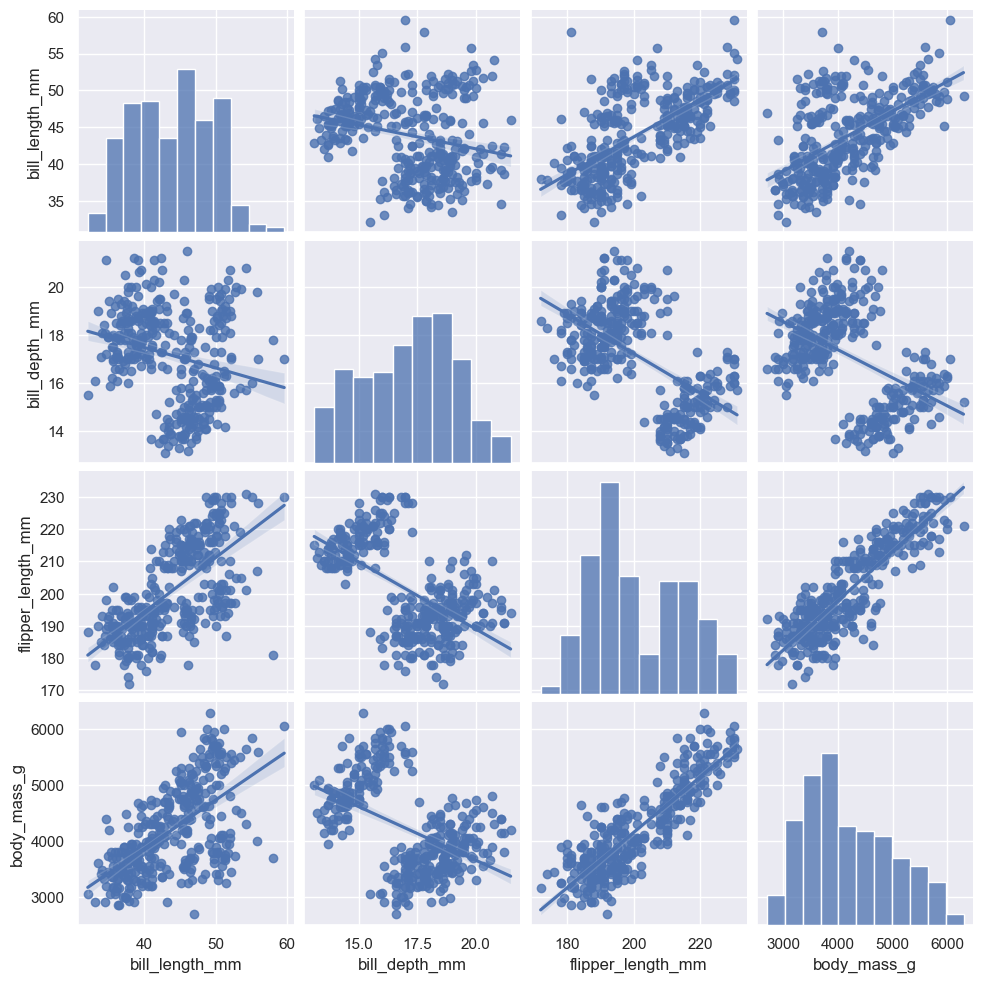

In [104]:
sb.pairplot(penguins,kind='reg')

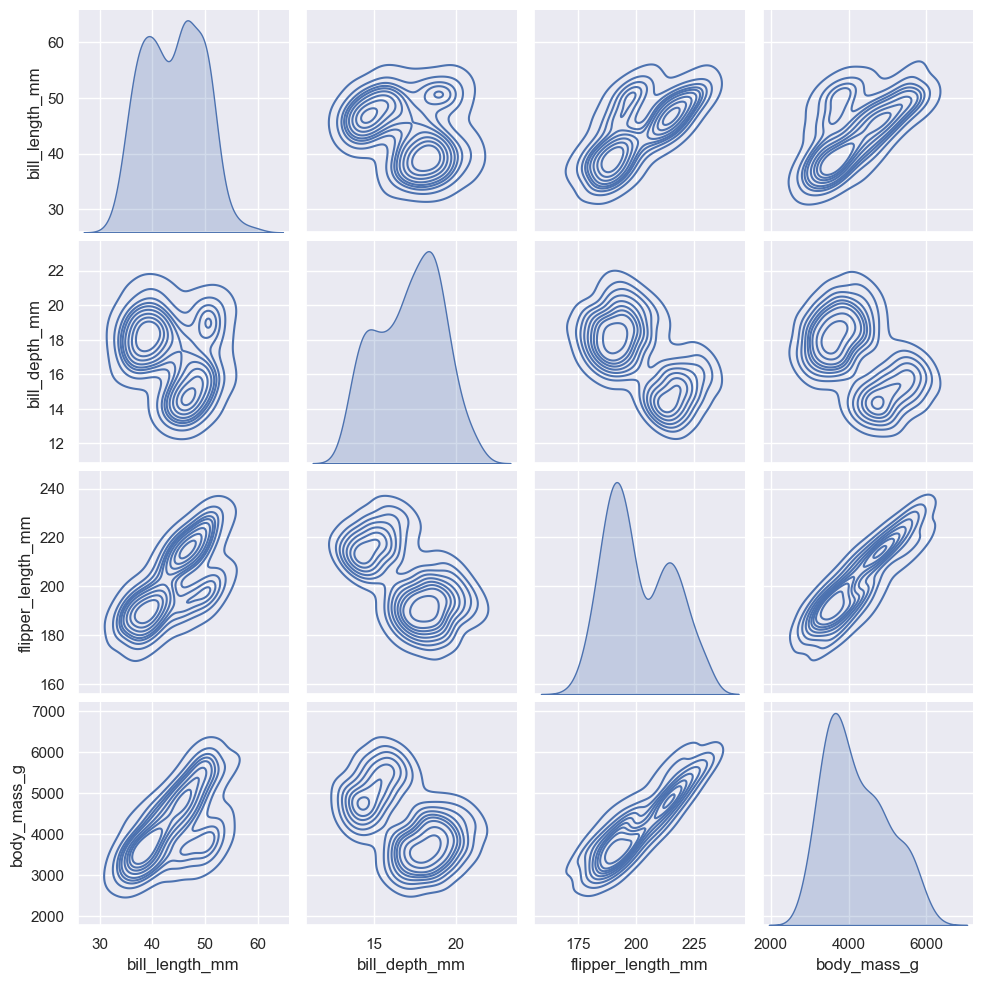

In [105]:
sb.pairplot(penguins,kind='kde')

You can removed the mirrored plots by passing in corner=True

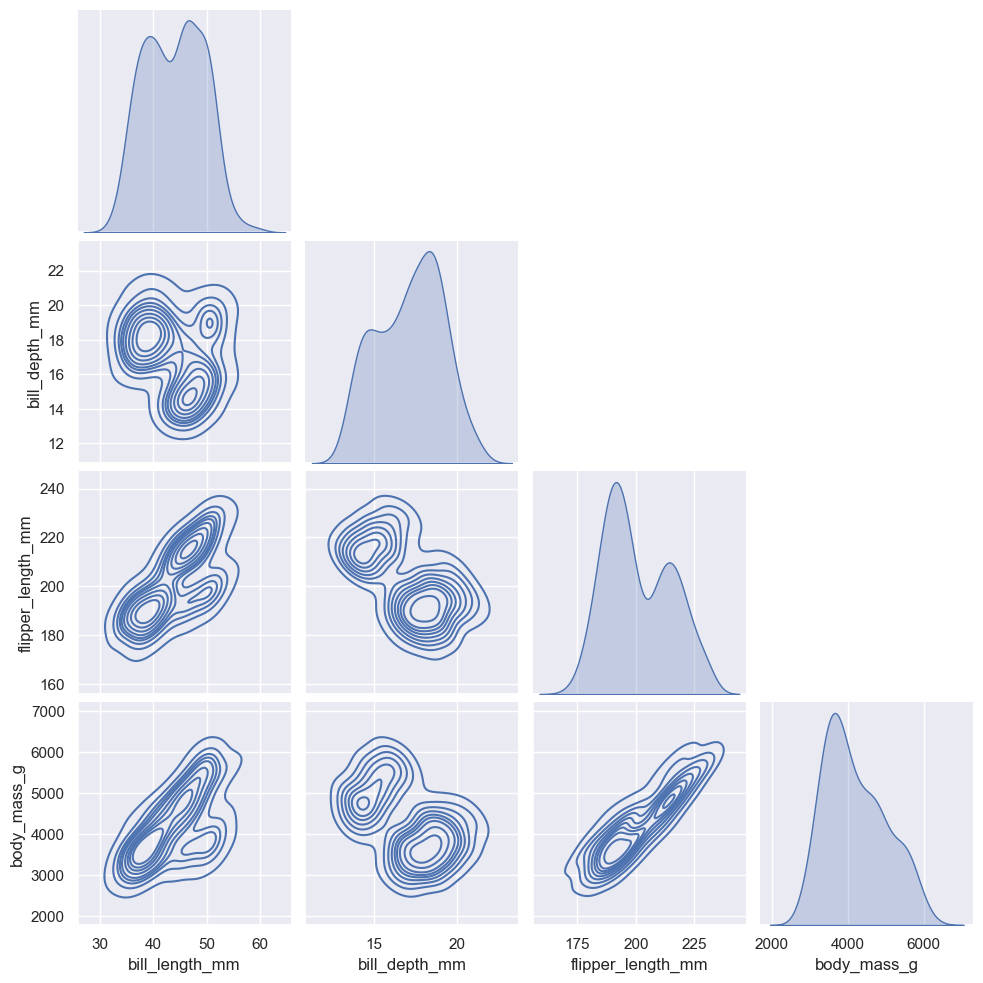

In [106]:
sb.pairplot(penguins,kind='kde',corner=True)

We can filter the plots using hue.

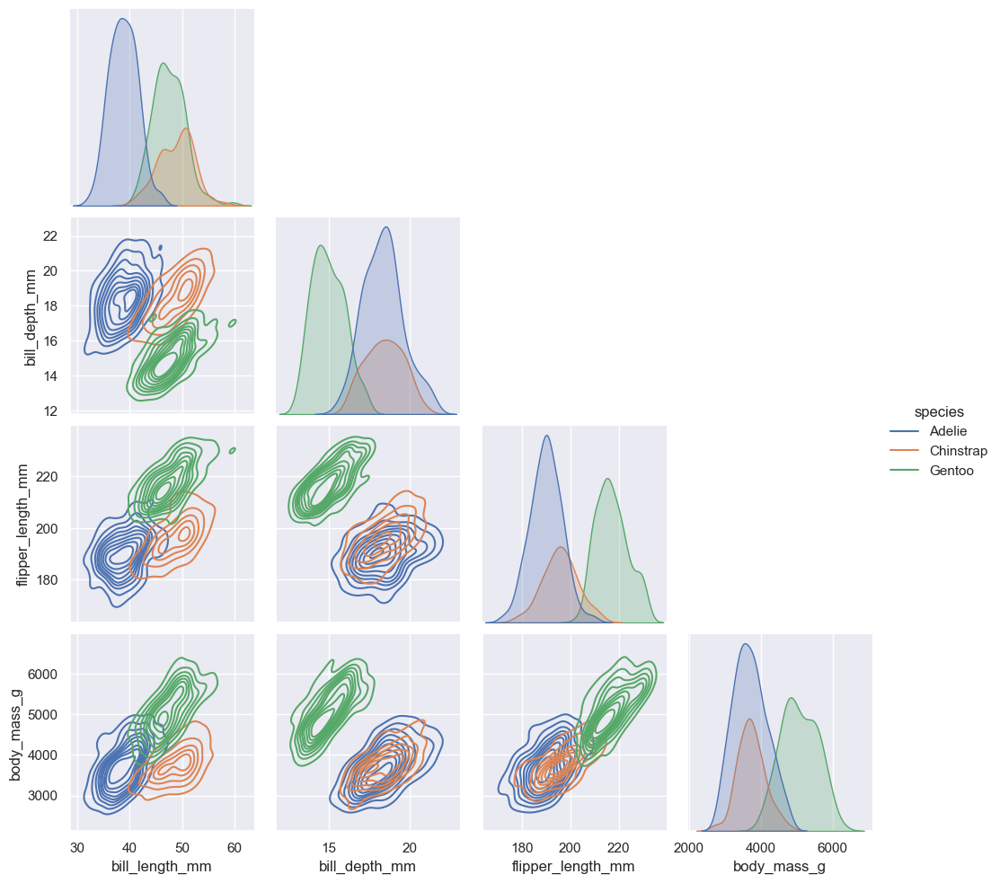

In [107]:
# filtering on species
sb.pairplot(penguins,kind='kde', corner=True, hue='species')

    Caution:Try not to use pair plots with a dataset that has many numerical variables as the subplots will become too many!

*penguins has 4 numerical variables and we have generated 16 subplots.*

*If your dataset has 6 numerical variables, you will get 36 subplots.*

So. you should filter your dataset to variables you really need before you use the pairplots method.

## Jointplot

https://seaborn.pydata.org/generated/seaborn.jointplot.html#seaborn.jointplot

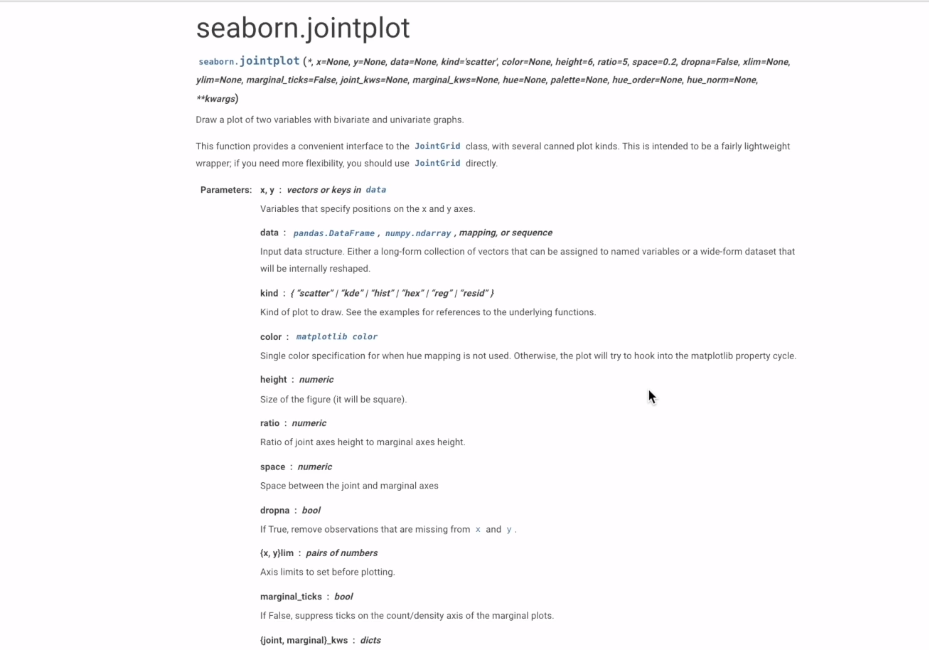

 A jointplot can plot a single measure and a two-measure plot into a single graph.

<Axes: xlabel='bill_length_mm', ylabel='body_mass_g'>

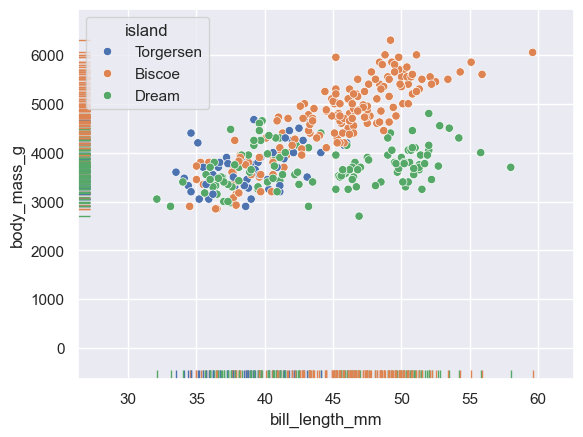

In [108]:
# Recall how , we plotted a single and two-measure plot before was by overlaying them on each other.

sb.rugplot(data=penguins, x="bill_length_mm", y="body_mass_g", hue='island')
sb.scatterplot(data=penguins, x="bill_length_mm", y="body_mass_g", hue='island')

We can do this, with a joint plot.

A jointplot by default will plot a histogram as the single measure chart and a scatterplot for the bivariate measure chart or a kde chart for the bivariate measure chart if you used hue.

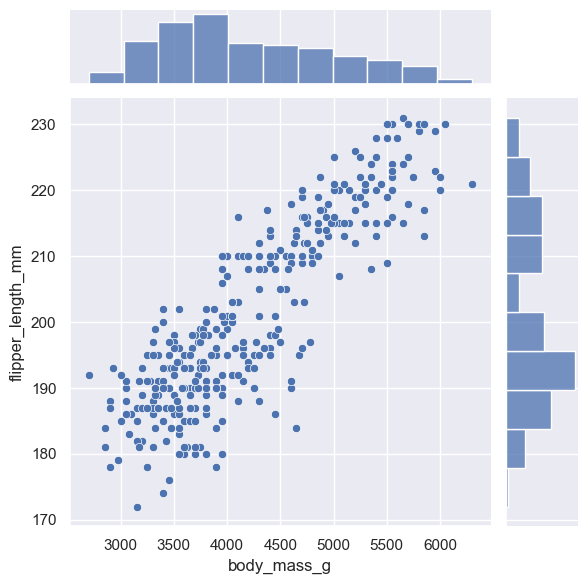

In [109]:
sb.jointplot(x='body_mass_g',y='flipper_length_mm',data=penguins)

For the kind we have 'reg','kde','hex','scatter' and 'hist'.

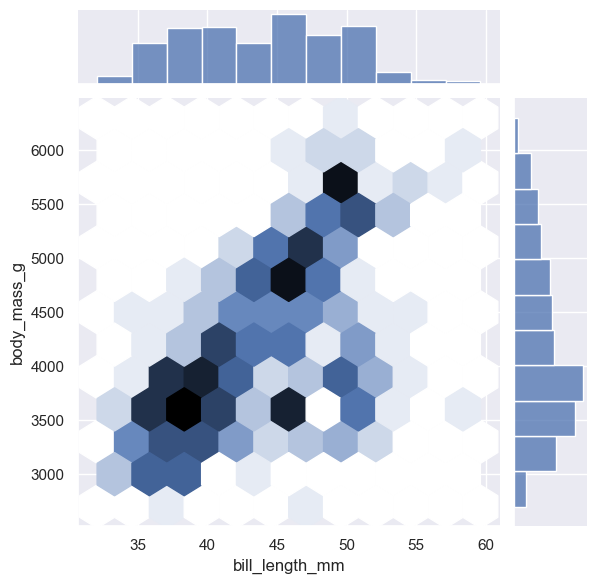

In [110]:
#changing it to hex
sb.jointplot(x='bill_length_mm',y='body_mass_g',data=penguins,kind='hex')

The dark regions represent areas of high concentration.

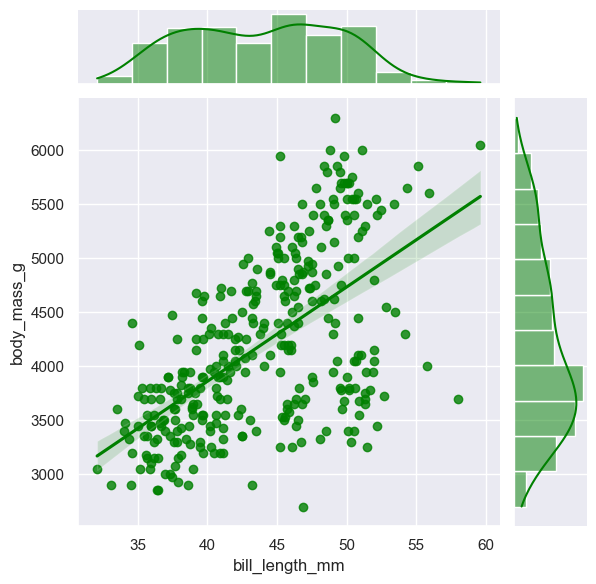

In [111]:
#changing it to reg
sb.jointplot(x='bill_length_mm',y='body_mass_g',data=penguins,kind='reg',color='green')

We can be specific the chart we want on the inside using the plot_joint() and for the outerplot we use .plot_marginals().

However, the charts we specify will be overlayed to default chart times, so it is important you pick a chart that works with scatter plot for the .plot_join() and one that works with a histogram for the .plot_marginals()

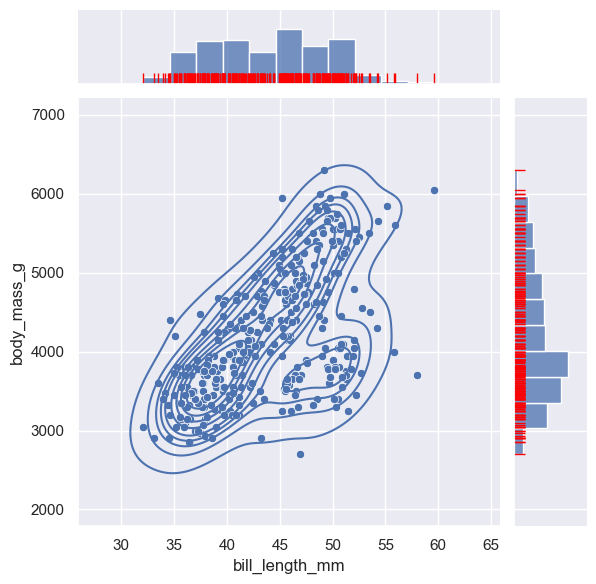

In [112]:
g=sb.jointplot(x='bill_length_mm',y='body_mass_g',data=penguins)
g.plot_joint(sb.kdeplot)
g.plot_marginals(sb.rugplot,color='red',height=0.15)

# Mutliplot Grids

They are different types of multiplots other than the facet grids which we have been using throughout , especially in relplots,lmplots and displots.

In [113]:
penguins.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


## FacetGrid

https://seaborn.pydata.org/generated/seaborn.FacetGrid.html#seaborn.FacetGrid

Facetgrids include relplots,displots and lmplots and allow for all their unique types of plots rather than a particular branch one offers individually.

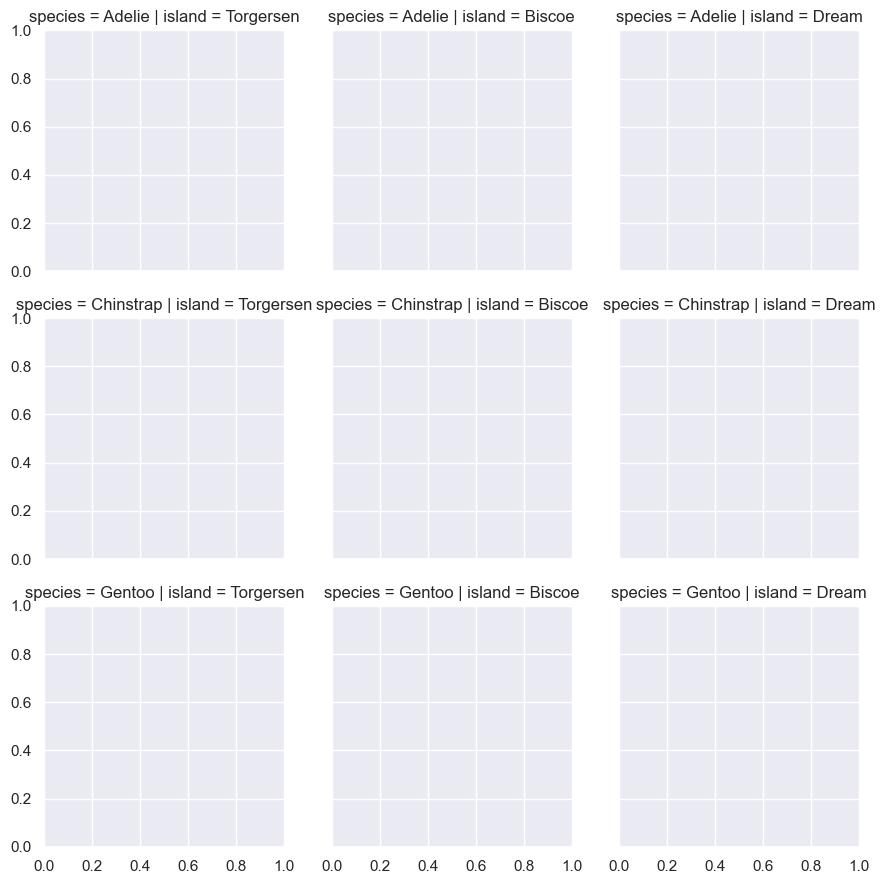

In [114]:
sb.FacetGrid(data=penguins,row='species',col='island')

The above code is the first step in creating a mutliplot grind. The next step is to save the charts we have created into an object and then use .map_dataframe() to pass a chart in it. 

The facetting has already been done by the above code.

*Syntax*
>facet_object=sb.Facetgrid(row='', column='' ,data='')

>facet_object.map_dataframe(seaborn.plotname, x='') - for single measure plots eg histograms,rugplots

>facet_object.map_dataframe(seaborn.plotname, x='',y='') -for multi measure plots ie lineplots,scatterplots,regplots

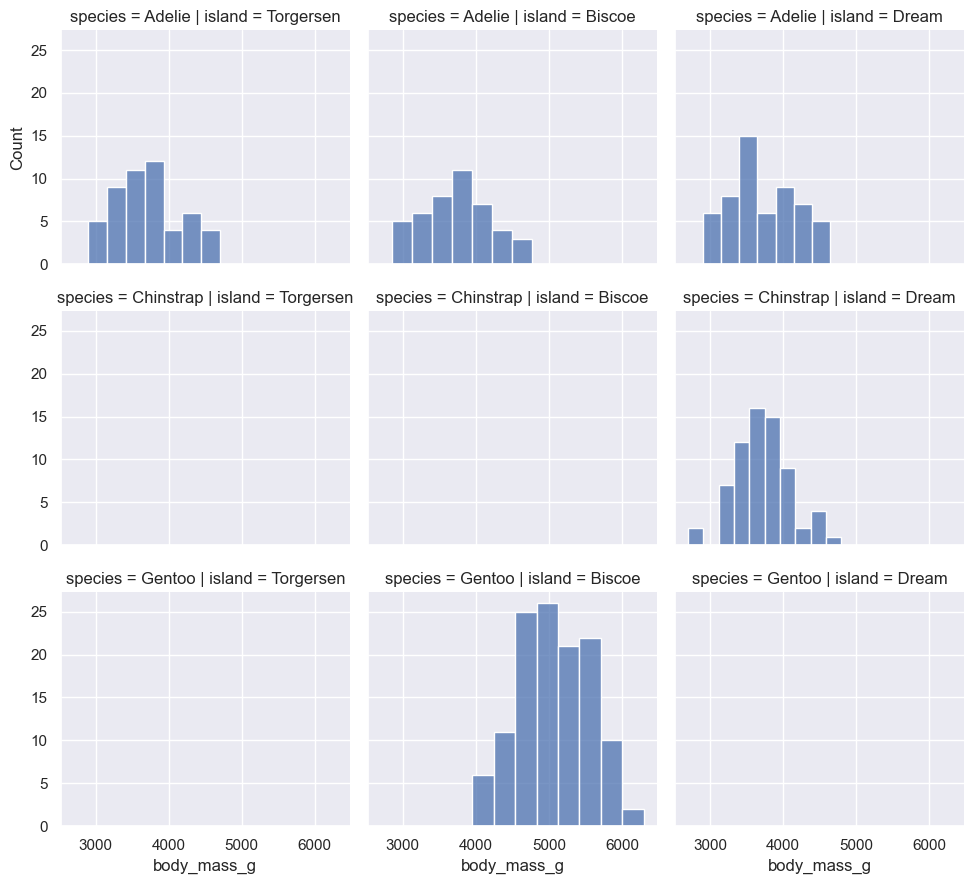

In [115]:
pt=sb.FacetGrid(data=penguins,row='species',col='island',height=3,aspect=1.1)

pt.map_dataframe(sb.histplot,x='body_mass_g')

Empty graphs mean that that species is not located in that island.

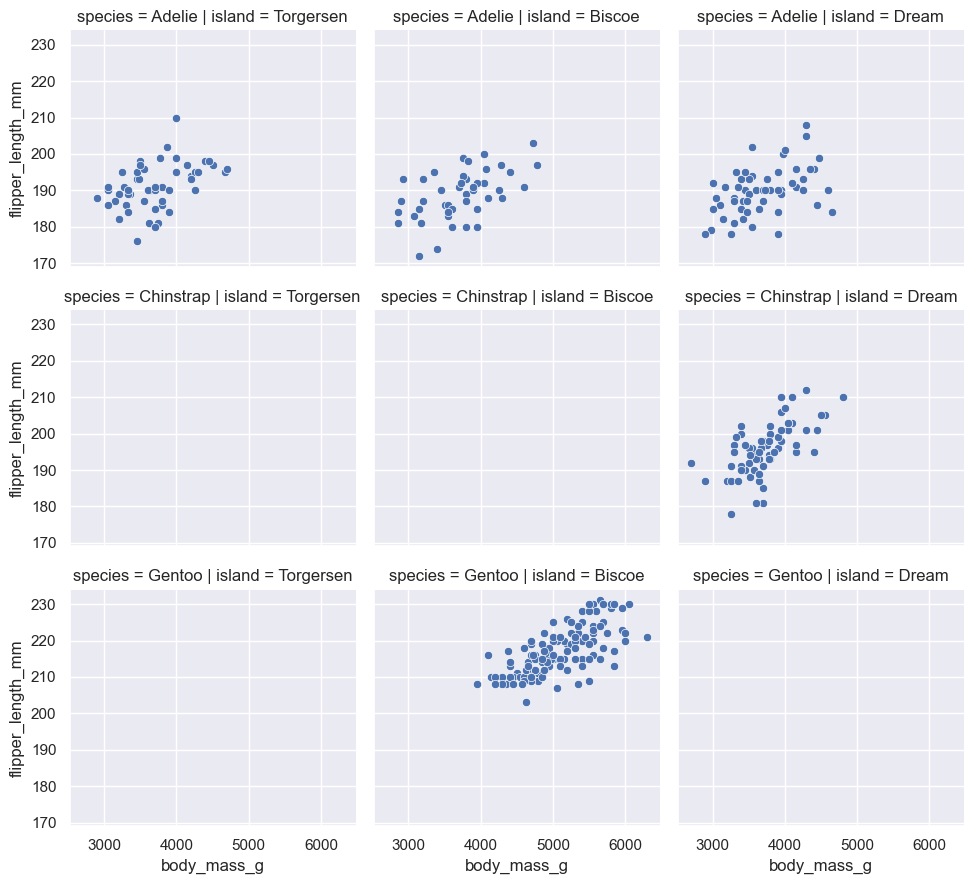

In [116]:
# lets try out a scatterplot
pt=sb.FacetGrid(data=penguins,row='species',col='island',height=3,aspect=1.1)

pt.map_dataframe(sb.scatterplot,x='body_mass_g',y='flipper_length_mm')

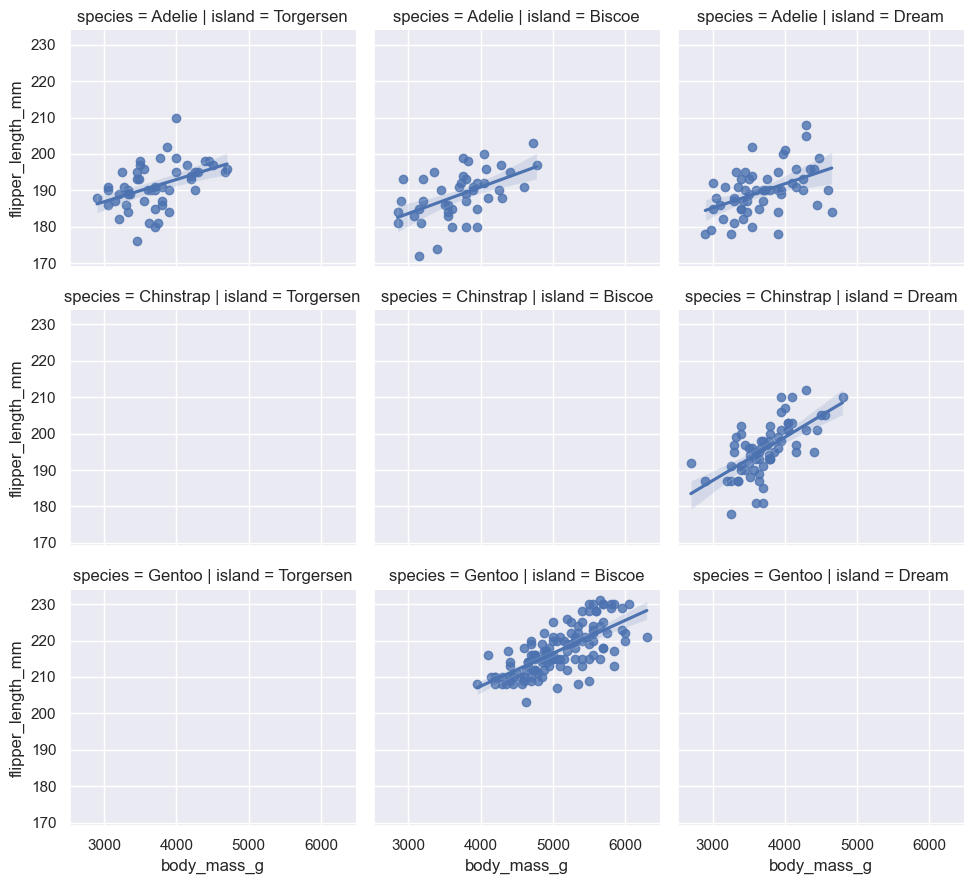

In [117]:
# lets try out a regplot
pt=sb.FacetGrid(data=penguins,row='species',col='island',height=3,aspect=1.1)

pt.map_dataframe(sb.regplot,x='body_mass_g',y='flipper_length_mm')

## PairGrid

https://seaborn.pydata.org/generated/seaborn.PairGrid.html#seaborn.PairGrid

Similar to FacetGrid the PairGrid creates empty charts which you pass in the exact chart in the subsequent codes.

A PairGrid will create charts for pairwise relationships for your datasets.

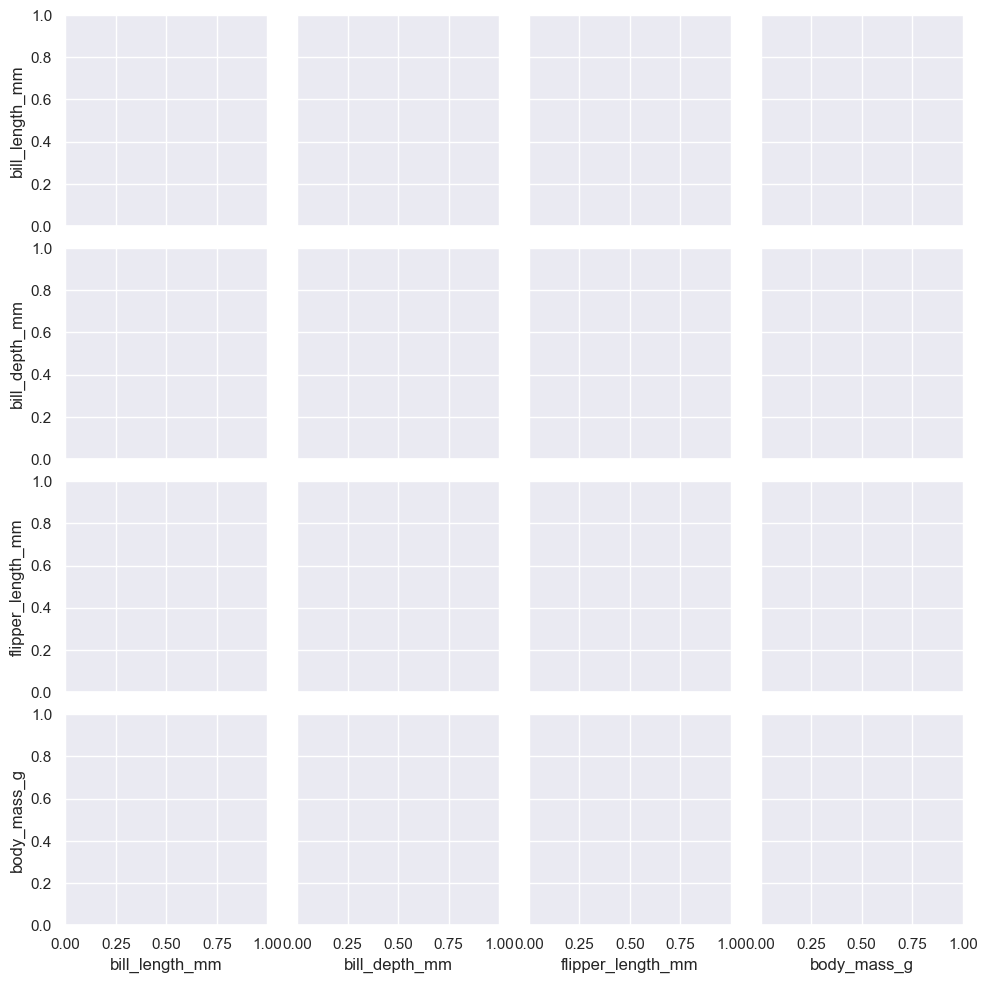

In [118]:
sb.PairGrid(penguins)

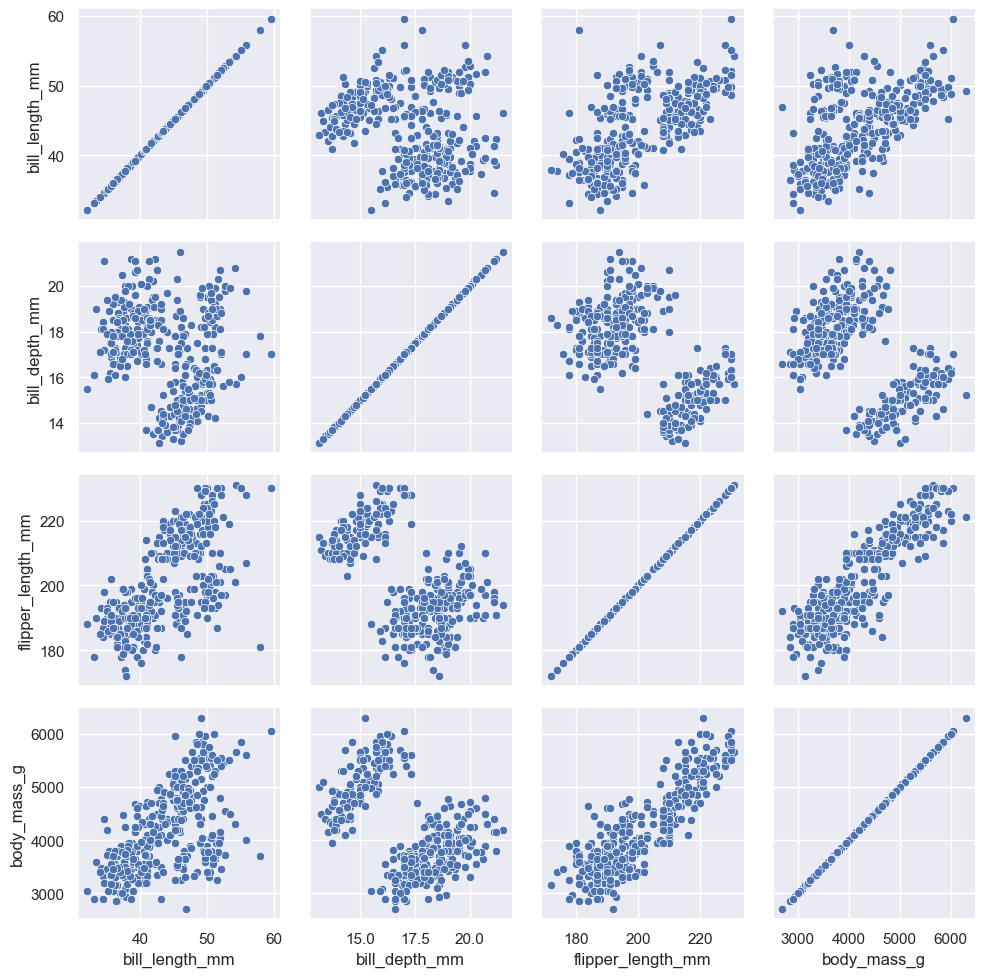

In [119]:
pt=sb.PairGrid(penguins)
pt.map(sb.scatterplot)

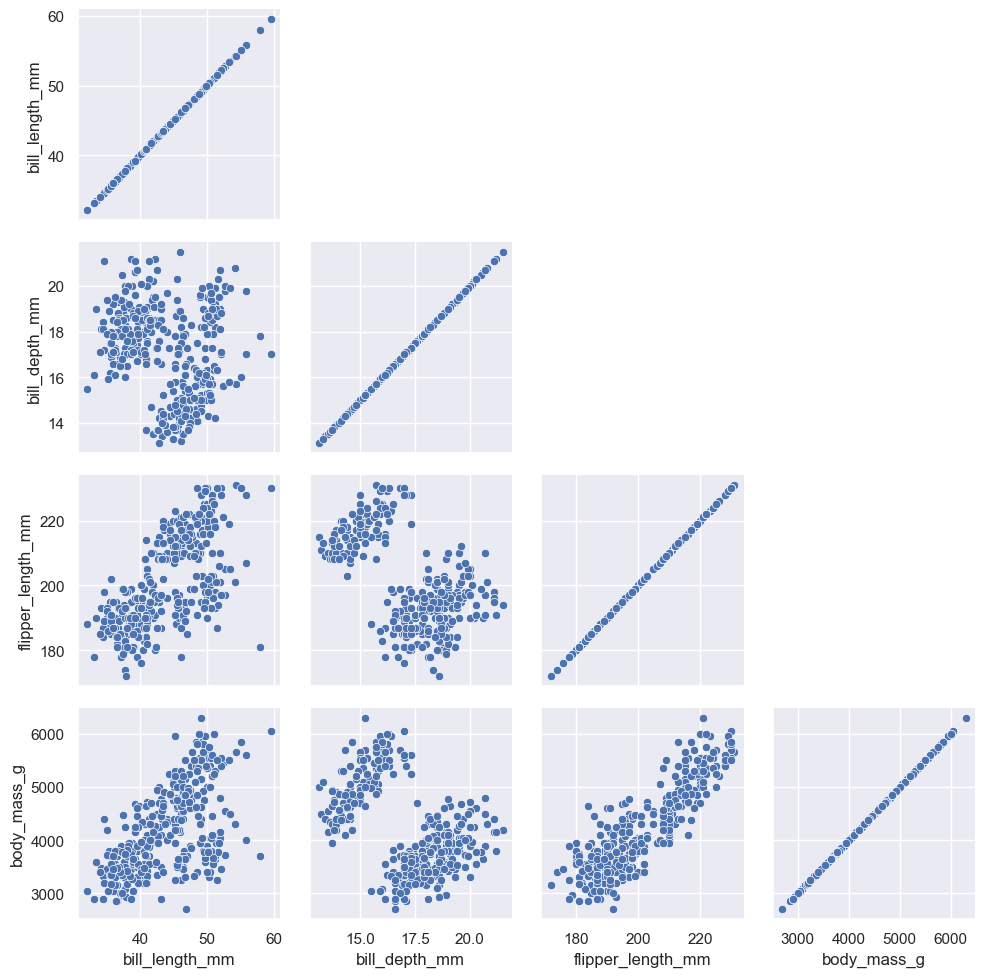

In [120]:
# removing the mirrored plots
pt=sb.PairGrid(penguins,corner=True)
pt.map(sb.scatterplot)

We can have mix of plots using the map_diag, map_upper,map_lower options.

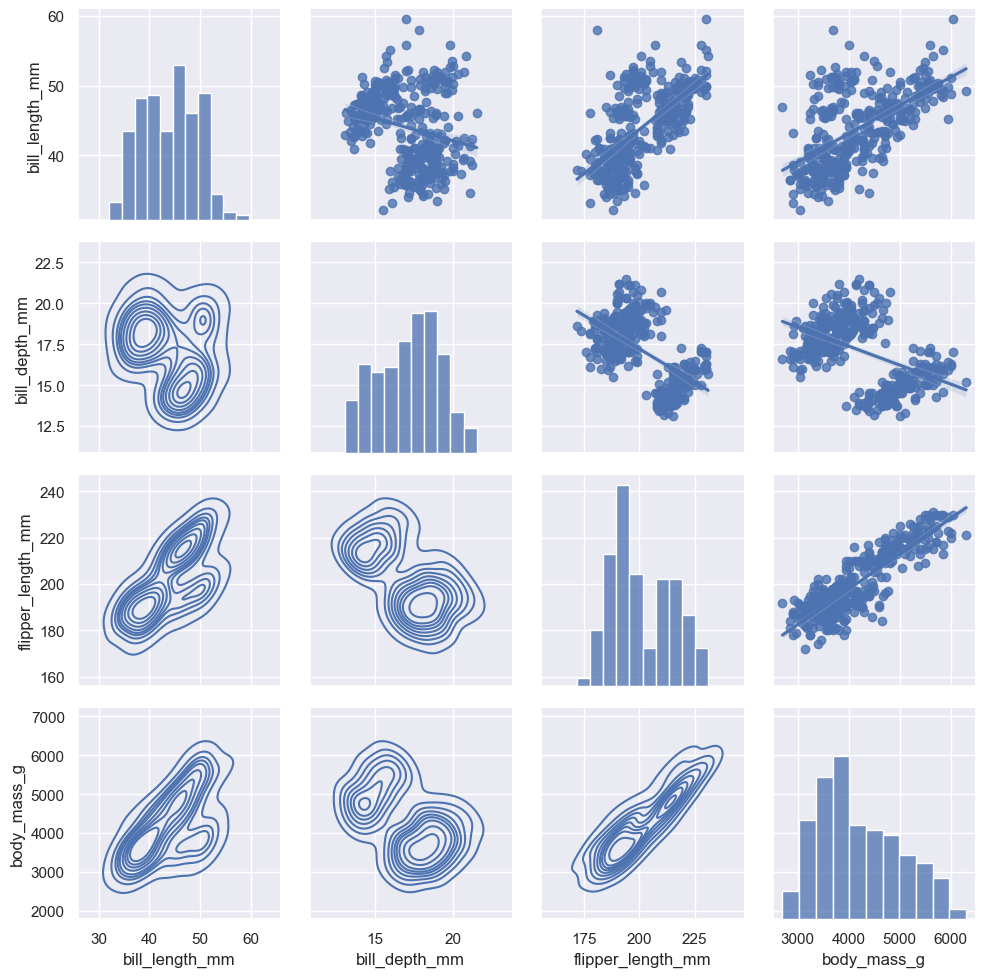

In [121]:
pt=sb.PairGrid(penguins)
pt.map_diag(sb.histplot)
pt.map_lower(sb.kdeplot)
pt.map_upper(sb.regplot)

## JointGrid

https://seaborn.pydata.org/generated/seaborn.JointGrid.html#seaborn.JointGrid

Just like the above grid plots, the first code creates an empty joint grid and then we pass the plots with subsequent codes.

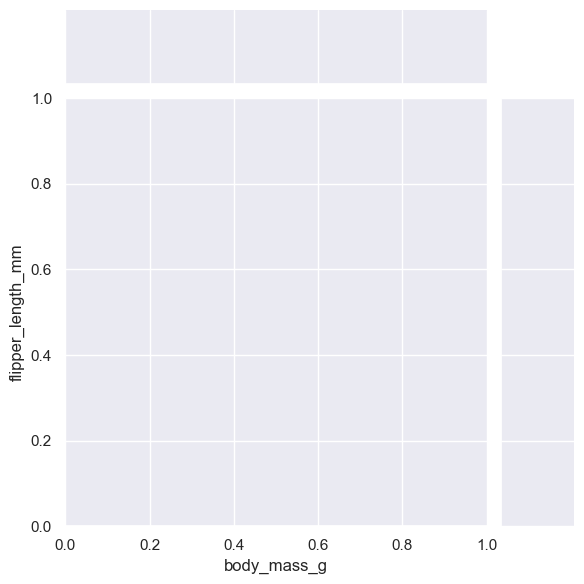

In [122]:
sb.JointGrid(data=penguins,x='body_mass_g',y='flipper_length_mm')

For this grid, use .method() to pass the jointplot and the marginal plot.

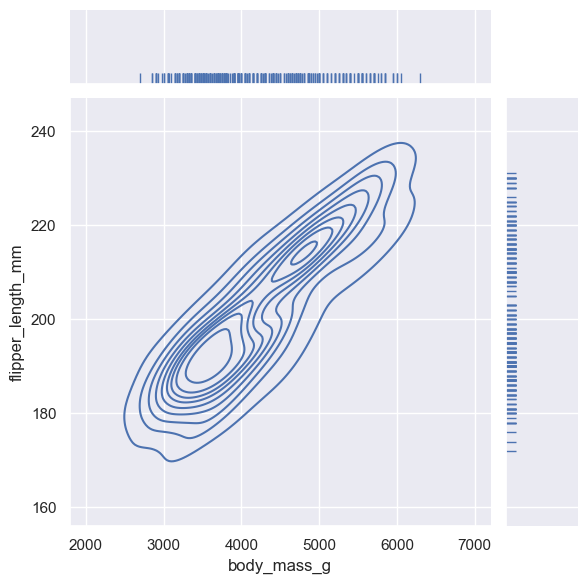

In [123]:
g=sb.JointGrid(data=penguins,x='body_mass_g',y='flipper_length_mm')
g.plot_joint(sb.kdeplot)
g.plot_marginals(sb.rugplot,height=0.15)

The difference from jointplots is you are not forced to abide by the default scatterplot and histogram. You can choose whatever two plots you like.

Alternatively, jointplots allows us to write the normal seaborn plot codes and just reference the JointGrid object as the axis.

<Axes: xlabel='Density', ylabel='flipper_length_mm'>

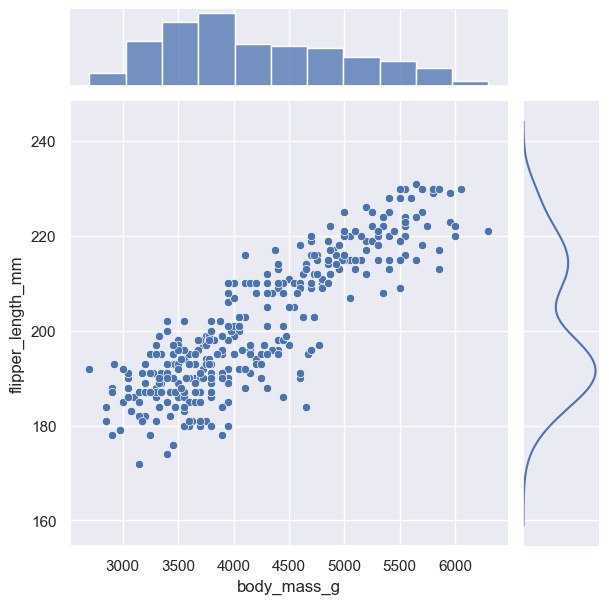

In [124]:
g=sb.JointGrid()

sb.scatterplot(x='body_mass_g',y='flipper_length_mm',data=penguins,ax=g.ax_joint)
sb.histplot(x='body_mass_g',data=penguins,ax=g.ax_marg_x) # for the upper marginal plot
sb.kdeplot(y='flipper_length_mm',data=penguins,ax=g.ax_marg_y) # for the left marginal plot. And change the x to be a y

# Since these plots share a scale , make use you similar x for the upper marginal plot as the joint plot and 
# similar y axis for the left marginal plot as the y axis of the joint plot.

# Matrix plots

These are plots that require data to be in a martix format. i.e a variable along the index column and another variable along the column.
Additionally, the entries in the cells are some aggregate statistic such as sum etc.

In [125]:
players=pd.read_csv(r'C:\Users\ADMIN\Desktop\MY COURSES\PYTHON KNOWLEDGE\Course Resurces-Python for Data Analysis and Visualization\14 Seaborn\06 Matrix Plots\players_21.csv')

In [126]:
players.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,...,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...",CAM,10.0,NaN,2004-07-01,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,...,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...",LS,7.0,NaN,2018-07-10,2022.0,LS,7.0,89.0,93.0,81.0,89.0,35.0,77.0,NaN,...,63,29,95,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3
2,200389,https://sofifa.com/player/200389/jan-oblak/210002,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,Atlético Madrid,Spain Primera Division,1.0,91,93,75000000,125000,GK,Right,3,3,1,Medium/Medium,PLAYER_BODY_TYPE_259,Yes,159400000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,...,34,19,11,65,11,68,NaN,12,18,87,92,78,90,90,33+3,33+3,33+3,32+0,35+0,35+0,35+0,32+0,38+3,38+3,38+3,35+3,38+3,38+3,38+3,35+3,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3
3,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern München,German 1. Bundesliga,1.0,91,91,80000000,240000,ST,Right,4,4,4,High/Medium,PLAYER_BODY_TYPE_276,Yes,132000000.0,"#Distance Shooter, #Clinical Finisher",ST,9.0,NaN,2014-07-01,2023.0,NaN,NaN,78.0,91.0,78.0,85.0,43.0,82.0,NaN,...,81,49,94,79,88,88,NaN,42,19,15,6,12,8,10,89+2,89+2,89+2,85+0,87+0,87+0,87+0,85+0,85+3,85+3,85+3,83+3,79+3,79+3,79+3,83+3,64+3,65+3,65+3,65+3,64+3,61+3,60+3,60+3,60+3,61+3
4,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,28,1992-02-05,175,68,Brazil,Paris Saint-Germain,French Ligue 1,1.0,91,91,90000000,270000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,166500000.0,"#Speedster, #Dribbler, #Playmaker, #FK Special...",LW,10.0,NaN,2017-08-03,2022.0,NaN,NaN,91.0,85.0,86.0,94.0,36.0,59.0,NaN,...,51,36,87,90,92,93,NaN,30,29,9,9,15,15,11,84+3,84+3,84+3,90+0,89+0,89+0,89+0,90+0,90+1,90+1,90+1,90+1,83+3,83+3,83+3,90+1,67+3,62+3,62+3,62+3,67+3,62+3,49+3,49+3,49+3,62+3


We can exclude a particular entries in a column of a dataset by passing ~ before the column name and passing the entries inside an .isin() method.

*Syntax*

>dataframe[~dataframe['columnname'].isin(['entry1','entry2',..])]


In [127]:
# excluding RES(reserves) and SUB(substitute) from the team position column
players=players[~players['team_position'].isin(['RES','SUB'])]

In [128]:
player_matrix = pd.pivot_table(data=players, index='overall', columns='team_position', values='sofifa_id',aggfunc='count',fill_value=0 )

In [129]:
player_matrix.head()

team_position,CAM,CB,CDM,CF,CM,GK,LAM,LB,LCB,LCM,LDM,LF,LM,LS,LW,LWB,RAM,RB,RCB,RCM,RDM,RF,RM,RS,RW,RWB,ST
overall,,,,,,,,,,,,,,,,,,,,,,,,,,,
47,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0
48,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
49,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0
50,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
51,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,2,1,0,0,0,1,0,0,0,0


In [130]:
# let us sort overall in descending order
player_matrix.sort_values(by='overall',ascending=False,inplace=True)

In [131]:
player_matrix.head()

team_position,CAM,CB,CDM,CF,CM,GK,LAM,LB,LCB,LCM,LDM,LF,LM,LS,LW,LWB,RAM,RB,RCB,RCM,RDM,RF,RM,RS,RW,RWB,ST
overall,,,,,,,,,,,,,,,,,,,,,,,,,,,
93,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
92,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1
90,0,0,0,0,0,2,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0
89,0,0,1,1,0,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Now, under matrix plots we will cover heatmaps and clustermaps.

## Heatmaps

https://seaborn.pydata.org/generated/seaborn.heatmap.html#seaborn.heatmap


<Axes: xlabel='team_position', ylabel='overall'>

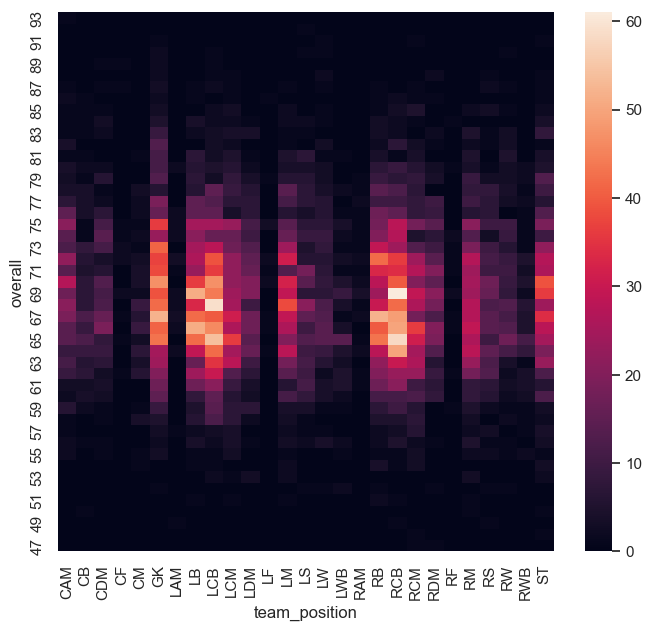

In [132]:
plt.figure(figsize=[8,7])

sb.heatmap(player_matrix)

* We have the highest concetration of players with overalls from 63 to 77.
* Positions such as Goalkeeper(GK),Leftback(LB),LeftCenterBack(LCB),Rightback(LB),RightCenterBack(LCB) have alot of players in relation to the other positions.

<Axes: xlabel='team_position', ylabel='overall'>

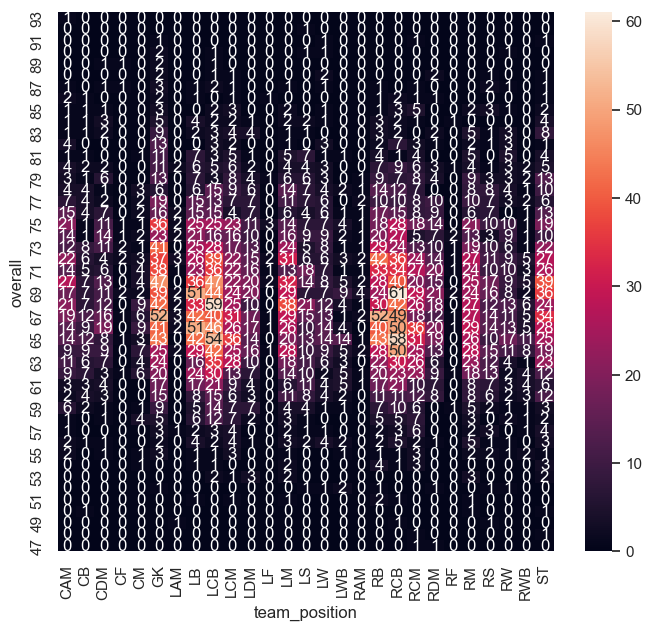

In [133]:
plt.figure(figsize=[8,7])

# we can superimpose the exact entries using annot=True. This will add the text of the entries.
sb.heatmap(player_matrix,annot=True)

<Axes: xlabel='team_position', ylabel='overall'>

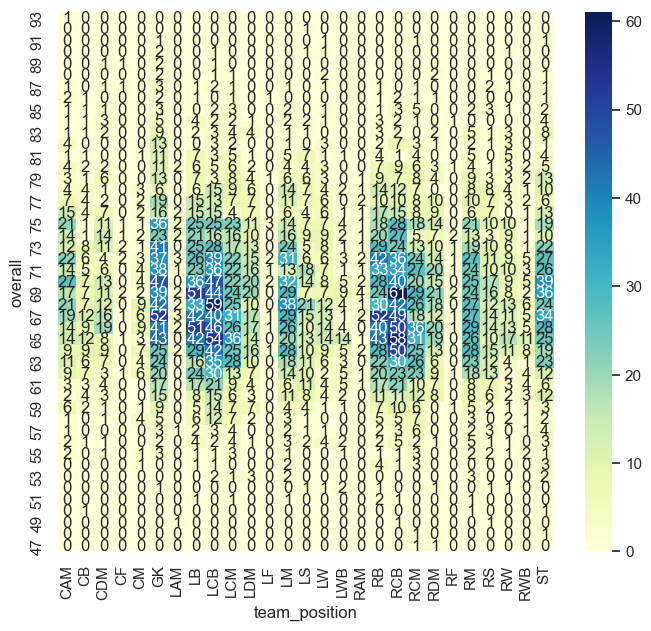

In [134]:
# we can change the color to something that agrees with the annotation.

plt.figure(figsize=[8,7])

sb.heatmap(player_matrix,annot=True,cmap='YlGnBu') # the codes are in the resource.

## Clustermap

A clustermap is similar to heatmap but it uses a heirachical system to grow similar values together.

https://seaborn.pydata.org/generated/seaborn.clustermap.html#seaborn.clustermap

<Figure size 800x700 with 0 Axes>

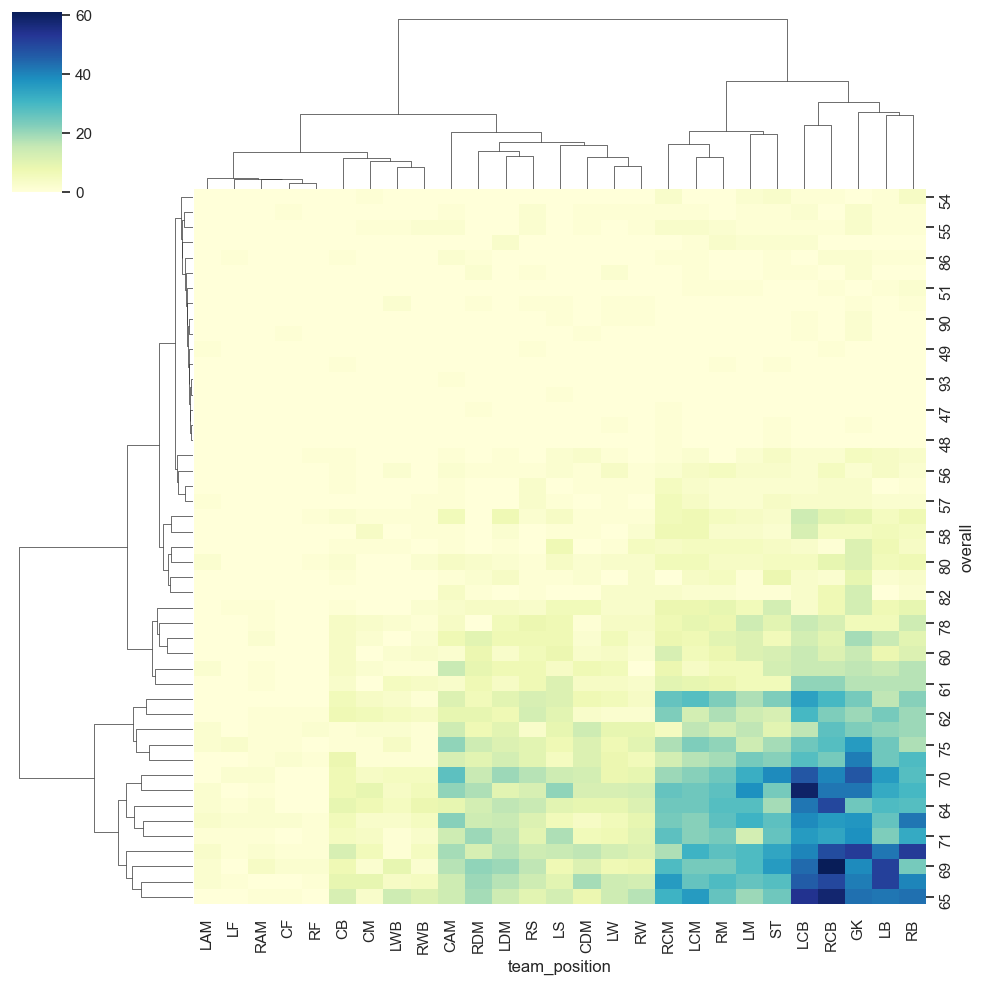

In [135]:
plt.figure(figsize=[8,7])

sb.clustermap(player_matrix,cmap='YlGnBu')

As you can see similar values have been clusterred together: the positions with least number of players are to the left and the positions with the most number of players are to the right. 

Also most common overall ratings have been clustered towards the bottom and the least common overall ratings have been clustered towards the top.

# Style and Presentation Tips

In [136]:
import matplotlib.pyplot as plt
import seaborn as sb
import pandas as pd

In [137]:
penguins=sb.load_dataset('penguins')

In [138]:
penguins.dropna(inplace=True)

In [139]:
x=penguins['body_mass_g']
y=penguins['flipper_length_mm']

## Title and Labels

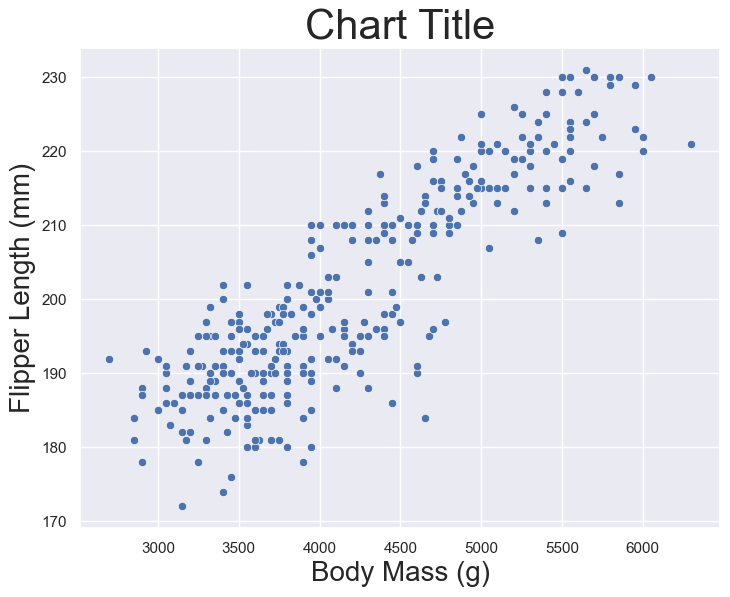

In [140]:
# Using matplot functionalities to create a title and labels.

fig=plt.figure()
axes=fig.add_axes([0,0,1,1])

axes.set_title('Chart Title', fontsize=30)
axes.set_ylabel('Flipper Length (mm)', fontsize=20)
axes.set_xlabel('Body Mass (g)', fontsize=20)

sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

Howver, we can add these from seaborn directly using the .set() method.

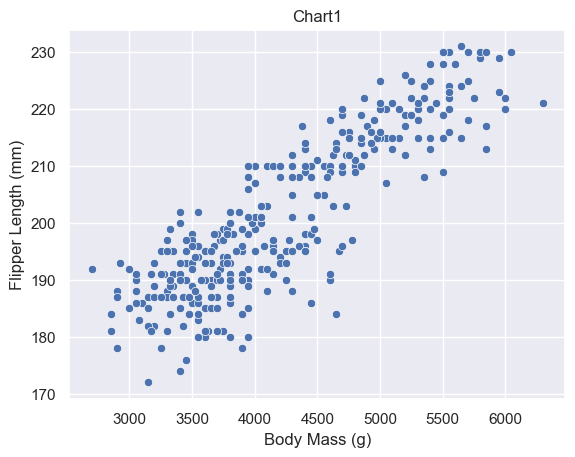

In [141]:
g=sb.scatterplot(data=penguins,x=x,y=y)

g.set(title='Chart1',xlabel='Body Mass (g)', ylabel='Flipper Length (mm)')

sb.set(font_scale=1.2) # the font_scale must be passed as a singular arguement.

plt.show()

## Figuresize

We already know how to adjust the figuresize using Matplotlib's figsize. 

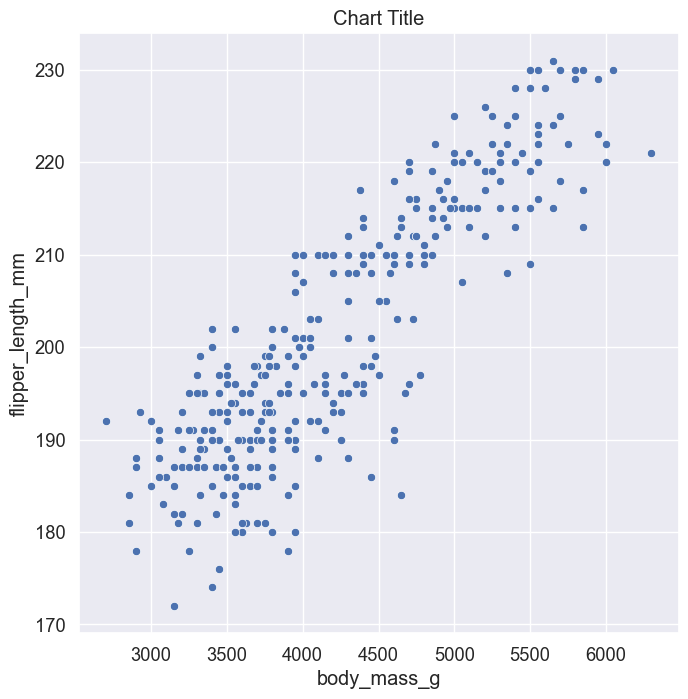

In [142]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

sb.scatterplot(data=penguins,x=x,y=y)

ax1.set_title('Chart Title')
plt.show()

## Context

The datapoints and axes can be displayed in various sizes if you specify the context. 

* We have poster, which makes the parameters visible in a poster.
* We have notebook, which makes the parameters visible in jupyternotebook
* We have paper, which makes the parameters visible in figures embedded in documents
* We have paper, which makes the parameters visible for presentations i.e talks.

*Syntax*
>seaborn.set_context('context_name')

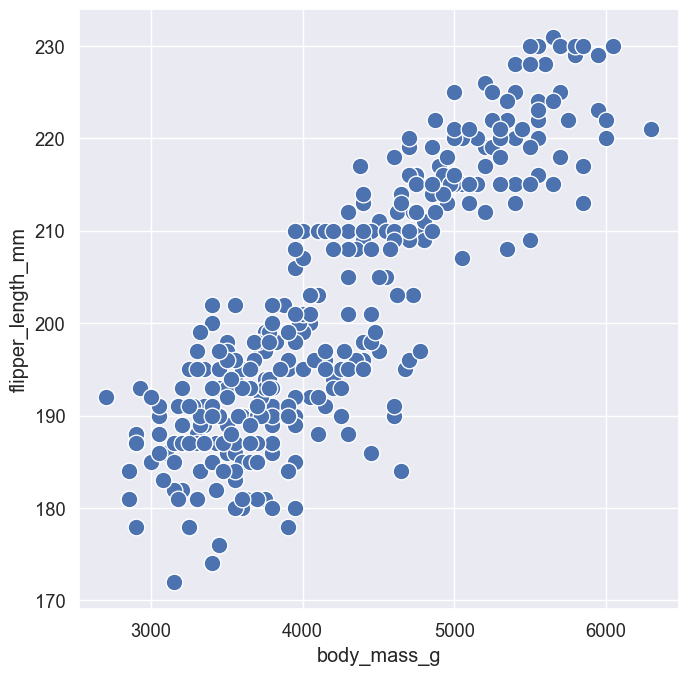

In [143]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

sb.set_context('poster')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

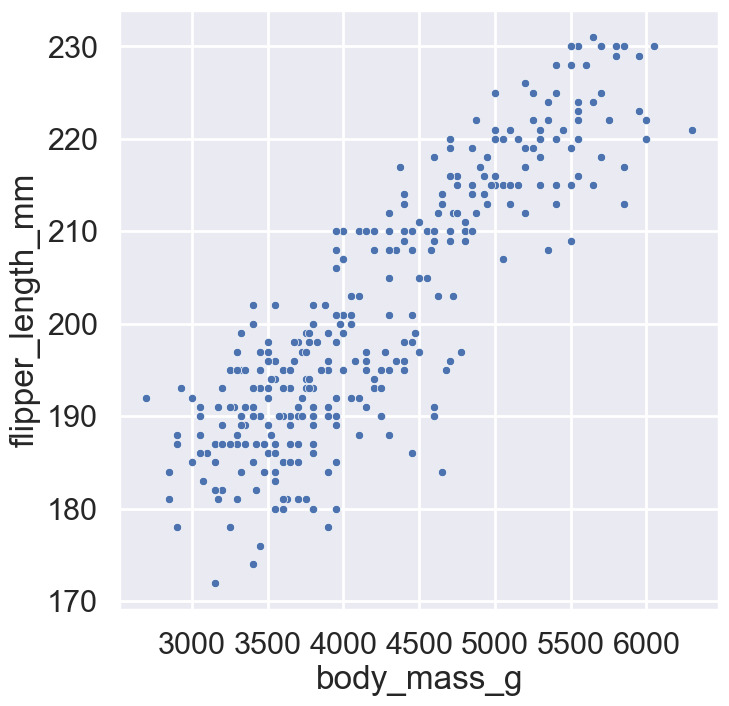

In [144]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

sb.set_context('notebook')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

The scales are massive now.

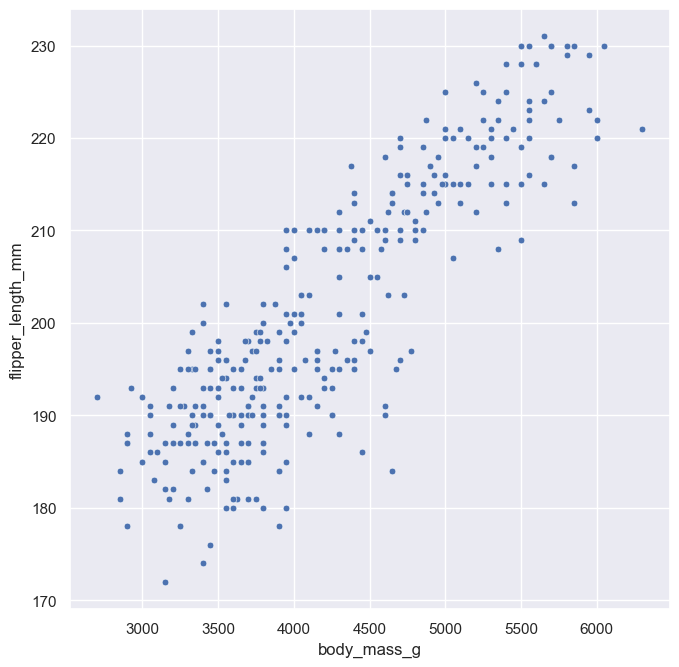

In [145]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

sb.set_context('paper')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

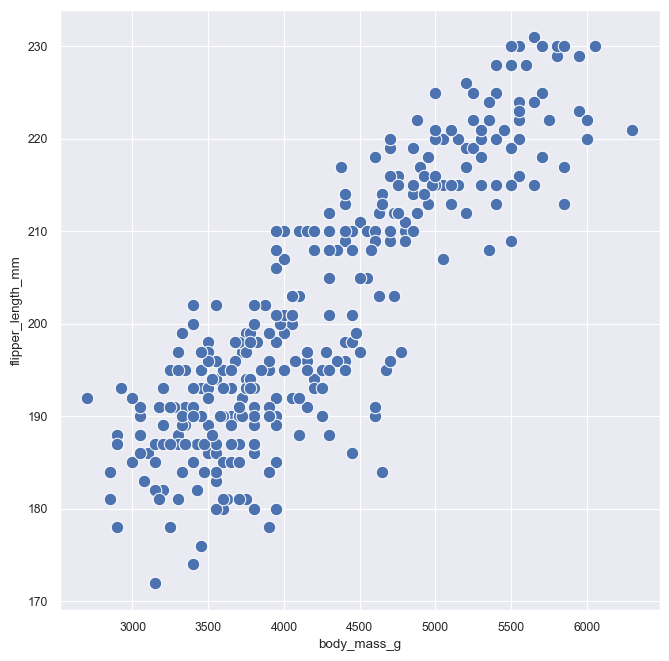

In [146]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

sb.set_context('talk')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

## Style

You can set your seaborn style using seaborn.set_style('style_name')

<i>For this section, let us use the paper context

In [147]:
sb.set_context('paper')

In [148]:
sb.set_style('whitegrid')

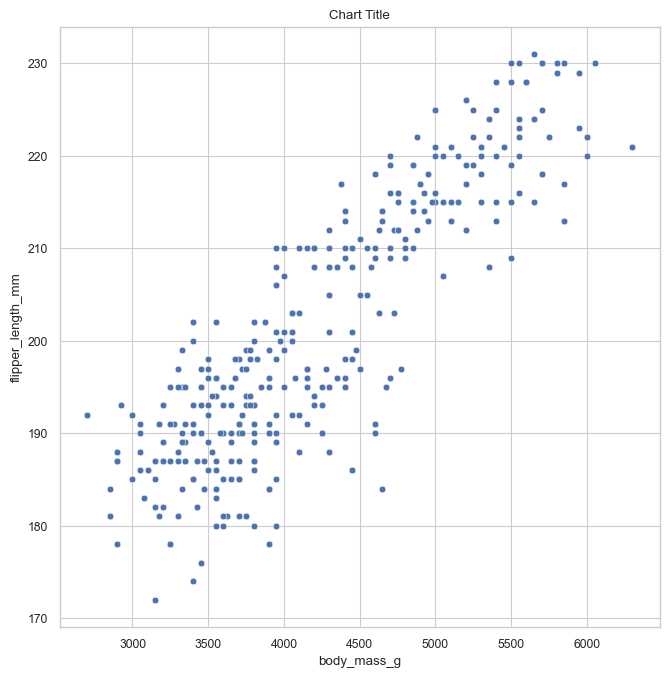

In [149]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

ax1.set_title('Chart Title')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

In [150]:
sb.set_style('darkgrid')

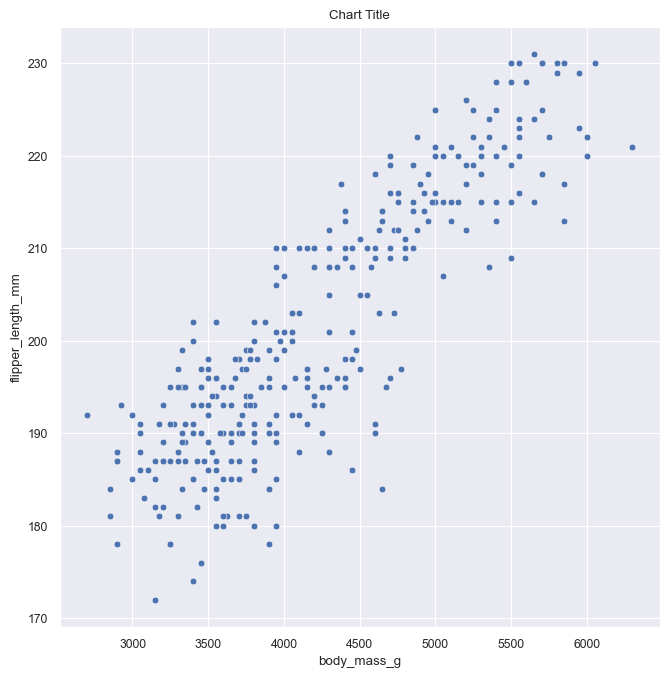

In [151]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

ax1.set_title('Chart Title')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

In [152]:
sb.set_style('white')

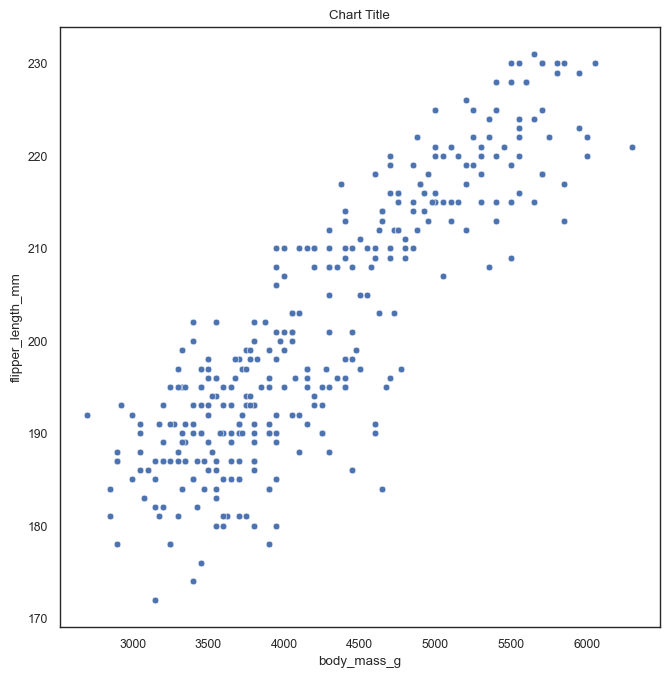

In [153]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

ax1.set_title('Chart Title')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

In [154]:
sb.set_style('dark')

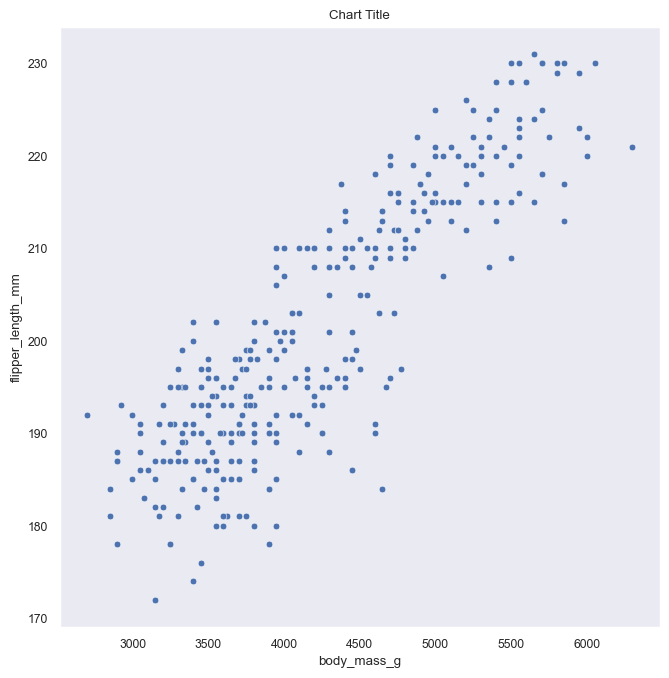

In [155]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

ax1.set_title('Chart Title')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

In [156]:
sb.set_style('ticks')

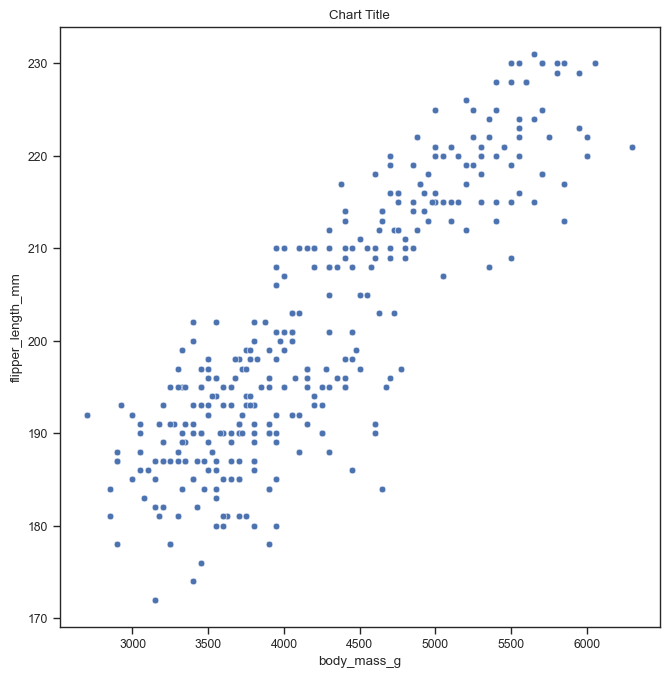

In [157]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

ax1.set_title('Chart Title')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

## Themes

### List of palettes

palettes https://seaborn.pydata.org/tutorial/color_palettes.html

In [158]:
sb.set_theme(palette='pastel')

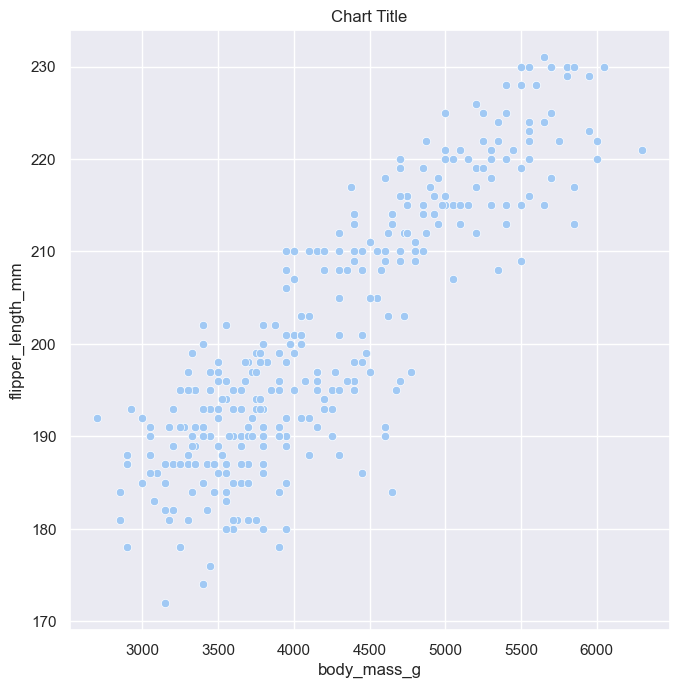

In [159]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

ax1.set_title('Chart Title')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

The .set_theme() allows for styles as well.

In [160]:
sb.set_theme(style='ticks',palette='pastel')

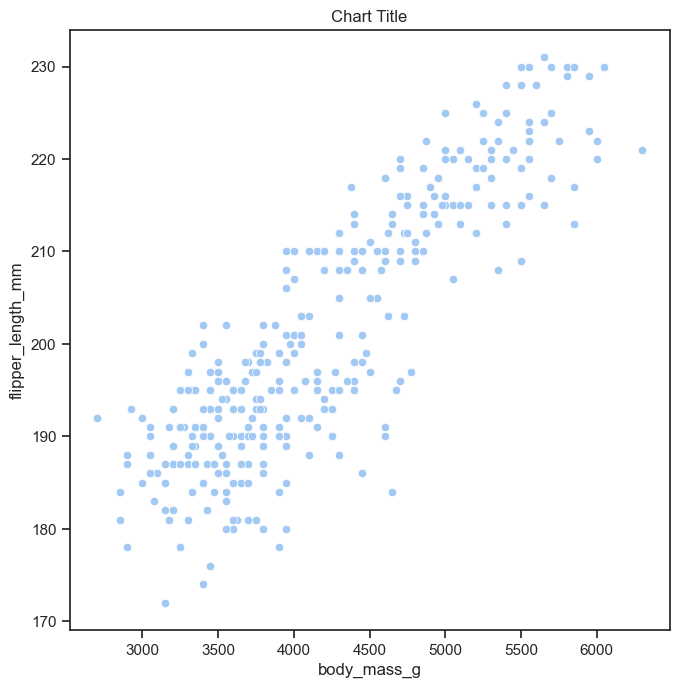

In [161]:
fig = plt.figure(figsize = (6,6))
ax1 = fig.add_axes([0,0,1,1])

ax1.set_title('Chart Title')
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

## Despine

https://seaborn.pydata.org/generated/seaborn.despine.html

This removes the top and right chart margin. This is the default

You can also remove the bottom and left spine by using the bottom and left arguements.

In [162]:
sb.set_theme(style='ticks')

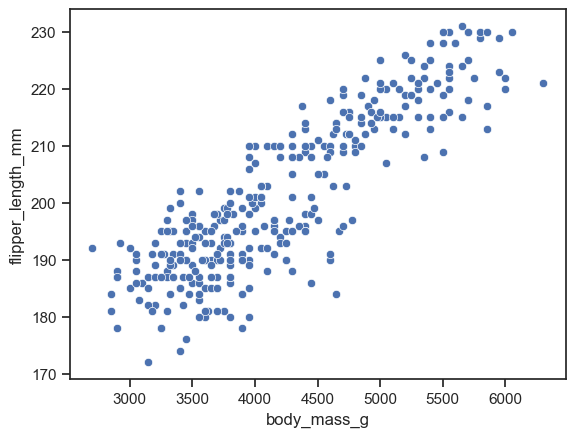

In [163]:
sb.scatterplot(data=penguins,x=x,y=y)

plt.show()

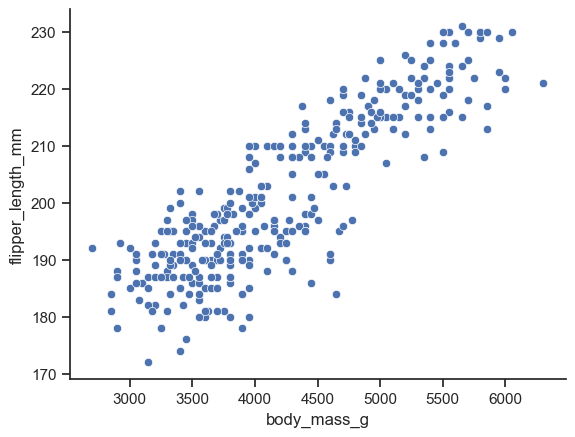

In [164]:
sb.scatterplot(data=penguins,x=x,y=y)
sb.despine()

plt.show()

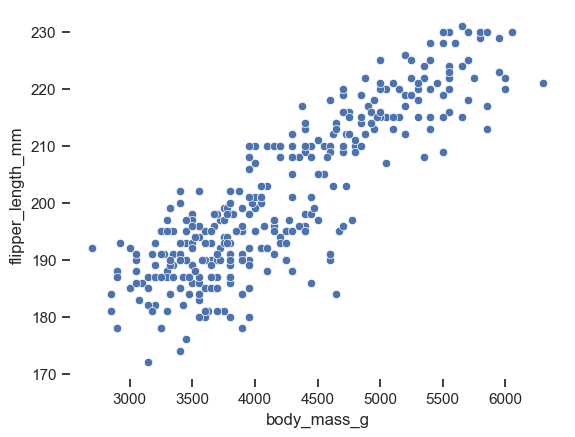

In [165]:
sb.scatterplot(data=penguins,x=x,y=y)
sb.despine(left=True, bottom=True)

plt.show()

## rcParams

https://matplotlib.org/stable/api/matplotlib_configuration_api.html

This allows you maximum freedom when designing both matplotlib and seaborn charts.

In [166]:
# code to show all customizable options 
plt.rcParams

RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': ['-layers', 'OptimizePlus'],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': True,
          'axes.edgecolor': '.15',
          'axes.facecolor': 'white',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.formatter.useoffset': True,
          'axes.grid': False,
          'axes.grid.axis': 'both',
       

<b>We can pass these together with values as a dictionary object under the rc arguement.

In [167]:
sb.set_theme(style='ticks', rc={'figure.figsize':(10,10),'axes.titlesize':20, 'axes.titlecolor':'b', 'axes.labelsize':15,'axes.labelcolor':'r','legend.loc':'center'})

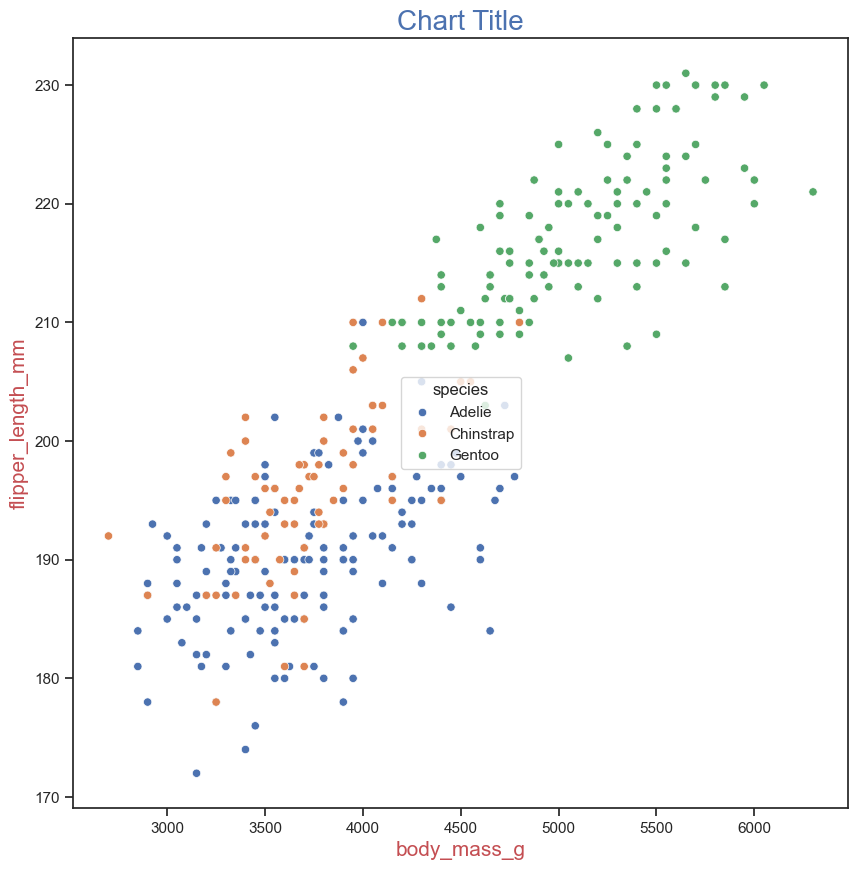

In [168]:
sb.scatterplot(data=penguins,x=x,y=y, hue='species').set(title='Chart Title')

plt.show()